# Introduction
In this notebook, I develope a Long Short-Term Memory (LSTM) neural network model to predict the Air Quality Index (AQI) from various stations.

# Import libraries

In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import keras
from keras.models import Sequential
from keras.layers import Dense, LSTM, Dropout
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, r2_score
%matplotlib inline

# Read, explore and clean data
The project involves predicting the AQI per station, so the index is set to 'StationId' to enable grouping the data by stations.

In [5]:
# import the data as a dataframe and set the 'StationId' column as the index for the dataframe
df_stn = pd.read_csv('station_day.csv', index_col = 'StationId')

Run some checks to understand the state of the dataset

In [6]:
df_stn.info()

<class 'pandas.core.frame.DataFrame'>
Index: 108035 entries, AP001 to WB013
Data columns (total 15 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   Date        108035 non-null  object 
 1   PM2.5       86410 non-null   float64
 2   PM10        65329 non-null   float64
 3   NO          90929 non-null   float64
 4   NO2         91488 non-null   float64
 5   NOx         92535 non-null   float64
 6   NH3         59930 non-null   float64
 7   CO          95037 non-null   float64
 8   SO2         82831 non-null   float64
 9   O3          82467 non-null   float64
 10  Benzene     76580 non-null   float64
 11  Toluene     69333 non-null   float64
 12  Xylene      22898 non-null   float64
 13  AQI         87025 non-null   float64
 14  AQI_Bucket  87025 non-null   object 
dtypes: float64(13), object(2)
memory usage: 13.2+ MB


In [7]:
df_stn.describe()

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI
count,86410.000000,65329.000000,90929.000000,91488.000000,92535.000000,59930.000000,95037.000000,82831.000000,82467.000000,76580.000000,69333.000000,22898.000000,87025.000000
mean,80.272571,157.968427,23.123424,35.240760,41.195055,28.732875,1.605749,12.257634,38.134836,3.358029,15.345394,2.423446,179.749290
std,76.526403,123.418672,34.491019,29.510827,45.145976,24.897797,4.369578,12.984723,39.128004,11.156234,29.348587,6.472409,131.324339
min,0.020000,0.010000,0.010000,0.010000,0.000000,0.010000,0.000000,0.010000,0.010000,0.000000,0.000000,0.000000,8.000000
25%,31.880000,70.150000,4.840000,15.090000,13.970000,11.900000,0.530000,5.040000,18.895000,0.160000,0.690000,0.000000,86.000000
50%,55.950000,122.090000,10.290000,27.210000,26.660000,23.590000,0.910000,8.950000,30.840000,1.210000,4.330000,0.400000,132.000000
75%,99.920000,208.670000,24.980000,46.930000,50.500000,38.137500,1.450000,14.920000,47.140000,3.610000,17.510000,2.110000,254.000000
max,1000.000000,1000.000000,470.000000,448.050000,467.630000,418.900000,175.810000,195.650000,963.000000,455.030000,454.850000,170.370000,2049.000000


### Grouping Data
A dictionary is created to group the data by stations. The dictionary keys are set to the station names (StationID), the values are pandas dataframes containing all data taken from the stations and the index is set to the dates which correspond to the values.

In [9]:
#convert the 'Date'column to datetime to serve as index after grouping data by StationId
dates = pd.to_datetime(df_stn['Date'], format='%Y-%m-%d')

def sort_by_station(dframe, station):
    '''returns a new dataframe of all data except AQI_Bucket and Date from a station'''
    dframe = dframe.sort_index()
    count = list(dframe.index).count(station)
    start = list(dframe.index).index(station)
    #print(count, start)
    new_frame = dframe[start:start + count].copy()
    new_frame.index = dates[start:start + count]
    new_frame.drop(['AQI_Bucket', 'Date'], axis = 1, inplace = True)
    return new_frame

In [10]:
#group data by StationId and store in a dictionary
stn_dict = {}
for stn in df_stn.index.unique():
    stn_dict[stn] = sort_by_station(df_stn, stn)

### Visualizing AQI
Line plots of the AQI agains the number of days for each station are drawn to better understand our target.

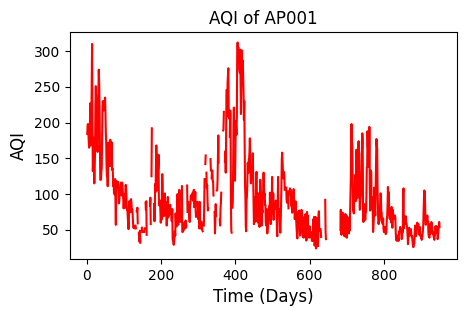

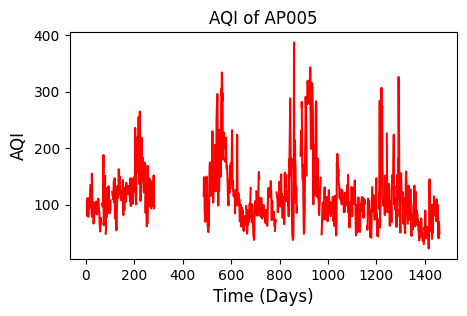

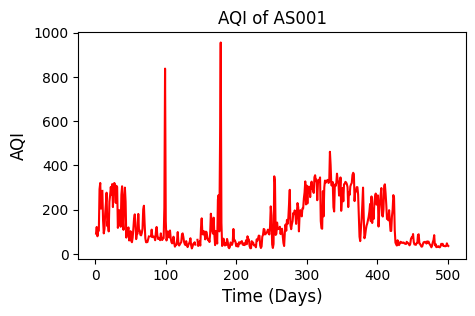

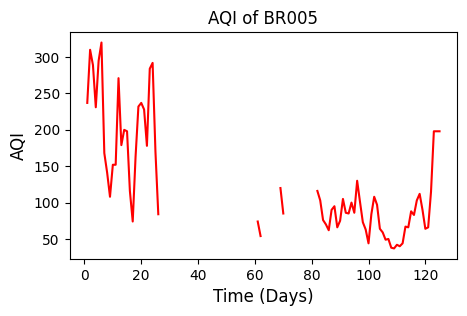

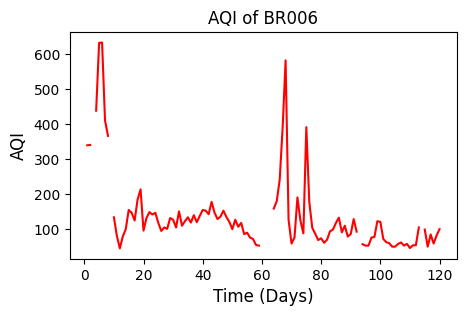

...

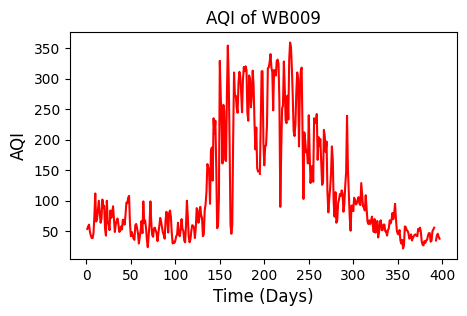

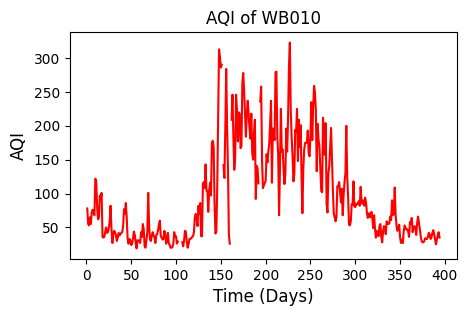

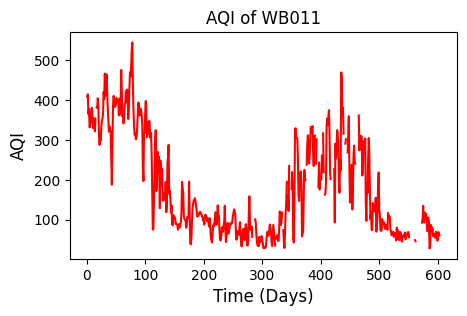

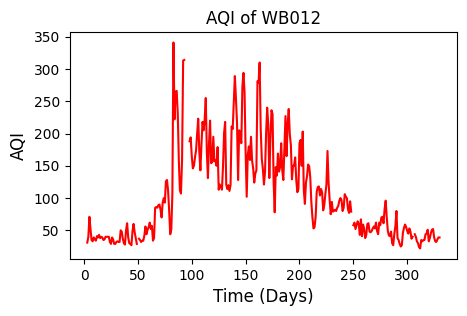

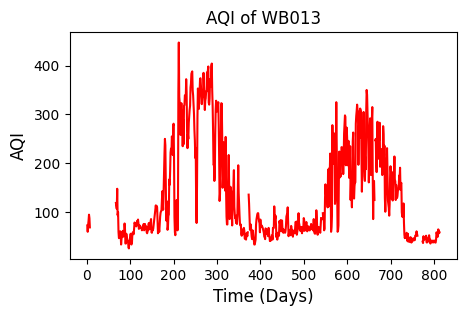

In [24]:
#plot the AQI for each station
def timeseries (stn, x_axis, y_axis, x_label, y_label):
    plt.figure(figsize = (5, 3),dpi=100)
    plt.plot(x_axis, y_axis, color ='red')
    plt.xlabel(x_label, {'fontsize': 12})
    plt.ylabel(y_label, {'fontsize': 12})
    plt.title('AQI of ' + stn)
    plt.show()
    
for stn, df in stn_dict.items():
    timeseries(stn, range(len(df)), df['AQI'], 'Time (Days)', 'AQI')

The above plots indicate the presence of outliers(extreme values in data) as well as several missing values which should be adjusted and filled respectively 

In [105]:
#detect outliers and interpolate to resolve 
for stn, df in stn_dict.items():
    for col in df.columns:
        up_b = df[col].mean() + 2*df[col].std()
        low_b = df[col].mean() - 2*df[col].std()
        
        df.loc[df[col] > up_b, col] = np.nan
        df.loc[df[col] < low_b, col] = np.nan
        df[col].interpolate(inplace=True)

In [16]:
df_stn.isnull().sum()

Date              0
PM2.5         21625
PM10          42706
NO            17106
NO2           16547
NOx           15500
NH3           48105
CO            12998
SO2           25204
O3            25568
Benzene       31455
Toluene       38702
Xylene        85137
AQI           21010
AQI_Bucket    21010
dtype: int64

In [106]:
#replace missing values by interpolation
def replace_missing (attribute):
    return attribute.interpolate(inplace=True)

for stn, df in stn_dict.items():
    for col in df.columns:
        if df[col].isnull().any():
            replace_missing(df[col])
     
    #some missing values might persist, replace with mean of feature
    for col in df.columns:
        if df[col].isnull().any():
            df[col].fillna(value= df[col].mean(), inplace = True)

In [107]:
#drop all columns that still have missing values as they probably contain zeros only
for stn, df in stn_dict.items():
    for col in df.columns:
        if df[col].isnull().any():
            df.drop(col, axis=1, inplace=True)

Data frames without AQI shall be droped as it is our target and predictions cannot be made with out it.
Data frames with less observations(rows) will probably not yield much result, so data frames with less than 3 months of observations will be droped

In [108]:
#drop dataframes without AQI as they cannot be trained
#drop dataframes with less than 180 rows(3 months) as they have too little data for any meaningful analysis
drops = []
for stn, df in stn_dict.items():
    if not 'AQI' in df.columns:
        drops.append(stn)
    if len(df) < 180:
        drops.append(stn)
    
for stn in drops:
    stn_dict.pop(stn)

# Data Preprocessing
### Splitting data
The data for each station is split into training and testing sets with the training set containing 80% of the data and the testing set containing 20%

In [109]:
def train_test_split(dataset):
    '''splits a dataset to return a list of X_train, X_test, y_train and y_test'''
    #split data into train and test
    train_size = int(len(df)*0.8)
    train_dataset, test_dataset = df.iloc[:train_size], df.iloc[train_size:]
    
    # Split train data to X and y
    X_train = train_dataset.drop('AQI', axis = 1)
    y_train = train_dataset.loc[:,['AQI']]

    # Split test data to X and y
    X_test = test_dataset.drop('AQI', axis = 1)
    y_test = test_dataset.loc[:,['AQI']]
    
    split_df = [X_train, X_test, y_train, y_test]
    
    return split_df

In [110]:
#split each dataframe to a list of training and testing sets and replace the dataframe with a dictionary made fom them
order = ['X_train', 'X_test', 'y_train', 'y_test']
for stn, df in stn_dict.items():
    split_df = train_test_split(df)
    split_dict = {}
    for i in range(len(order)):
        split_dict[order[i]] = split_df[i]
    stn_dict[stn] = split_dict

### Transforming and reshaping data
The LSTM model cannot process the data in it's current form thus it is first transformed or scaled to values between 0 and 1, then the shape of the scaled data is changed to a form the model can handle.
The shape is then in the form of (observations, time_step, features)

In [111]:
# Transform X_train, y_train, X_test and y_test
#df is now a dataframe of trains and tests
for stn, df in stn_dict.items():
    X_train = df['X_train'] 
    X_test  = df['X_test']
    y_train = df['y_train'] 
    y_test  = df['y_test'] 
    
    # Different scaler for input and output
    scaler_x = MinMaxScaler(feature_range = (0,1))
    scaler_y = MinMaxScaler(feature_range = (0,1))
    
    
    # Fit the scaler using available training data
    input_scaler = scaler_x.fit(X_train)
    output_scaler = scaler_y.fit(y_train)
    
    df['scaler_x'] = scaler_x
    df['scaler_y'] = scaler_y
    
    # Apply the scaler to training data
    df['X_train'] = input_scaler.transform(X_train)
    df['y_train'] = output_scaler.transform(y_train)
    
    df['pollutant_holder'] = df['X_test'].copy()
    df['AQI_holder'] = df['y_test']['AQI'].copy()
    
    # Apply the scaler to test data
    df['X_test'] = input_scaler.transform(X_test)
    df['y_test'] = output_scaler.transform(y_test)

In [112]:
def create_dataset (X, y, time_steps = 1):
    Xs, ys = [], []
    
    for i in range(len(X)-time_steps):
        v = X[i:i+time_steps, :]
        Xs.append(v)
        ys.append(y[i+time_steps])
        
    return np.array(Xs), np.array(ys)


TIME_STEPS = 30

for stn, df in stn_dict.items():
    X_train = df['X_train'] 
    X_test  = df['X_test']
    y_train = df['y_train'] 
    y_test  = df['y_test']
    
    df['X_train'], df['y_train'] = create_dataset(X_train, y_train, TIME_STEPS)
    df['X_test'], df['y_test'] = create_dataset(X_test, y_test, TIME_STEPS)
    
#print('X_train.shape: ', X_train.shape)
#print('y_train.shape: ', y_train.shape)
#print('X_test.shape: ', X_test.shape) 
#print('y_test.shape: ', y_teat.shape)

### Modeling
The LSTM neural network is then developed with a sequential model with 5 layers and 3 hidden layers using the Adam optimizer and mean squared error for loss. 

In [113]:
# Create LSTM model
def create_model(units, m):
    model = Sequential()
    model.add(m (units = 100, return_sequences = True, input_shape = [X_train.shape[1], X_train.shape[2]]))
    model.add(Dropout(0.2)) 
    model.add(m (units = units))                 
    model.add(Dropout(0.2))
    model.add(Dense(units = 1)) 
    #Compile model
    model.compile(loss='mse', optimizer='adam', metrics=['accuracy'])
    return model


In [114]:
def fit_model(model):
    #Stop training model if loss on validation set remains unchaned for 10 epochs
    early_stop = keras.callbacks.EarlyStopping(monitor = 'val_loss', patience = 10)
    #adjust learning rate of model
    reduce_lr = keras.callbacks.LearningRateScheduler(lambda x: 1e-3 * 0.90 ** x)

    # shuffle = False because the order of the data matters
    history = model.fit(X_train, y_train, epochs = 100, validation_split = 0.2, batch_size = 32, shuffle = False, callbacks = [early_stop, reduce_lr])
    return history

 Plot train loss vs validation loss

In [115]:
def plot_loss (history, model_name):
    plt.figure(figsize = (5, 3), dpi=150)
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('Model Train vs Validation Loss for ' + model_name)
    plt.ylabel('Loss')
    plt.xlabel('epoch')
    plt.legend(['Train loss', 'Validation loss'], loc='upper right')
    plt.show()
    print(history.history.keys())


In [116]:
def prediction(model, scaler_y):
    prediction = model.predict(X_test)
    prediction = scaler_y.inverse_transform(prediction)
    return prediction

In [117]:
def plot_future(prediction, model_name, y_test, station):
    
    plt.figure(figsize=(5, 3), dpi=150)
    
    range_future = len(prediction)

    plt.plot(np.arange(range_future), np.array(y_test), label='True Future')
    plt.plot(np.arange(range_future), np.array(prediction),label='Prediction')

    plt.title('True future vs prediction for ' + station)
    plt.legend(loc='upper left')
    plt.xlabel('Time (day)')
    plt.ylabel('AQI')
    plt.show()

In [118]:
def tabulate(predictions, pollutant_holder, AQI_holder):
    
    predictions = np.array(predictions)
    
    table_df = pollutant_holder.iloc[TIME_STEPS:].copy()
    table_df['AQI'] = AQI_holder
    table_df['Predicted AQI'] = predictions
    table_df.head(20)
    return table_df

In [119]:
def evaluate_prediction(predictions, actual, model_name):
    errors = predictions - actual
    mse = np.square(errors).mean()
    rmse = np.sqrt(mse)
    mae = np.abs(errors).mean()
    
    R_square = r2_score(actual, predictions)

    print(model_name + ':')
    print('Mean Absolute Error: {:.4f}'.format(mae))
    print('Root Mean Square Error: {:.4f}'.format(rmse))
    print('Coefficient of Determination: {:.4f}'.format(R_square))
    print('')

Fit model, plot losses and predict

Training model for AP001...
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm (LSTM)                  (None, 30, 100)           45200     
_________________________________________________________________
dropout (Dropout)            (None, 30, 100)           0         
_________________________________________________________________
lstm_1 (LSTM)                (None, 64)                42240     
_________________________________________________________________
dropout_1 (Dropout)          (None, 64)                0         
_________________________________________________________________
dense (Dense)                (None, 1)                 65        
Total params: 87,505
Trainable params: 87,505
Non-trainable params: 0
_________________________________________________________________
Epoch 1/100
19/19 [==============================] - 26s 516ms/step - loss: 0.0851 - accur

Epoch 51/100
19/19 [==============================] - 5s 270ms/step - loss: 0.0206 - accuracy: 0.0017 - val_loss: 0.0239 - val_accuracy: 0.0068
Epoch 52/100
19/19 [==============================] - 6s 300ms/step - loss: 0.0208 - accuracy: 0.0017 - val_loss: 0.0239 - val_accuracy: 0.0068
Epoch 53/100
19/19 [==============================] - 5s 290ms/step - loss: 0.0204 - accuracy: 0.0017 - val_loss: 0.0239 - val_accuracy: 0.0068
Epoch 54/100
19/19 [==============================] - 7s 343ms/step - loss: 0.0200 - accuracy: 0.0017 - val_loss: 0.0239 - val_accuracy: 0.0068
Epoch 55/100
19/19 [==============================] - 7s 352ms/step - loss: 0.0198 - accuracy: 0.0017 - val_loss: 0.0239 - val_accuracy: 0.0068
Epoch 56/100
19/19 [==============================] - 6s 333ms/step - loss: 0.0208 - accuracy: 0.0017 - val_loss: 0.0239 - val_accuracy: 0.0068
Epoch 57/100
19/19 [==============================] - 6s 298ms/step - loss: 0.0213 - accuracy: 0.0017 - val_loss: 0.0239 - val_accuracy:

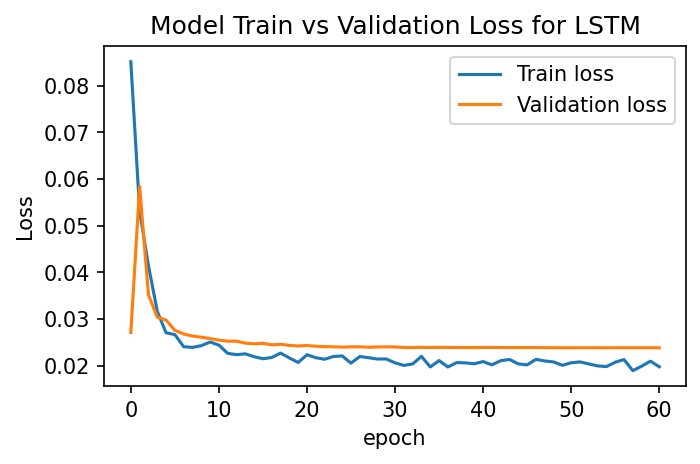

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])
Predicting test data...
Plotting true data and predictions...


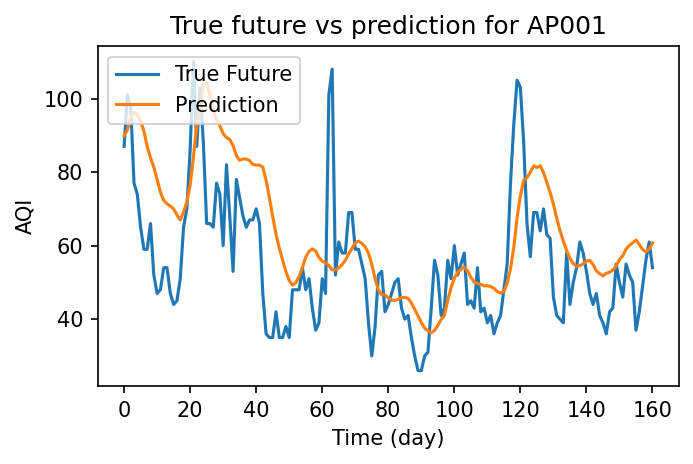

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,Predicted AQI
Date,,,,,,,,,,,,,,
2020-01-23,59.33,93.30,3.08,17.94,12.04,18.24,0.75,18.29,40.90,0.43,1.41,0.15,87.0,89.847832
2020-01-24,61.40,96.60,2.53,15.34,10.21,18.05,0.73,23.54,43.29,0.69,2.14,0.14,101.0,91.448753
2020-01-25,51.18,76.33,1.67,11.66,7.55,18.53,0.64,18.69,46.21,0.49,0.90,0.10,98.0,94.953964
2020-01-26,38.39,63.99,2.48,15.39,10.20,16.55,0.61,20.00,36.83,0.46,1.14,0.15,77.0,96.282013
2020-01-27,34.56,62.65,2.89,16.51,11.14,17.89,0.57,19.73,44.57,0.42,0.92,0.13,74.0,95.584068
2020-01-28,33.62,60.66,2.50,14.78,9.89,16.70,0.52,20.29,36.88,0.32,0.61,0.12,65.0,93.881012
2020-01-29,29.98,51.68,2.24,9.21,6.72,17.48,0.52,12.76,32.35,0.23,0.36,0.11,59.0,91.183983
2020-01-30,32.18,60.01,2.65,13.11,9.13,15.90,0.55,15.43,36.90,0.31,0.65,0.10,59.0,86.899788
2020-01-31,26.72,53.90,3.71,15.53,11.29,15.51,0.49,19.06,32.28,0.34,0.80,0.12,66.0,83.890244


Evaluating predictions...
LSTM:
Mean Absolute Error: 13.4926
Root Mean Square Error: 17.1924
Coefficient of Determination: 0.0251

Training model for AP005...
Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_2 (LSTM)                (None, 30, 100)           45200     
_________________________________________________________________
dropout_2 (Dropout)          (None, 30, 100)           0         
_________________________________________________________________
lstm_3 (LSTM)                (None, 64)                42240     
_________________________________________________________________
dropout_3 (Dropout)          (None, 64)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 65        
Total params: 87,505
Trainable params: 87,505
Non-trainable params: 0
_______________________

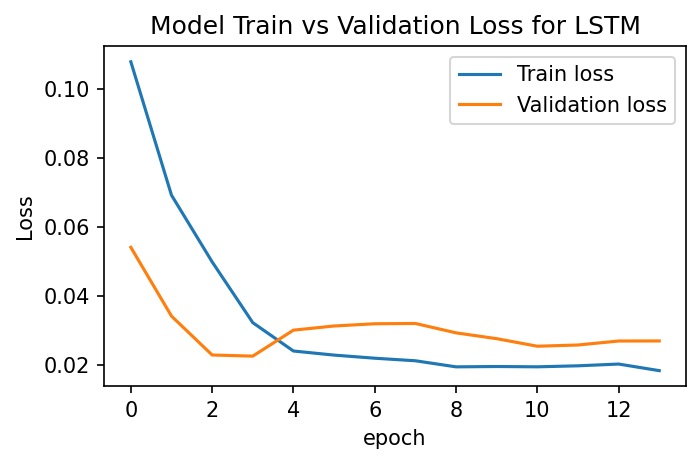

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])
Predicting test data...
Plotting true data and predictions...


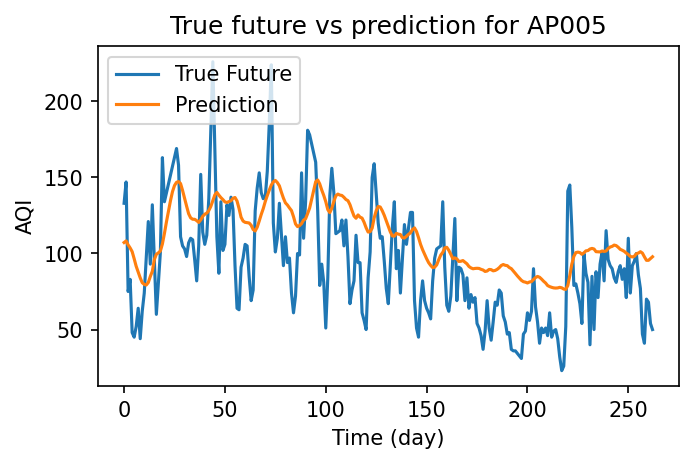

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,Predicted AQI
Date,,,,,,,,,,,,,,
2019-10-13,28.920,161.210,24.90,34.79,38.75,4.75,0.60,21.580,24.13,3.05,8.76,2.92,133.0,107.210625
2019-10-14,28.020,46.850,1.95,27.55,15.79,3.44,0.56,22.005,43.62,2.96,8.28,1.88,147.0,108.250610
2019-10-15,45.560,72.390,2.26,21.17,13.09,3.13,0.62,22.430,66.99,2.78,7.42,1.13,75.0,105.670074
2019-10-16,32.930,56.180,5.98,29.73,20.68,1.13,0.74,24.580,52.67,2.97,8.97,1.60,83.0,103.638596
2019-10-17,7.020,20.340,7.31,24.67,19.06,1.30,0.56,23.000,26.63,2.52,8.84,1.54,48.0,101.213127
2019-10-18,8.550,22.060,5.42,21.09,15.63,2.27,0.51,21.460,28.19,2.07,5.72,1.10,45.0,96.533638
2019-10-19,10.320,23.930,17.22,40.82,35.71,1.31,0.80,21.110,19.51,3.62,9.25,2.31,52.0,91.561890
2019-10-20,5.290,17.650,6.04,25.84,18.66,2.58,0.53,20.760,26.21,2.15,4.57,0.94,64.0,87.735039
2019-10-21,10.500,23.780,4.96,22.41,15.92,2.67,0.52,20.410,27.52,2.07,5.82,0.97,44.0,83.981621


Evaluating predictions...
LSTM:
Mean Absolute Error: 28.7255
Root Mean Square Error: 33.6465
Coefficient of Determination: 0.1767

Training model for AS001...
Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_4 (LSTM)                (None, 30, 100)           44400     
_________________________________________________________________
dropout_4 (Dropout)          (None, 30, 100)           0         
_________________________________________________________________
lstm_5 (LSTM)                (None, 64)                42240     
_________________________________________________________________
dropout_5 (Dropout)          (None, 64)                0         
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 65        
Total params: 86,705
Trainable params: 86,705
Non-trainable params: 0
_______________________

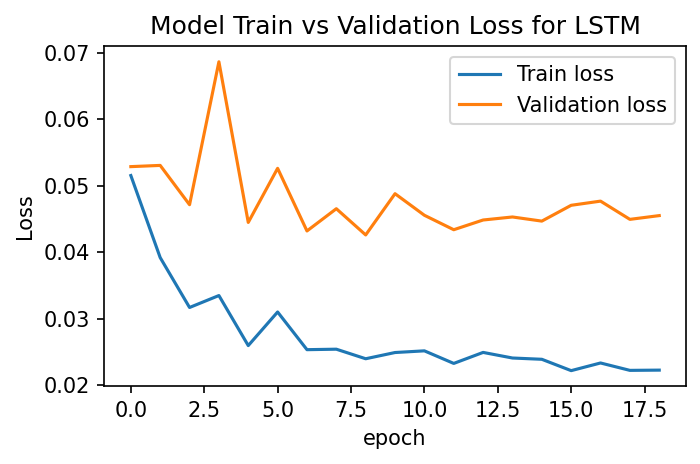

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])
Predicting test data...
Plotting true data and predictions...


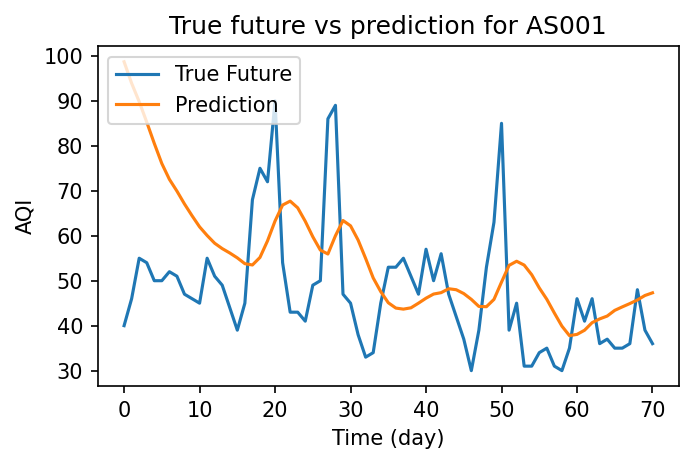

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,AQI,Predicted AQI
Date,,,,,,,,,,,,
2020-04-22,23.36,35.06,2.94,6.81,5.50,9.66,0.39,13.94,24.83,0.06,40.0,98.683708
2020-04-23,26.52,46.48,2.21,7.14,5.12,10.16,0.38,13.86,31.74,0.06,46.0,93.893761
2020-04-24,12.87,29.46,0.66,3.45,2.17,6.01,0.25,13.88,42.08,0.04,55.0,89.821251
2020-04-25,13.02,18.64,0.83,3.81,2.47,3.34,0.25,13.88,43.10,0.03,54.0,85.267624
2020-04-26,19.09,30.65,1.56,6.56,4.35,2.57,0.35,13.95,36.50,2.32,50.0,80.533104
2020-04-27,28.02,42.15,5.89,10.71,9.61,2.47,0.42,14.17,31.90,0.06,50.0,76.051079
2020-04-28,25.51,39.31,1.06,9.00,5.17,3.96,0.40,14.19,39.45,0.04,52.0,72.549629
2020-04-29,25.33,44.45,2.33,7.14,5.21,3.46,0.42,14.08,28.68,0.05,51.0,69.924767
2020-04-30,23.83,36.16,1.85,7.68,5.11,4.63,0.39,14.01,30.84,0.04,47.0,67.066910


Evaluating predictions...
LSTM:
Mean Absolute Error: 14.9422
Root Mean Square Error: 18.3409
Coefficient of Determination: -0.8492

Training model for BR007...
Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_6 (LSTM)                (None, 30, 100)           44400     
_________________________________________________________________
dropout_6 (Dropout)          (None, 30, 100)           0         
_________________________________________________________________
lstm_7 (LSTM)                (None, 64)                42240     
_________________________________________________________________
dropout_7 (Dropout)          (None, 64)                0         
_________________________________________________________________
dense_3 (Dense)              (None, 1)                 65        
Total params: 86,705
Trainable params: 86,705
Non-trainable params: 0
______________________

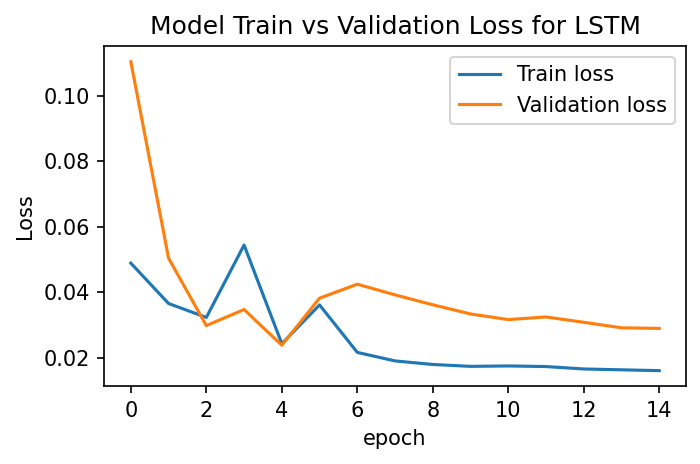

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])
Predicting test data...
Plotting true data and predictions...


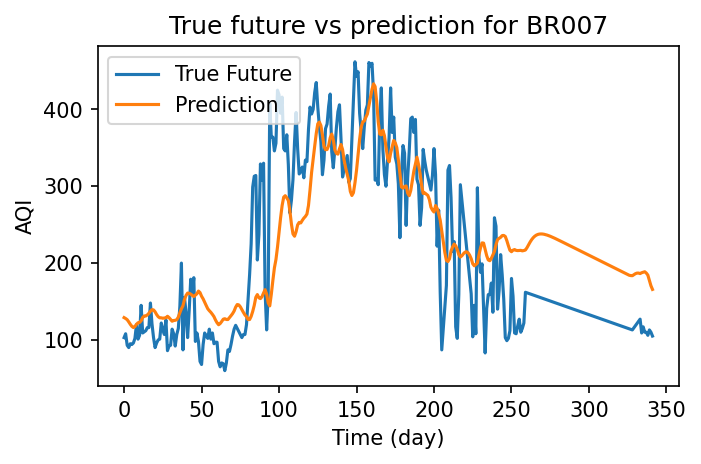

,PM2.5,NO,NO2,NOx,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,Predicted AQI
Date,,,,,,,,,,,,
2019-07-26,37.96,13.16,45.64,19.80,1.13,50.26,53.29,1.14,6.50,4.35,103.0,129.028244
2019-07-27,24.60,11.42,26.21,13.71,1.05,48.63,55.79,1.00,6.23,4.39,108.0,127.826355
2019-07-28,19.60,8.07,24.20,11.16,0.85,46.38,50.14,0.87,5.69,3.61,93.0,126.321373
2019-07-29,21.78,9.59,23.23,11.84,1.02,47.08,46.57,0.97,6.41,4.38,90.0,123.467308
2019-07-30,24.54,7.30,20.10,9.63,1.08,50.09,53.02,1.03,6.94,4.98,95.0,120.346283
2019-07-31,27.05,6.02,17.07,8.08,1.04,48.48,60.18,1.02,6.30,4.40,94.0,117.664871
2019-08-01,35.84,7.17,16.74,8.69,1.34,50.54,72.16,1.16,7.14,4.90,96.0,116.082825
2019-08-02,37.57,7.76,12.53,7.96,1.37,51.84,79.81,1.22,7.75,5.68,102.0,117.335213
2019-08-03,31.88,6.91,13.60,7.71,1.32,49.81,69.47,1.35,8.22,6.43,120.0,120.322227


Evaluating predictions...
LSTM:
Mean Absolute Error: 60.4852
Root Mean Square Error: 72.5843
Coefficient of Determination: 0.5885

Training model for BR008...
Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_8 (LSTM)                (None, 30, 100)           45200     
_________________________________________________________________
dropout_8 (Dropout)          (None, 30, 100)           0         
_________________________________________________________________
lstm_9 (LSTM)                (None, 64)                42240     
_________________________________________________________________
dropout_9 (Dropout)          (None, 64)                0         
_________________________________________________________________
dense_4 (Dense)              (None, 1)                 65        
Total params: 87,505
Trainable params: 87,505
Non-trainable params: 0
_______________________

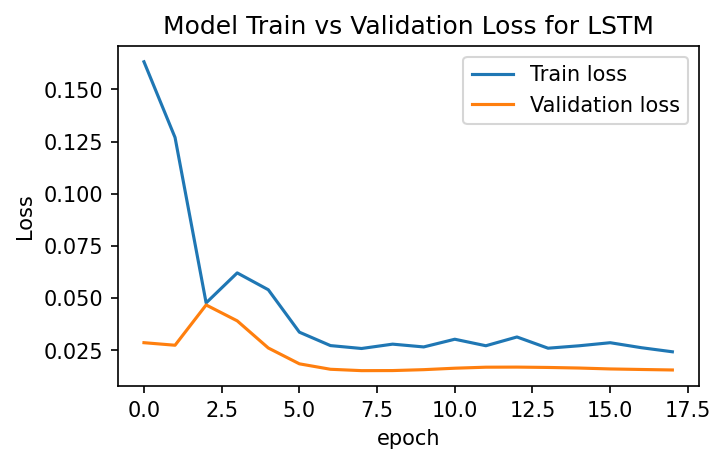

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])
Predicting test data...
Plotting true data and predictions...


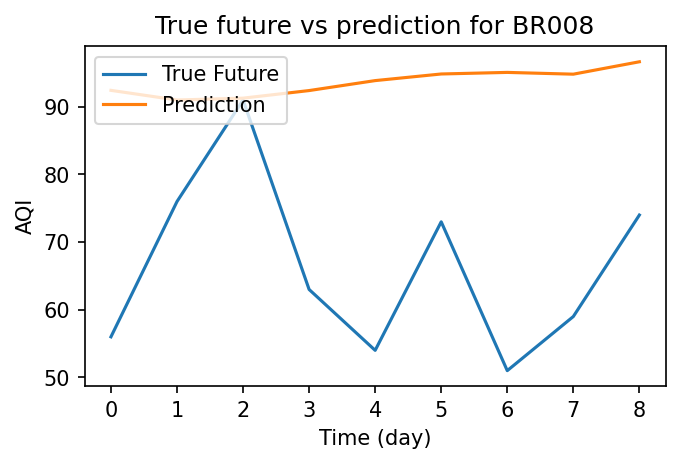

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,Predicted AQI
Date,,,,,,,,,,,,,,
2020-06-23,23.68,66.55,9.10,17.57,26.14,24.25,0.45,3.39,6.12,1.12,1.06,2.10,56.0,92.432533
2020-06-24,30.78,83.87,5.60,25.46,31.06,24.25,0.61,3.24,5.66,1.57,1.98,2.60,76.0,91.005150
2020-06-25,28.13,81.98,10.96,27.13,37.77,24.25,0.64,3.37,6.12,2.35,1.13,1.93,91.0,91.278526
2020-06-26,16.84,52.63,5.51,33.46,38.97,24.25,0.56,3.35,5.94,1.29,1.05,1.68,63.0,92.402061
2020-06-27,21.58,64.39,3.35,23.09,26.44,24.25,0.50,3.34,5.88,0.95,1.03,2.79,54.0,93.874229
2020-06-28,22.04,64.10,3.75,18.62,22.37,24.25,0.50,3.13,5.75,1.29,1.60,2.93,73.0,94.852333
2020-06-29,21.23,49.80,4.89,18.92,23.82,24.25,0.54,3.24,5.78,1.77,2.02,2.99,51.0,95.086166
2020-06-30,31.28,72.39,11.14,26.45,37.36,24.25,0.76,3.25,5.71,2.96,13.84,3.07,59.0,94.823997
2020-07-01,38.14,100.24,3.00,26.07,29.06,24.25,0.68,3.15,5.49,4.00,10.05,3.07,74.0,96.656799


Evaluating predictions...
LSTM:
Mean Absolute Error: 27.2680
Root Mean Square Error: 30.2302
Coefficient of Determination: -5.0299

Training model for BR009...
Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_10 (LSTM)               (None, 30, 100)           45200     
_________________________________________________________________
dropout_10 (Dropout)         (None, 30, 100)           0         
_________________________________________________________________
lstm_11 (LSTM)               (None, 64)                42240     
_________________________________________________________________
dropout_11 (Dropout)         (None, 64)                0         
_________________________________________________________________
dense_5 (Dense)              (None, 1)                 65        
Total params: 87,505
Trainable params: 87,505
Non-trainable params: 0
______________________

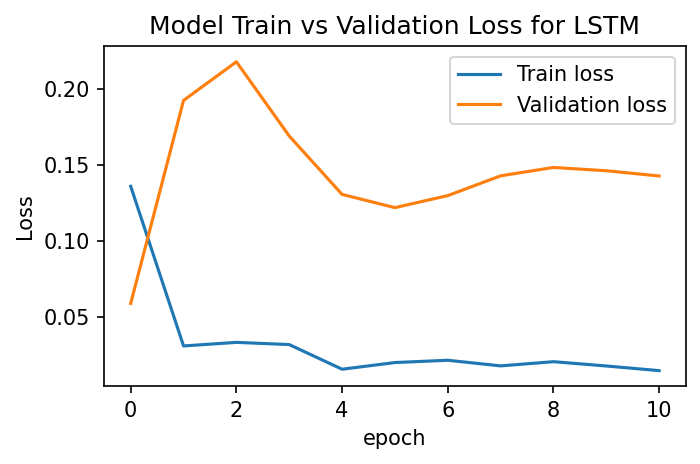

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])
Predicting test data...
Plotting true data and predictions...


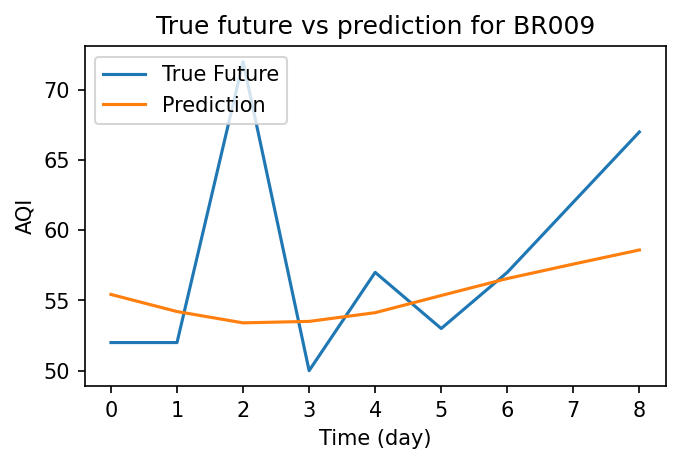

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,Predicted AQI
Date,,,,,,,,,,,,,,
2020-06-23,9.23,25.30,5.15,14.61,19.75,7.46,0.48,7.02,40.97,0.17,1.22,0.02,52.0,55.427647
2020-06-24,9.23,21.72,5.65,17.31,22.96,3.53,0.56,3.73,39.90,0.18,1.27,0.00,52.0,54.208889
2020-06-25,9.23,23.18,11.74,26.82,36.95,3.50,0.78,4.34,22.76,0.30,1.52,0.00,72.0,53.403690
2020-06-26,9.23,21.65,8.54,24.02,32.55,4.33,0.63,3.20,28.82,0.20,1.46,0.74,50.0,53.507702
2020-06-27,9.23,25.70,9.29,27.55,36.77,1.76,0.68,3.33,33.65,0.21,1.36,1.37,57.0,54.128315
2020-06-28,9.23,23.48,8.78,23.37,32.14,2.08,0.57,4.98,27.96,0.21,1.32,1.50,53.0,55.351715
2020-06-29,8.74,19.25,7.65,20.29,27.94,2.41,0.65,4.00,32.65,0.27,1.45,1.63,57.0,56.559551
2020-06-30,7.75,19.72,7.76,21.78,29.55,1.06,0.73,3.89,32.77,0.29,1.58,1.63,62.0,57.589310
2020-07-01,7.56,18.90,18.84,38.45,57.29,0.12,0.77,2.46,13.05,0.28,1.51,1.63,67.0,58.595207


Evaluating predictions...
LSTM:
Mean Absolute Error: 5.1355
Root Mean Square Error: 7.2940
Coefficient of Determination: -0.0500

Training model for BR010...
Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_12 (LSTM)               (None, 30, 100)           44800     
_________________________________________________________________
dropout_12 (Dropout)         (None, 30, 100)           0         
_________________________________________________________________
lstm_13 (LSTM)               (None, 64)                42240     
_________________________________________________________________
dropout_13 (Dropout)         (None, 64)                0         
_________________________________________________________________
dense_6 (Dense)              (None, 1)                 65        
Total params: 87,105
Trainable params: 87,105
Non-trainable params: 0
________________________

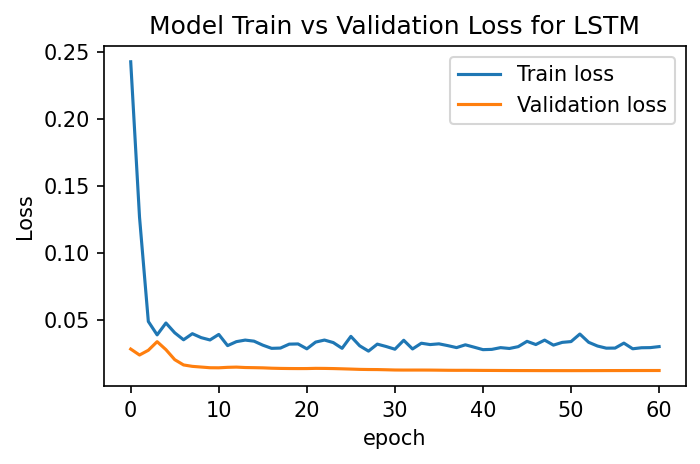

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])
Predicting test data...
Plotting true data and predictions...


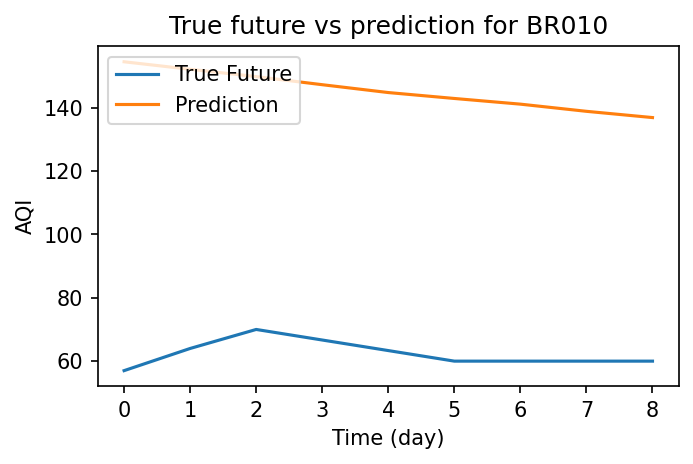

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,O3,Benzene,Toluene,Xylene,AQI,Predicted AQI
Date,,,,,,,,,,,,,
2020-06-23,21.48,61.06,5.32,10.63,14.59,2.07,0.40,24.02,0.97,7.300,1.19,57.000000,154.491455
2020-06-24,21.13,62.28,0.55,7.43,2.61,2.08,0.42,31.27,0.98,9.890,1.34,64.000000,152.122803
2020-06-25,23.26,68.26,0.97,4.23,5.69,2.09,0.51,16.73,1.45,6.490,2.30,70.000000,149.809692
2020-06-26,12.63,40.54,1.09,4.61,6.14,2.10,0.40,28.71,0.73,4.550,1.43,66.666667,147.255585
2020-06-27,14.31,55.53,0.53,3.53,4.53,2.06,0.40,40.77,0.71,4.520,1.24,63.333333,144.777512
2020-06-28,10.99,53.68,0.81,4.20,5.53,2.02,0.39,31.57,0.98,4.820,1.97,60.000000,142.909622
2020-06-29,7.06,48.42,2.03,7.10,9.42,2.10,0.51,26.30,1.53,14.560,2.70,60.000000,141.117630
2020-06-30,23.12,45.79,6.63,18.98,26.11,2.07,0.61,20.48,1.59,10.715,2.94,60.000000,138.852753
2020-07-01,23.26,57.92,6.42,18.36,24.96,2.17,0.68,8.93,1.59,6.870,2.53,60.000000,136.878510


Evaluating predictions...
LSTM:
Mean Absolute Error: 83.0240
Root Mean Square Error: 83.2330
Coefficient of Determination: -472.9417

Training model for CH001...
Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_14 (LSTM)               (None, 30, 100)           45200     
_________________________________________________________________
dropout_14 (Dropout)         (None, 30, 100)           0         
_________________________________________________________________
lstm_15 (LSTM)               (None, 64)                42240     
_________________________________________________________________
dropout_15 (Dropout)         (None, 64)                0         
_________________________________________________________________
dense_7 (Dense)              (None, 1)                 65        
Total params: 87,505
Trainable params: 87,505
Non-trainable params: 0
____________________

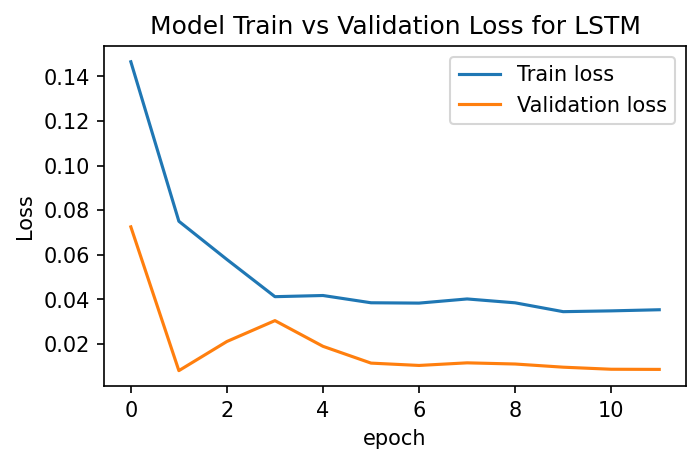

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])
Predicting test data...
Plotting true data and predictions...


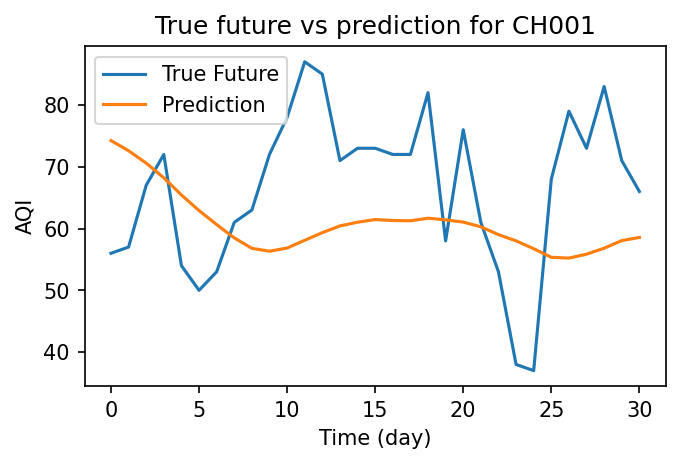

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,Predicted AQI
Date,,,,,,,,,,,,,,
2020-06-01,18.59,39.63,3.23,5.11,8.69,30.59,0.49,13.92,35.570000,2.95,0.49,0.85,56.0,74.248993
2020-06-02,18.36,49.00,4.36,5.02,8.30,32.86,0.32,11.65,28.530000,2.88,0.28,0.42,57.0,72.598221
2020-06-03,16.71,55.63,2.54,9.17,6.52,24.70,0.20,12.02,27.440000,3.48,0.28,0.73,67.0,70.595299
2020-06-04,14.48,42.99,1.49,10.16,6.46,33.30,0.20,11.58,34.950000,3.07,0.19,0.68,72.0,68.216896
2020-06-05,21.25,41.22,1.76,9.52,6.38,41.79,0.23,10.36,27.910000,3.73,0.21,0.94,54.0,65.439415
2020-06-06,22.07,34.31,2.20,8.37,6.10,41.78,0.29,13.94,27.050000,2.92,0.73,0.80,50.0,62.914253
2020-06-07,16.35,27.91,2.94,14.64,9.96,40.41,0.30,11.11,32.200000,4.81,0.62,0.92,53.0,60.644897
2020-06-08,21.12,44.53,3.72,14.96,10.35,42.23,0.30,12.61,33.960000,4.83,0.41,0.87,61.0,58.492100
2020-06-09,29.37,60.45,1.36,11.05,6.89,39.71,0.29,11.60,40.050000,3.96,1.81,0.89,63.0,56.796875


Evaluating predictions...
LSTM:
Mean Absolute Error: 13.3603
Root Mean Square Error: 15.2534
Coefficient of Determination: -0.5134

Training model for DL001...
Model: "sequential_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_16 (LSTM)               (None, 30, 100)           45200     
_________________________________________________________________
dropout_16 (Dropout)         (None, 30, 100)           0         
_________________________________________________________________
lstm_17 (LSTM)               (None, 64)                42240     
_________________________________________________________________
dropout_17 (Dropout)         (None, 64)                0         
_________________________________________________________________
dense_8 (Dense)              (None, 1)                 65        
Total params: 87,505
Trainable params: 87,505
Non-trainable params: 0
______________________

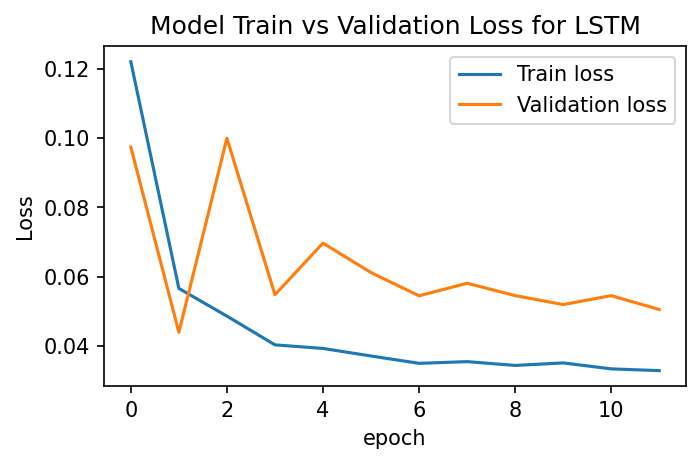

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])
Predicting test data...
Plotting true data and predictions...


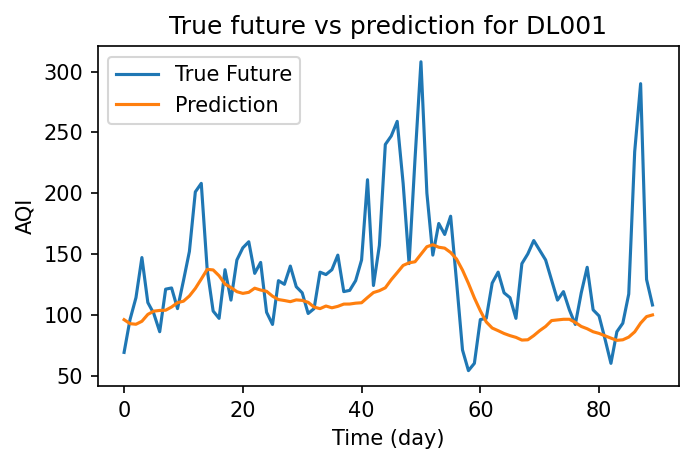

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,Predicted AQI
Date,,,,,,,,,,,,,,
2020-04-03,27.83,77.77,2.63,31.96,19.15,15.67,0.90,11.50,40.19,0.06,0.82,0.03,69.0,95.913261
2020-04-04,42.38,102.58,2.77,35.84,21.35,17.80,0.66,15.35,34.78,0.22,1.31,0.00,96.0,92.627991
2020-04-05,62.85,128.54,4.16,38.20,23.72,21.20,0.58,13.41,33.56,0.39,1.90,0.00,114.0,92.142593
2020-04-06,71.23,148.54,3.21,36.27,21.91,23.31,0.94,16.27,33.03,0.53,1.29,0.00,147.0,94.593842
2020-04-07,27.46,108.10,2.58,31.56,18.89,20.33,0.78,10.36,35.42,0.09,0.75,0.00,110.0,100.246948
2020-04-08,26.98,89.82,2.55,30.69,18.40,17.69,0.73,13.29,37.66,0.04,0.65,0.00,101.0,102.923004
2020-04-09,34.00,93.65,2.68,33.96,20.24,18.35,0.73,14.60,40.99,0.12,0.88,0.00,86.0,103.513168
2020-04-10,51.88,136.88,4.17,39.77,24.55,20.13,0.83,15.45,33.63,0.32,2.06,0.01,121.0,103.686440
2020-04-11,49.85,137.82,3.26,33.26,20.71,21.62,0.82,18.61,41.12,0.37,1.10,0.06,122.0,106.338440


Evaluating predictions...
LSTM:
Mean Absolute Error: 36.0377
Root Mean Square Error: 51.5964
Coefficient of Determination: -0.1534

Training model for DL002...
Model: "sequential_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_18 (LSTM)               (None, 30, 100)           44800     
_________________________________________________________________
dropout_18 (Dropout)         (None, 30, 100)           0         
_________________________________________________________________
lstm_19 (LSTM)               (None, 64)                42240     
_________________________________________________________________
dropout_19 (Dropout)         (None, 64)                0         
_________________________________________________________________
dense_9 (Dense)              (None, 1)                 65        
Total params: 87,105
Trainable params: 87,105
Non-trainable params: 0
______________________

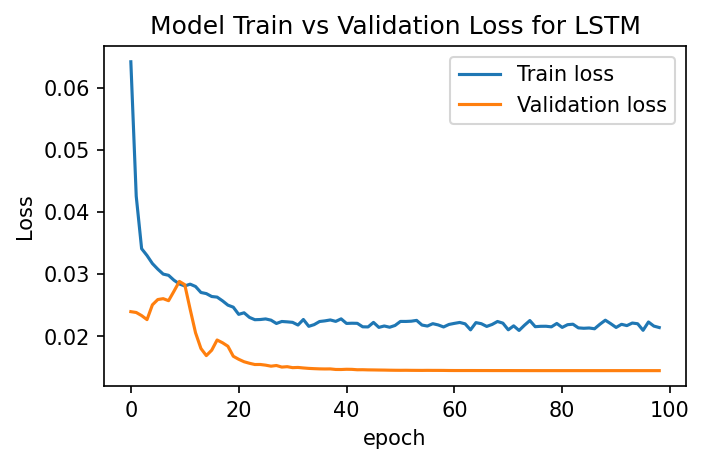

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])
Predicting test data...
Plotting true data and predictions...


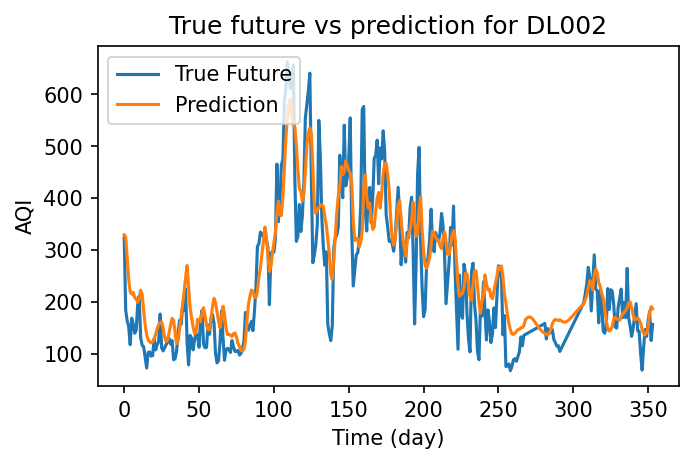

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,AQI,Predicted AQI
Date,,,,,,,,,,,,,
2019-07-14,64.66,318.61,82.96,49.72,92.04,38.18,1.63,8.47,25.92,0.74,18.64,324.0,329.689423
2019-07-15,39.75,149.00,39.87,36.36,51.85,32.91,1.93,7.60,26.52,1.13,23.00,184.0,325.302826
2019-07-16,32.28,109.76,28.28,52.94,51.21,31.48,2.31,8.20,59.18,0.87,22.72,164.0,285.243225
2019-07-17,40.17,103.99,70.52,47.48,82.76,18.71,1.75,7.57,33.38,1.60,18.69,153.0,243.616821
2019-07-18,40.72,124.80,98.21,70.44,117.53,12.30,1.51,8.48,8.54,1.05,13.30,118.0,219.820755
2019-07-19,75.59,239.77,43.21,71.40,77.46,27.04,2.07,7.43,15.54,1.66,30.17,169.0,215.350739
2019-07-20,55.54,146.99,49.14,45.55,64.29,46.43,1.50,9.16,31.40,1.32,19.31,158.0,218.912354
2019-07-21,68.25,155.78,76.81,52.26,90.43,27.66,2.56,9.06,24.84,1.72,32.95,140.0,208.594666
2019-07-22,71.14,171.50,69.13,45.47,80.55,63.21,3.15,7.85,16.82,1.91,34.33,146.0,205.704926


Evaluating predictions...
LSTM:
Mean Absolute Error: 48.9451
Root Mean Square Error: 63.3774
Coefficient of Determination: 0.7739

Training model for DL003...
Model: "sequential_10"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_20 (LSTM)               (None, 30, 100)           44800     
_________________________________________________________________
dropout_20 (Dropout)         (None, 30, 100)           0         
_________________________________________________________________
lstm_21 (LSTM)               (None, 64)                42240     
_________________________________________________________________
dropout_21 (Dropout)         (None, 64)                0         
_________________________________________________________________
dense_10 (Dense)             (None, 1)                 65        
Total params: 87,105
Trainable params: 87,105
Non-trainable params: 0
______________________

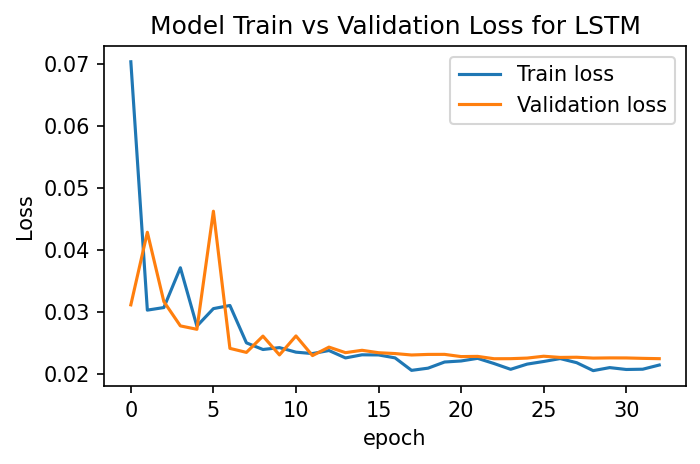

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])
Predicting test data...
Plotting true data and predictions...


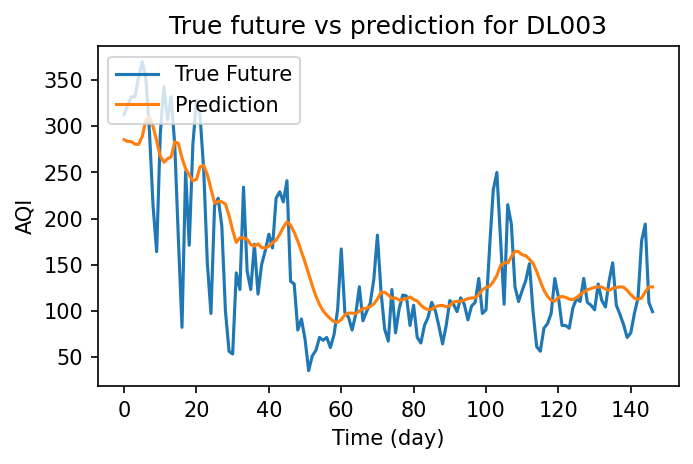

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,AQI,Predicted AQI
Date,,,,,,,,,,,,,
2020-02-06,135.18,209.86,27.16,50.04,48.75,35.94,0.70,10.78,23.62,4.00,23.52,313.0,285.467285
2020-02-07,154.25,248.97,38.02,44.76,54.80,39.35,0.77,11.00,19.14,4.82,26.82,323.0,283.501709
2020-02-08,166.03,235.40,23.02,45.97,43.23,40.36,0.59,15.28,24.27,4.14,25.85,332.0,283.464050
2020-02-09,167.59,249.12,30.76,51.32,52.38,38.11,0.69,17.70,23.99,4.90,26.86,332.0,280.653076
2020-02-10,197.94,306.97,52.09,51.11,69.65,40.68,1.13,14.44,25.01,5.84,39.31,353.0,280.413696
2020-02-11,205.19,345.69,80.35,53.57,93.98,40.88,1.17,13.54,32.58,8.77,70.30,370.0,288.824463
2020-02-12,180.75,296.84,23.99,46.95,44.53,41.99,0.76,15.29,38.05,5.05,40.10,353.0,306.109467
2020-02-13,101.56,191.32,7.52,33.35,23.87,33.72,0.62,20.33,32.95,3.14,27.15,295.0,310.460236
2020-02-14,84.33,193.16,6.92,29.42,21.30,29.53,0.53,15.30,33.11,2.21,16.26,214.0,300.042755


Evaluating predictions...
LSTM:
Mean Absolute Error: 37.9993
Root Mean Square Error: 51.0826
Coefficient of Determination: 0.5732

Training model for DL004...
Model: "sequential_11"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_22 (LSTM)               (None, 30, 100)           43200     
_________________________________________________________________
dropout_22 (Dropout)         (None, 30, 100)           0         
_________________________________________________________________
lstm_23 (LSTM)               (None, 64)                42240     
_________________________________________________________________
dropout_23 (Dropout)         (None, 64)                0         
_________________________________________________________________
dense_11 (Dense)             (None, 1)                 65        
Total params: 85,505
Trainable params: 85,505
Non-trainable params: 0
______________________

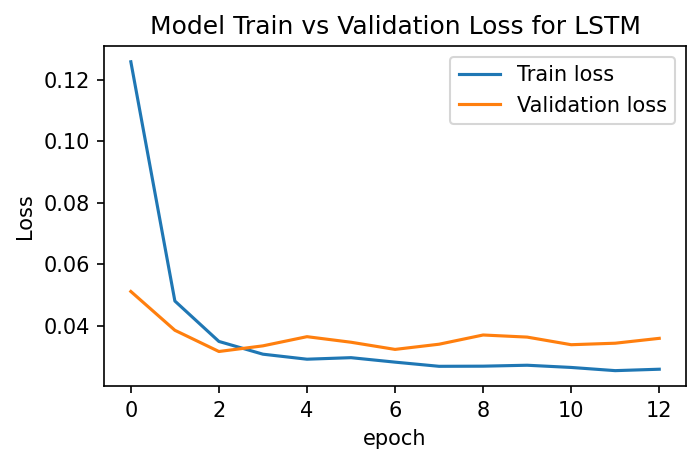

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])
Predicting test data...
Plotting true data and predictions...


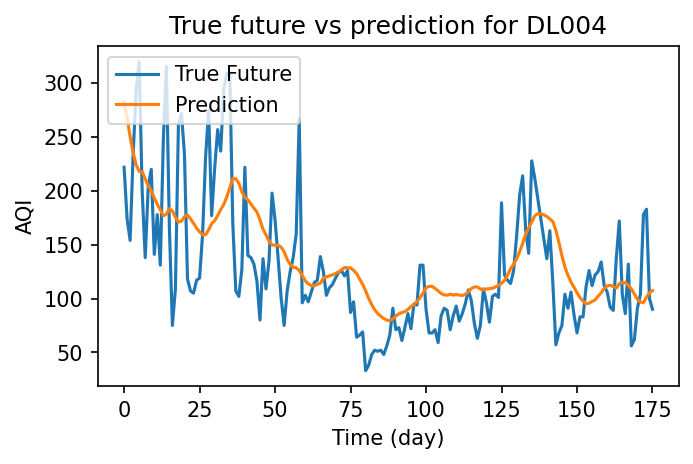

,PM2.5,PM10,NO,NO2,NOx,CO,O3,AQI,Predicted AQI
Date,,,,,,,,,
2020-01-08,97.36,133.51,6.96,2.07,9.00,1.48,28.14,222.0,282.399902
2020-01-09,63.37,97.07,4.24,0.69,4.61,1.21,36.71,174.0,267.890564
2020-01-10,92.39,148.87,4.38,3.01,7.29,1.36,34.43,154.0,250.388123
2020-01-11,101.48,167.95,5.60,5.61,11.20,1.46,36.58,234.0,235.727753
2020-01-12,129.75,206.30,7.95,7.07,15.02,1.70,36.62,294.0,224.232162
2020-01-13,148.81,240.62,7.92,5.37,13.29,1.95,40.75,320.0,218.119812
2020-01-14,63.57,97.62,5.15,2.69,7.83,1.38,43.69,199.0,217.687149
2020-01-15,84.23,151.32,6.97,4.39,11.35,1.51,46.03,138.0,211.117813
2020-01-16,100.57,160.72,7.45,4.41,11.82,1.54,26.64,204.0,204.972412


Evaluating predictions...
LSTM:
Mean Absolute Error: 36.7247
Root Mean Square Error: 48.1249
Coefficient of Determination: 0.3925

Training model for DL005...
Model: "sequential_12"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_24 (LSTM)               (None, 30, 100)           44800     
_________________________________________________________________
dropout_24 (Dropout)         (None, 30, 100)           0         
_________________________________________________________________
lstm_25 (LSTM)               (None, 64)                42240     
_________________________________________________________________
dropout_25 (Dropout)         (None, 64)                0         
_________________________________________________________________
dense_12 (Dense)             (None, 1)                 65        
Total params: 87,105
Trainable params: 87,105
Non-trainable params: 0
______________________

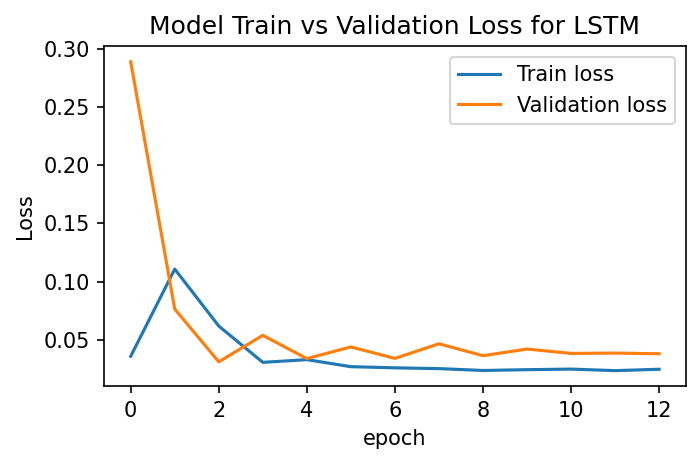

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])
Predicting test data...
Plotting true data and predictions...


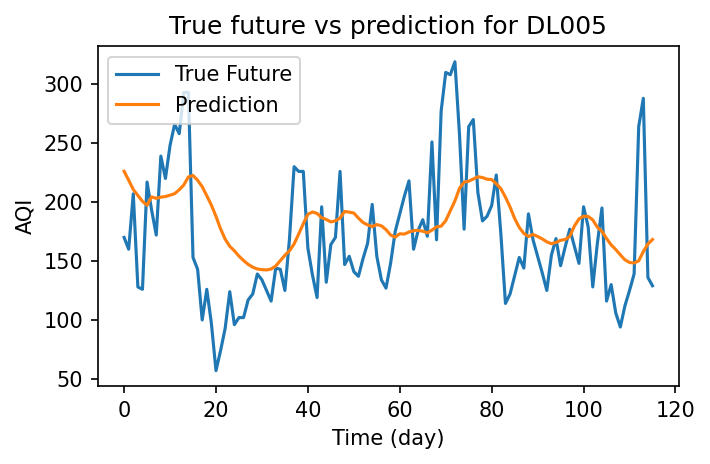

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,AQI,Predicted AQI
Date,,,,,,,,,,,,,
2020-03-08,81.50,138.54,16.82,36.08,32.90,42.44,1.03,16.610000,36.36,0.288017,113.550000,170.0,226.094116
2020-03-09,73.21,158.66,4.40,26.25,17.56,42.58,0.74,16.870000,38.23,0.286843,119.045000,160.0,218.540680
2020-03-10,93.48,175.70,3.74,21.72,14.60,41.62,0.95,18.980000,59.73,0.285669,124.540000,207.0,210.637695
2020-03-11,64.25,114.38,2.32,23.29,14.29,39.70,1.61,16.150000,59.05,0.284496,130.035000,128.0,205.598587
2020-03-12,63.17,177.96,4.60,28.90,19.11,35.61,0.90,15.660000,46.13,0.283322,135.530000,126.0,200.623901
2020-03-13,109.00,312.33,14.81,39.62,33.16,37.57,0.97,22.560000,45.96,0.282149,193.040000,217.0,197.268265
2020-03-14,51.53,111.34,3.28,29.96,18.62,39.62,0.76,14.600000,30.54,0.280975,124.820000,193.0,204.428558
2020-03-15,94.52,169.34,6.92,28.96,21.05,41.72,1.17,23.390000,52.50,0.279802,136.630000,172.0,203.159912
2020-03-16,97.81,186.27,3.39,30.62,19.07,41.86,0.64,24.100000,44.16,0.278628,118.465000,239.0,204.162125


Evaluating predictions...
LSTM:
Mean Absolute Error: 41.4438
Root Mean Square Error: 51.9043
Coefficient of Determination: 0.0965

Training model for DL006...
Model: "sequential_13"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_26 (LSTM)               (None, 30, 100)           43600     
_________________________________________________________________
dropout_26 (Dropout)         (None, 30, 100)           0         
_________________________________________________________________
lstm_27 (LSTM)               (None, 64)                42240     
_________________________________________________________________
dropout_27 (Dropout)         (None, 64)                0         
_________________________________________________________________
dense_13 (Dense)             (None, 1)                 65        
Total params: 85,905
Trainable params: 85,905
Non-trainable params: 0
______________________

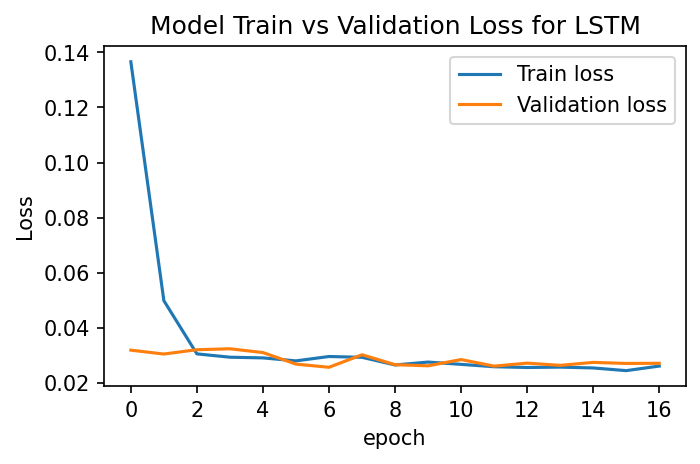

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])
Predicting test data...
Plotting true data and predictions...


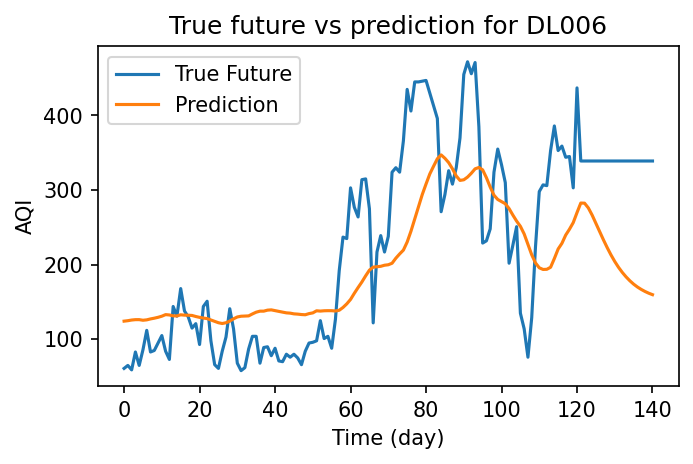

,PM2.5,PM10,NO,NO2,NOx,CO,O3,Benzene,AQI,Predicted AQI
Date,,,,,,,,,,
2019-08-14,38.908571,54.23,17.51,30.66,48.17,0.47,18.58,1.1,61.0,124.338722
2019-08-15,39.228393,47.84,20.57,31.60,52.16,0.47,17.90,1.1,65.0,124.949089
2019-08-16,39.548214,36.80,16.14,30.18,46.32,0.42,14.82,1.1,59.0,125.834930
2019-08-17,39.868036,19.39,19.25,35.92,55.17,0.39,29.03,1.1,83.0,126.328918
2019-08-18,40.187857,28.84,16.86,29.41,46.26,0.46,46.53,1.1,65.0,126.361366
2019-08-19,40.507679,69.85,30.13,35.53,65.66,0.66,46.93,1.1,86.0,125.536446
2019-08-20,40.827500,86.48,26.74,34.98,61.72,0.56,46.43,1.1,112.0,126.070206
2019-08-21,41.147321,82.55,17.17,36.43,53.60,0.52,51.41,1.1,83.0,127.315910
2019-08-22,41.467143,88.60,22.05,38.83,60.88,0.58,49.20,1.1,85.0,128.300583


Evaluating predictions...
LSTM:
Mean Absolute Error: 77.9684
Root Mean Square Error: 93.0814
Coefficient of Determination: 0.4738

Training model for DL007...
Model: "sequential_14"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_28 (LSTM)               (None, 30, 100)           44400     
_________________________________________________________________
dropout_28 (Dropout)         (None, 30, 100)           0         
_________________________________________________________________
lstm_29 (LSTM)               (None, 64)                42240     
_________________________________________________________________
dropout_29 (Dropout)         (None, 64)                0         
_________________________________________________________________
dense_14 (Dense)             (None, 1)                 65        
Total params: 86,705
Trainable params: 86,705
Non-trainable params: 0
______________________

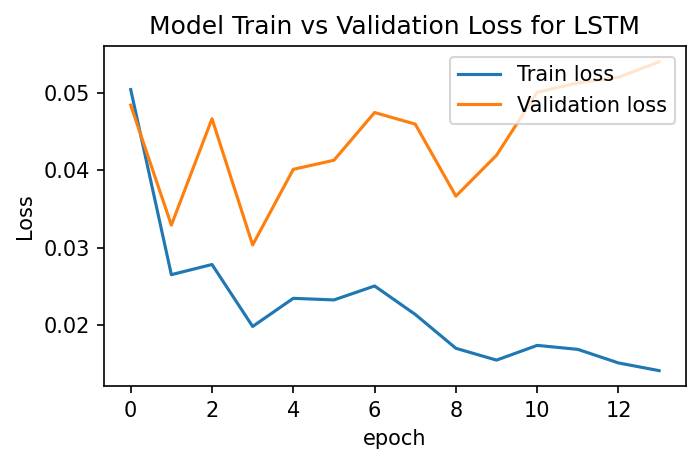

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])
Predicting test data...
Plotting true data and predictions...


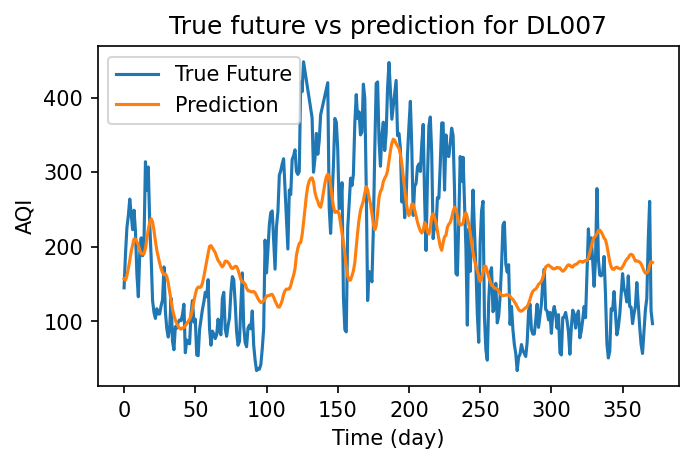

,PM2.5,PM10,NO,NO2,NOx,CO,O3,Benzene,Toluene,Xylene,AQI,Predicted AQI
Date,,,,,,,,,,,,
2019-06-26,78.33,168.62,17.97,26.14,44.12,0.93,29.850000,0.0,0.0,0.0,145.0,157.157669
2019-06-27,54.11,277.92,27.40,34.97,62.38,1.47,15.240000,0.0,0.0,0.0,191.0,155.230988
2019-06-28,49.58,275.50,25.80,33.38,59.18,1.44,16.740000,0.0,0.0,0.0,226.0,161.462296
2019-06-29,54.04,298.94,24.87,31.68,56.56,1.16,17.330000,0.0,0.0,0.0,242.0,170.981293
2019-06-30,44.98,311.01,16.05,20.09,36.14,1.61,19.245385,0.0,0.0,0.0,264.0,181.793091
2019-07-01,60.06,221.96,9.75,16.23,25.98,1.06,21.160769,0.0,0.0,0.0,243.0,193.986923
2019-07-02,77.60,252.06,7.62,15.50,23.12,1.04,23.076154,0.0,0.0,0.0,223.0,202.470428
2019-07-03,42.10,97.04,5.89,13.60,19.50,0.73,24.991538,0.0,0.0,0.0,249.0,210.717194
2019-07-04,35.69,95.16,6.74,13.75,20.48,1.13,26.906923,0.0,0.0,0.0,220.0,210.388977


Evaluating predictions...
LSTM:
Mean Absolute Error: 70.4677
Root Mean Square Error: 83.2256
Coefficient of Determination: 0.4289

Training model for DL008...
Model: "sequential_15"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_30 (LSTM)               (None, 30, 100)           44800     
_________________________________________________________________
dropout_30 (Dropout)         (None, 30, 100)           0         
_________________________________________________________________
lstm_31 (LSTM)               (None, 64)                42240     
_________________________________________________________________
dropout_31 (Dropout)         (None, 64)                0         
_________________________________________________________________
dense_15 (Dense)             (None, 1)                 65        
Total params: 87,105
Trainable params: 87,105
Non-trainable params: 0
______________________

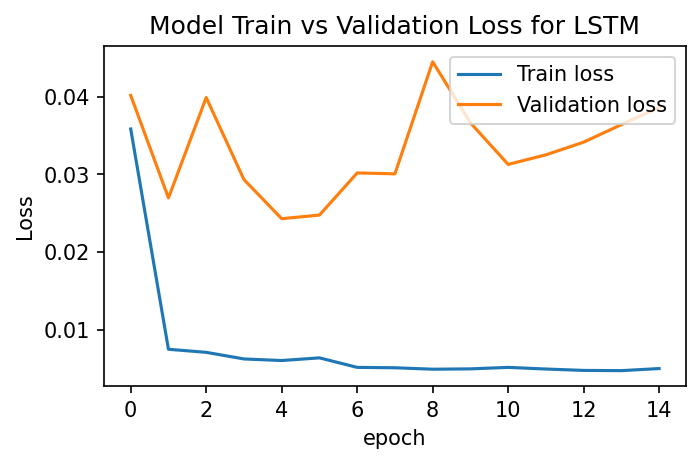

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])
Predicting test data...
Plotting true data and predictions...


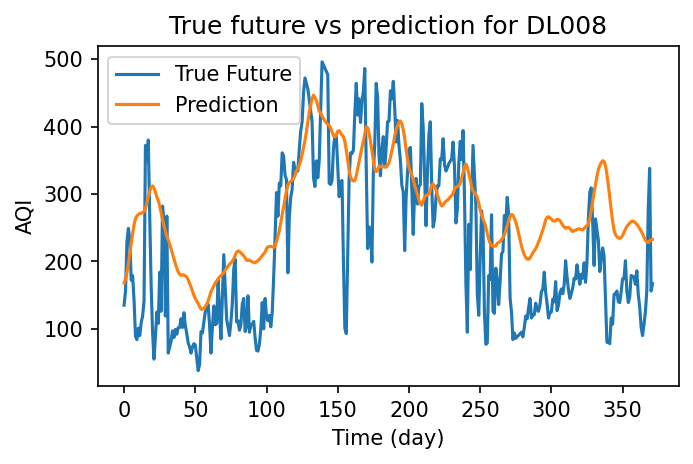

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,AQI,Predicted AQI
Date,,,,,,,,,,,,,
2019-06-26,66.89,156.41,27.22,28.73,37.06,24.88,0.55,19.380000,46.47,6.34,14.0,135.0,167.800522
2019-06-27,70.78,249.73,26.64,30.24,37.40,24.17,0.56,17.620000,47.94,5.06,14.0,156.0,173.911957
2019-06-28,76.01,272.11,28.68,28.86,38.27,23.29,0.58,18.890000,36.11,5.88,14.0,229.0,183.703201
2019-06-29,68.13,311.25,32.36,32.10,42.96,29.49,0.45,25.250000,33.78,5.32,14.0,249.0,196.110916
2019-06-30,61.08,266.64,38.91,38.05,51.36,34.28,0.44,21.180000,40.53,5.53,14.0,233.0,211.535553
2019-07-01,56.45,176.21,24.92,39.22,40.80,32.73,0.34,19.390000,65.55,5.01,14.0,172.0,227.105484
2019-07-02,62.65,226.01,20.97,39.14,37.60,31.72,0.41,17.740000,76.24,5.46,14.0,179.0,241.361298
2019-07-03,42.46,115.82,26.65,42.98,44.18,30.52,0.48,15.280000,43.53,6.94,14.0,142.0,254.591705
2019-07-04,33.01,65.03,33.04,41.32,48.42,35.70,0.46,14.940000,27.98,7.29,14.0,89.0,263.286835


Evaluating predictions...
LSTM:
Mean Absolute Error: 82.1126
Root Mean Square Error: 96.8286
Coefficient of Determination: 0.3205

Training model for DL009...
Model: "sequential_16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_32 (LSTM)               (None, 30, 100)           44800     
_________________________________________________________________
dropout_32 (Dropout)         (None, 30, 100)           0         
_________________________________________________________________
lstm_33 (LSTM)               (None, 64)                42240     
_________________________________________________________________
dropout_33 (Dropout)         (None, 64)                0         
_________________________________________________________________
dense_16 (Dense)             (None, 1)                 65        
Total params: 87,105
Trainable params: 87,105
Non-trainable params: 0
______________________

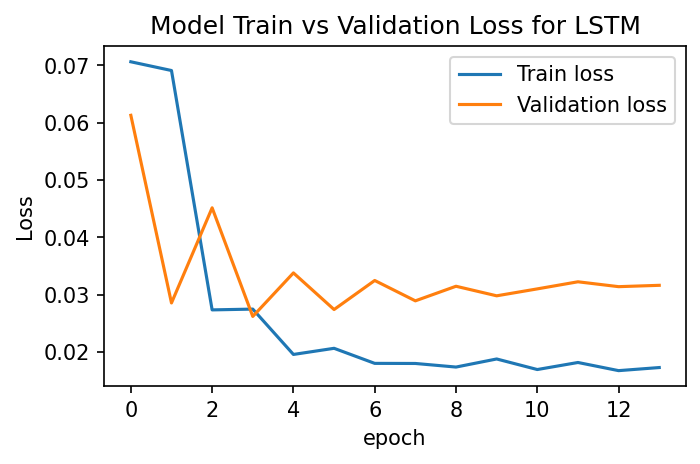

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])
Predicting test data...
Plotting true data and predictions...


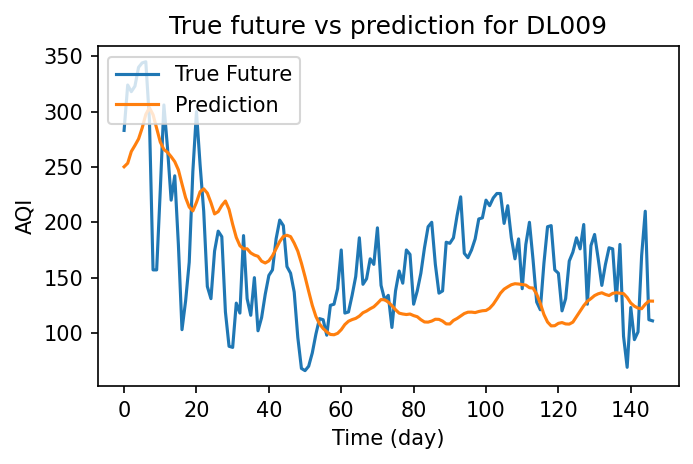

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,AQI,Predicted AQI
Date,,,,,,,,,,,,,
2020-02-06,114.28,187.29,20.70,45.67,41.17,19.18,1.09,11.50,47.900,3.71,17.25,283.0,250.155197
2020-02-07,163.67,262.31,53.30,63.04,76.43,20.47,1.62,17.67,47.520,5.35,29.72,324.0,253.365952
2020-02-08,146.03,227.92,19.52,47.41,41.08,21.07,1.23,16.11,51.150,4.50,17.73,318.0,263.969360
2020-02-09,148.83,250.30,29.42,53.35,52.35,21.52,1.50,13.15,53.960,4.95,18.70,323.0,269.453857
2020-02-10,188.08,306.66,36.81,57.26,60.46,25.03,1.77,14.65,51.480,5.48,23.59,340.0,275.323425
2020-02-11,168.49,292.62,55.38,61.24,77.71,23.06,2.13,15.56,47.390,7.96,43.26,344.0,285.219360
2020-02-12,179.34,291.44,14.18,42.03,33.90,23.63,1.30,18.84,62.700,5.23,25.07,345.0,297.400513
2020-02-13,94.06,177.15,4.80,24.53,16.97,18.99,0.75,19.73,63.760,2.35,6.33,293.0,303.485657
2020-02-14,67.92,165.48,4.97,21.21,15.35,15.22,0.71,13.11,75.690,2.05,7.38,157.0,297.264130


Evaluating predictions...
LSTM:
Mean Absolute Error: 47.6374
Root Mean Square Error: 56.8470
Coefficient of Determination: 0.0020

Training model for DL010...
Model: "sequential_17"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_34 (LSTM)               (None, 30, 100)           44800     
_________________________________________________________________
dropout_34 (Dropout)         (None, 30, 100)           0         
_________________________________________________________________
lstm_35 (LSTM)               (None, 64)                42240     
_________________________________________________________________
dropout_35 (Dropout)         (None, 64)                0         
_________________________________________________________________
dense_17 (Dense)             (None, 1)                 65        
Total params: 87,105
Trainable params: 87,105
Non-trainable params: 0
______________________

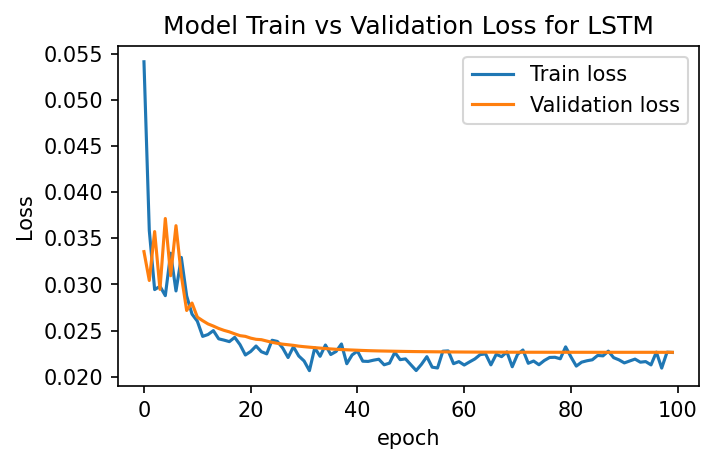

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])
Predicting test data...
Plotting true data and predictions...


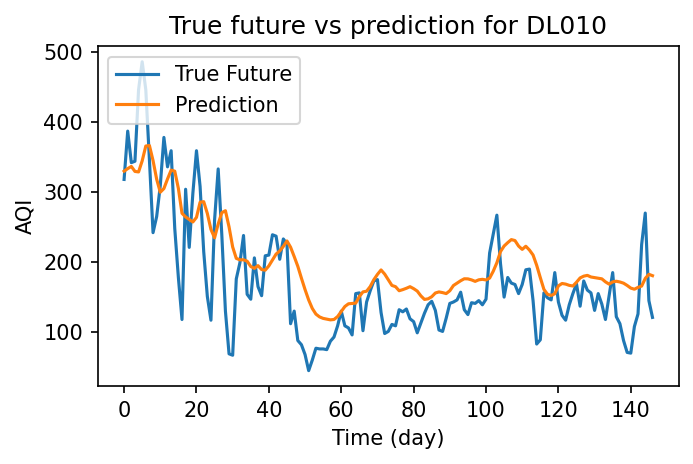

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,AQI,Predicted AQI
Date,,,,,,,,,,,,,
2020-02-06,137.43,341.42,83.360,61.320000,100.570000,33.65,1.63,22.350,28.36,3.90,21.93,318.0,329.791199
2020-02-07,169.73,383.60,62.935,75.190000,83.055000,34.86,1.71,20.170,34.20,6.62,37.62,387.0,333.443848
2020-02-08,181.59,358.31,42.510,58.050000,65.540000,37.53,1.20,19.790,34.85,3.81,18.96,342.0,336.592499
2020-02-09,176.85,400.97,56.300,66.900000,81.480000,33.83,1.39,20.450,35.81,4.16,20.23,344.0,329.452240
2020-02-10,228.59,449.37,107.540,67.756667,80.666667,36.19,2.15,20.740,29.59,5.69,30.10,446.0,328.703827
2020-02-11,247.96,533.85,79.590,68.613333,79.853333,45.45,3.10,21.070,30.18,7.53,46.49,486.0,344.540771
2020-02-12,208.99,421.19,51.640,69.470000,79.040000,43.49,1.45,23.250,33.94,4.50,21.30,446.0,365.723389
2020-02-13,142.62,300.21,22.710,50.090000,45.150000,36.98,0.92,30.930,34.21,2.80,10.51,346.0,366.421478
2020-02-14,96.72,226.89,23.520,48.800000,45.120000,34.83,0.96,19.380,35.48,2.65,13.78,242.0,344.952637


Evaluating predictions...
LSTM:
Mean Absolute Error: 47.4326
Root Mean Square Error: 59.4049
Coefficient of Determination: 0.5034

Training model for DL012...
Model: "sequential_18"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_36 (LSTM)               (None, 30, 100)           43200     
_________________________________________________________________
dropout_36 (Dropout)         (None, 30, 100)           0         
_________________________________________________________________
lstm_37 (LSTM)               (None, 64)                42240     
_________________________________________________________________
dropout_37 (Dropout)         (None, 64)                0         
_________________________________________________________________
dense_18 (Dense)             (None, 1)                 65        
Total params: 85,505
Trainable params: 85,505
Non-trainable params: 0
______________________

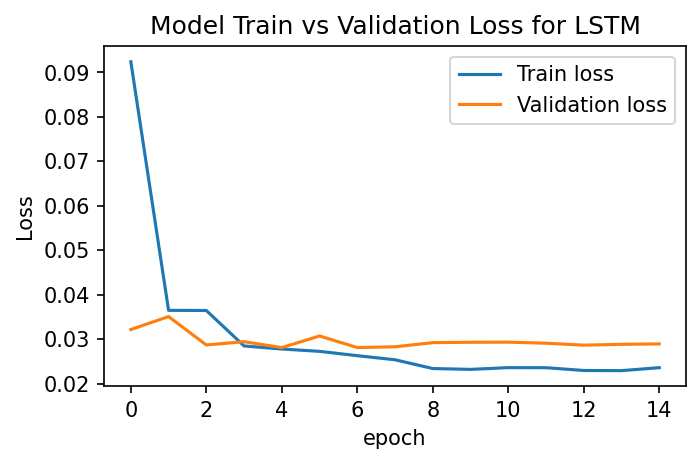

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])
Predicting test data...
Plotting true data and predictions...


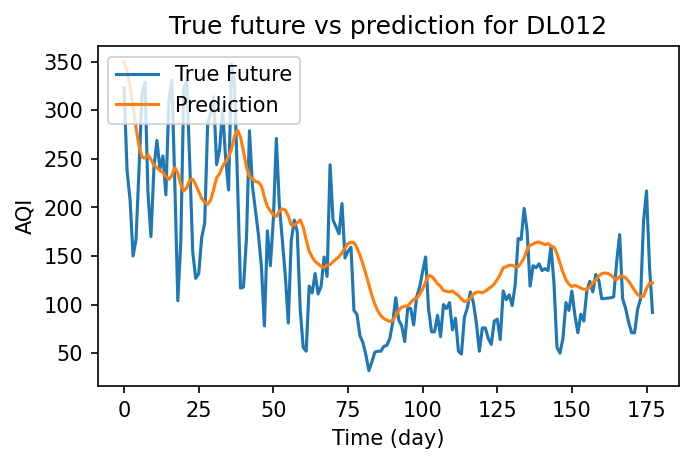

,PM2.5,PM10,NO,NO2,NOx,CO,O3,AQI,Predicted AQI
Date,,,,,,,,,
2020-01-06,143.52,232.42,89.660,33.20,122.640,1.31,9.69,323.0,349.981110
2020-01-07,93.73,156.70,50.830,13.15,63.400,0.81,10.69,238.0,340.647278
2020-01-08,89.49,126.17,56.690,11.19,63.960,0.31,7.97,208.0,324.100830
2020-01-09,62.94,110.49,28.550,31.51,35.680,0.35,9.62,150.0,304.614319
2020-01-10,90.20,163.82,28.680,42.83,71.370,0.66,11.58,167.0,281.895599
2020-01-11,106.42,188.34,50.100,53.16,102.750,0.80,14.84,239.0,263.641357
2020-01-12,160.11,300.74,52.320,81.66,103.350,1.79,12.76,317.0,251.645325
2020-01-13,152.33,261.58,54.540,51.82,103.950,1.14,13.31,329.0,250.888443
2020-01-14,74.38,132.81,40.940,44.01,84.680,0.52,9.22,215.0,254.134171


Evaluating predictions...
LSTM:
Mean Absolute Error: 43.4165
Root Mean Square Error: 55.4448
Coefficient of Determination: 0.4450

Training model for DL013...
Model: "sequential_19"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_38 (LSTM)               (None, 30, 100)           43200     
_________________________________________________________________
dropout_38 (Dropout)         (None, 30, 100)           0         
_________________________________________________________________
lstm_39 (LSTM)               (None, 64)                42240     
_________________________________________________________________
dropout_39 (Dropout)         (None, 64)                0         
_________________________________________________________________
dense_19 (Dense)             (None, 1)                 65        
Total params: 85,505
Trainable params: 85,505
Non-trainable params: 0
______________________

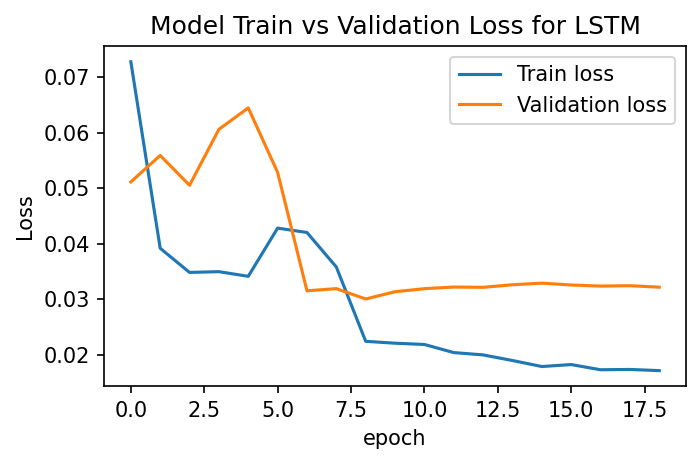

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])
Predicting test data...
Plotting true data and predictions...


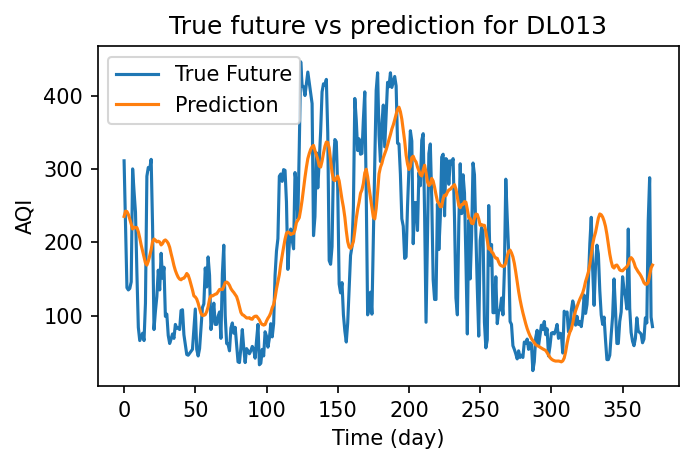

,PM2.5,NO,NO2,NOx,NH3,CO,SO2,AQI,Predicted AQI
Date,,,,,,,,,
2019-06-26,152.58,8.27,26.75,20.59,27.04,0.72,12.26,311.0,235.203766
2019-06-27,71.58,6.50,23.53,17.49,23.33,0.64,13.12,224.5,242.366043
2019-06-28,70.45,6.65,26.37,19.11,23.51,0.66,13.57,138.0,241.824173
2019-06-29,70.37,6.18,22.05,16.48,22.38,0.66,12.41,135.0,237.848541
2019-06-30,71.41,10.24,22.32,19.88,24.34,0.70,14.20,137.0,231.498016
2019-07-01,85.62,5.30,15.08,12.15,19.50,0.66,13.63,146.0,224.562744
2019-07-02,154.12,7.12,22.30,17.32,18.74,0.55,13.23,300.0,218.069794
2019-07-03,94.88,4.71,17.58,12.97,16.22,0.53,11.19,269.0,220.527039
2019-07-04,107.00,8.88,19.15,17.13,20.57,0.66,12.56,241.0,219.772247


Evaluating predictions...
LSTM:
Mean Absolute Error: 66.3414
Root Mean Square Error: 79.8063
Coefficient of Determination: 0.4977

Training model for DL014...
Model: "sequential_20"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_40 (LSTM)               (None, 30, 100)           44000     
_________________________________________________________________
dropout_40 (Dropout)         (None, 30, 100)           0         
_________________________________________________________________
lstm_41 (LSTM)               (None, 64)                42240     
_________________________________________________________________
dropout_41 (Dropout)         (None, 64)                0         
_________________________________________________________________
dense_20 (Dense)             (None, 1)                 65        
Total params: 86,305
Trainable params: 86,305
Non-trainable params: 0
______________________

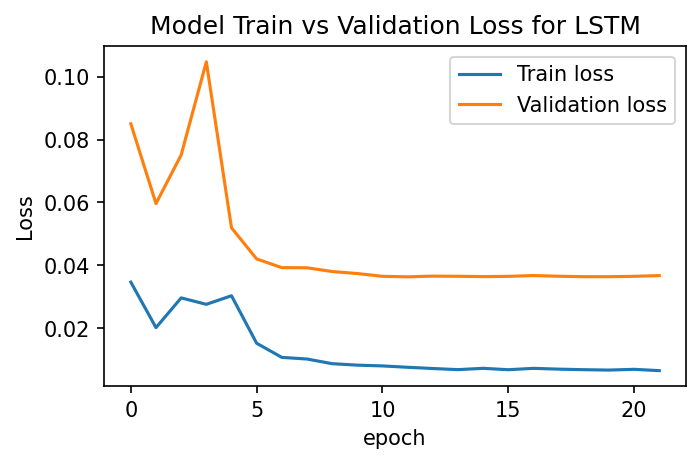

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])
Predicting test data...
Plotting true data and predictions...


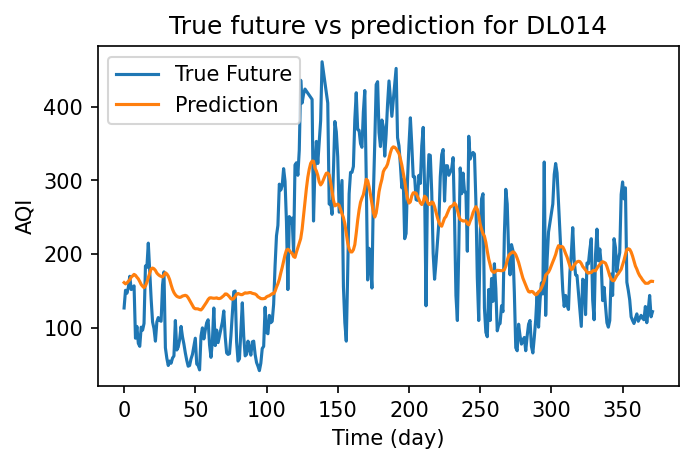

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,AQI,Predicted AQI
Date,,,,,,,,,,,
2019-06-26,69.68,127.41,15.04,27.380,25.600,23.090,1.43,3.10,36.99,127.0,161.449020
2019-06-27,73.25,170.67,17.33,25.300,26.470,25.270,1.42,8.80,36.73,151.0,159.683212
2019-06-28,54.65,165.67,21.43,24.880,30.460,28.030,1.38,7.92,27.04,147.0,160.977066
2019-06-29,48.02,193.35,14.43,18.960,21.690,19.500,1.33,5.77,27.85,155.0,163.060333
2019-06-30,61.47,215.43,21.93,24.070,30.580,25.360,1.47,7.13,26.40,170.0,165.310486
2019-07-01,56.42,150.73,14.33,24.310,24.500,23.220,1.36,7.92,44.89,152.0,168.859787
2019-07-02,74.99,192.65,12.38,21.780,21.380,23.310,1.35,7.53,51.24,154.0,170.555847
2019-07-03,41.25,78.56,21.80,41.460,39.440,19.140,1.49,1.62,16.78,157.0,172.596375
2019-07-04,45.94,80.48,26.19,36.880,40.490,16.510,1.48,1.54,14.29,86.0,171.359222


Evaluating predictions...
LSTM:
Mean Absolute Error: 63.3867
Root Mean Square Error: 74.5197
Coefficient of Determination: 0.5577

Training model for DL015...
Model: "sequential_21"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_42 (LSTM)               (None, 30, 100)           44800     
_________________________________________________________________
dropout_42 (Dropout)         (None, 30, 100)           0         
_________________________________________________________________
lstm_43 (LSTM)               (None, 64)                42240     
_________________________________________________________________
dropout_43 (Dropout)         (None, 64)                0         
_________________________________________________________________
dense_21 (Dense)             (None, 1)                 65        
Total params: 87,105
Trainable params: 87,105
Non-trainable params: 0
______________________

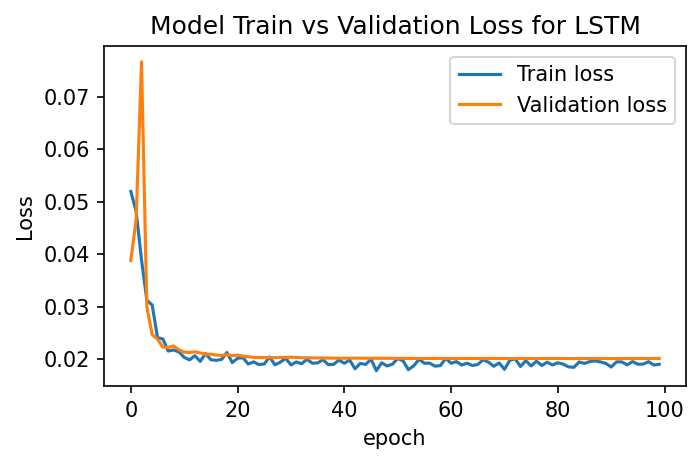

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])
Predicting test data...
Plotting true data and predictions...


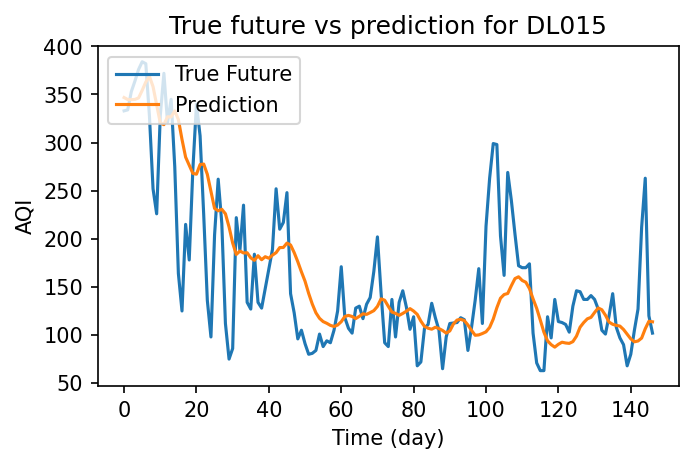

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,AQI,Predicted AQI
Date,,,,,,,,,,,,,
2020-02-06,146.51,250.04,56.97,138.430000,152.710,88.920000,1.49,7.68,4.13,3.369806,24.11,333.0,346.816284
2020-02-07,177.56,293.62,73.59,138.150000,146.330,89.454286,1.70,7.63,3.70,3.343484,23.89,334.0,344.770538
2020-02-08,198.26,305.01,53.68,137.870000,126.370,89.988571,1.78,7.91,3.67,3.317161,24.86,353.0,344.623627
2020-02-09,206.41,319.56,51.94,137.590000,134.440,90.522857,1.74,7.76,3.63,3.290839,23.14,364.0,344.891785
2020-02-10,231.86,376.61,71.89,137.310000,151.320,91.057143,1.93,7.73,3.51,3.264516,27.70,376.0,346.416504
2020-02-11,217.72,375.86,67.03,137.030000,144.550,91.591429,2.17,7.94,4.41,3.238194,34.79,384.0,354.284912
2020-02-12,217.49,353.08,62.17,136.750000,137.780,92.125714,2.01,7.68,3.79,3.211871,28.80,382.0,362.968842
2020-02-13,120.41,218.29,32.80,136.470000,99.300,92.660000,1.65,7.54,3.69,3.185548,22.16,328.0,368.897247
2020-02-14,96.73,222.97,28.36,117.080000,85.380,101.260000,1.39,7.81,3.74,3.159226,22.15,252.0,358.158081


Evaluating predictions...
LSTM:
Mean Absolute Error: 39.8731
Root Mean Square Error: 57.1699
Coefficient of Determination: 0.4960

Training model for DL016...
Model: "sequential_22"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_44 (LSTM)               (None, 30, 100)           44800     
_________________________________________________________________
dropout_44 (Dropout)         (None, 30, 100)           0         
_________________________________________________________________
lstm_45 (LSTM)               (None, 64)                42240     
_________________________________________________________________
dropout_45 (Dropout)         (None, 64)                0         
_________________________________________________________________
dense_22 (Dense)             (None, 1)                 65        
Total params: 87,105
Trainable params: 87,105
Non-trainable params: 0
______________________

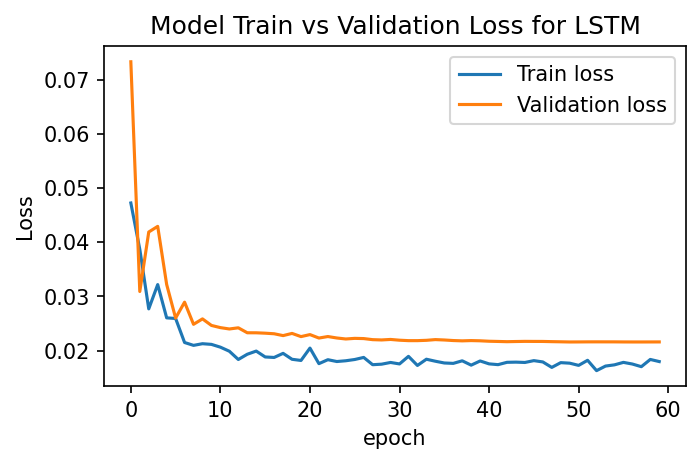

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])
Predicting test data...
Plotting true data and predictions...


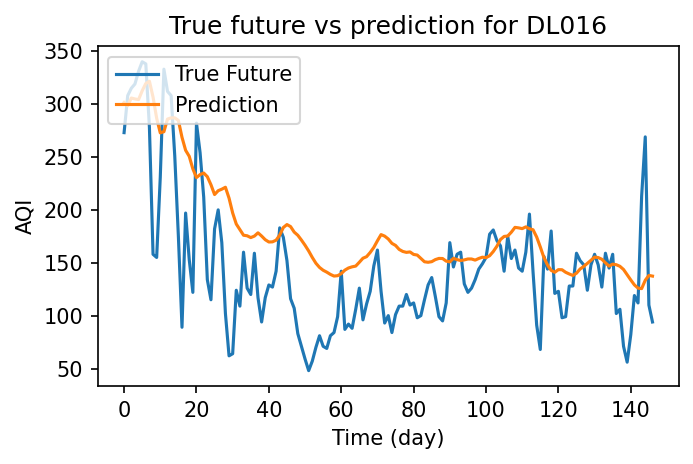

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,AQI,Predicted AQI
Date,,,,,,,,,,,,,
2020-02-06,104.01,180.71,70.580,78.08,99.080,30.71,1.12,15.82,35.06,4.860,18.97,273.0,301.542755
2020-02-07,149.65,252.21,66.150,86.74,204.110,31.97,2.04,22.42,25.55,6.820,24.54,308.0,298.485107
2020-02-08,144.42,224.58,61.720,79.13,92.410,31.42,1.16,18.95,35.40,5.390,15.74,315.0,305.728333
2020-02-09,141.94,232.08,61.450,82.02,93.710,31.66,1.24,19.62,42.77,6.270,16.34,319.0,304.850677
2020-02-10,171.76,280.46,126.890,94.03,153.470,30.62,1.84,18.70,39.94,7.100,25.85,331.0,304.221558
2020-02-11,167.59,287.04,96.795,101.06,126.595,30.16,2.58,16.73,39.35,6.375,33.95,340.0,312.556427
2020-02-12,173.50,296.12,66.700,85.25,99.720,32.77,1.29,22.11,45.71,5.650,20.44,338.0,319.473114
2020-02-13,88.55,167.70,7.110,55.48,35.310,29.03,0.57,23.35,53.37,2.830,8.23,278.0,321.608856
2020-02-14,64.46,163.49,3.770,39.84,24.270,24.72,0.44,19.92,70.64,2.530,7.14,158.0,306.612061


Evaluating predictions...
LSTM:
Mean Absolute Error: 45.2134
Root Mean Square Error: 57.7026
Coefficient of Determination: 0.1806

Training model for DL017...
Model: "sequential_23"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_46 (LSTM)               (None, 30, 100)           44400     
_________________________________________________________________
dropout_46 (Dropout)         (None, 30, 100)           0         
_________________________________________________________________
lstm_47 (LSTM)               (None, 64)                42240     
_________________________________________________________________
dropout_47 (Dropout)         (None, 64)                0         
_________________________________________________________________
dense_23 (Dense)             (None, 1)                 65        
Total params: 86,705
Trainable params: 86,705
Non-trainable params: 0
______________________

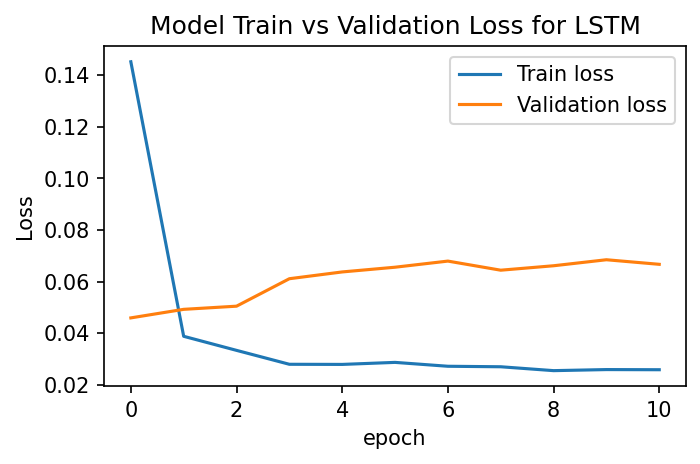

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])
Predicting test data...
Plotting true data and predictions...


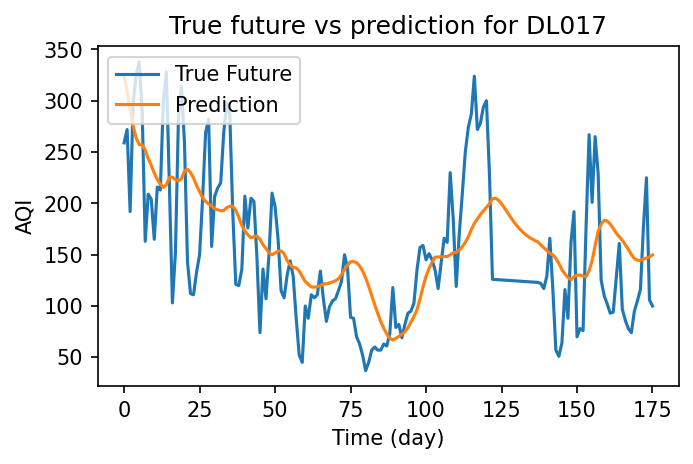

,PM2.5,PM10,NO,NO2,NOx,CO,O3,Benzene,Toluene,Xylene,AQI,Predicted AQI
Date,,,,,,,,,,,,
2020-01-08,148.16,127.85,19.75,24.58,44.32,1.7800,13.79,0.0,0.00,0.0,259.0,323.696472
2020-01-09,60.50,105.05,11.53,18.93,30.46,1.4200,21.47,0.0,0.01,0.0,272.0,309.242493
2020-01-10,123.14,161.64,25.74,27.46,53.19,1.7500,25.67,0.0,0.00,0.0,192.0,290.619415
2020-01-11,121.34,190.97,37.84,33.33,71.17,2.0000,27.78,0.0,0.00,0.0,299.0,275.624664
2020-01-12,151.97,230.99,73.91,39.14,113.05,2.1175,21.59,0.0,0.00,0.0,325.0,263.653168
2020-01-13,182.09,285.68,88.38,41.07,129.46,2.2350,17.99,0.0,0.00,0.0,338.0,257.298920
2020-01-14,95.04,142.32,14.86,23.08,37.94,2.3525,17.31,0.0,0.00,0.0,289.0,257.172180
2020-01-15,79.64,140.63,23.94,27.95,51.88,2.4700,18.98,0.0,0.00,0.0,163.0,251.929520
2020-01-16,106.03,170.17,22.97,27.90,50.88,1.1000,13.23,0.0,0.00,0.0,209.0,243.621231


Evaluating predictions...
LSTM:
Mean Absolute Error: 48.7990
Root Mean Square Error: 58.3300
Coefficient of Determination: 0.3435

Training model for DL018...
Model: "sequential_24"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_48 (LSTM)               (None, 30, 100)           44800     
_________________________________________________________________
dropout_48 (Dropout)         (None, 30, 100)           0         
_________________________________________________________________
lstm_49 (LSTM)               (None, 64)                42240     
_________________________________________________________________
dropout_49 (Dropout)         (None, 64)                0         
_________________________________________________________________
dense_24 (Dense)             (None, 1)                 65        
Total params: 87,105
Trainable params: 87,105
Non-trainable params: 0
______________________

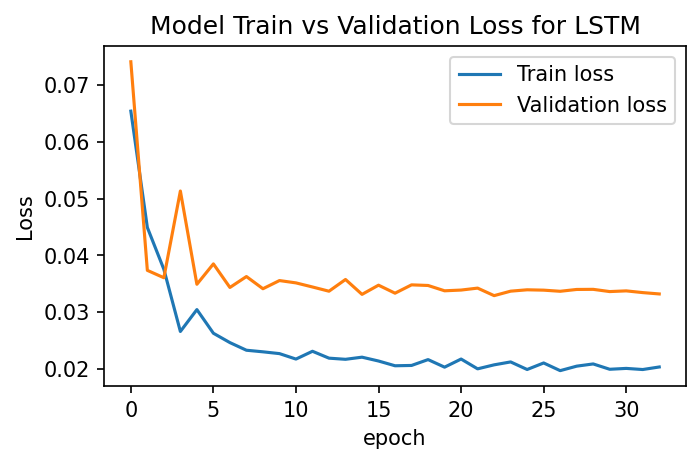

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])
Predicting test data...
Plotting true data and predictions...


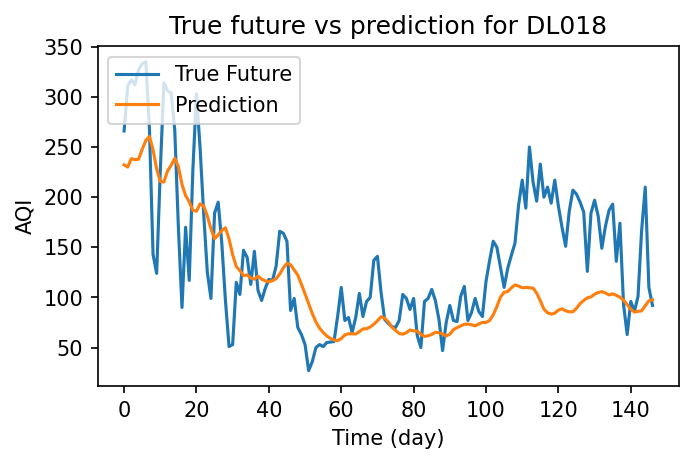

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,AQI,Predicted AQI
Date,,,,,,,,,,,,,
2020-02-06,106.90,175.86,57.73,54.95,76.31,37.22,1.22,14.05,17.62,6.22,13.45,266.0,232.178329
2020-02-07,148.21,234.65,163.67,60.62,165.55,38.49,1.84,18.78,26.97,9.57,26.67,311.0,230.042664
2020-02-08,142.28,214.94,46.84,57.56,68.79,43.23,1.12,17.09,18.99,6.92,16.63,317.0,238.372452
2020-02-09,138.04,226.04,83.19,60.17,99.82,40.23,1.42,17.63,19.93,7.18,15.62,312.0,237.348175
2020-02-10,161.67,267.90,173.14,67.71,177.70,42.35,2.03,17.41,20.88,8.62,24.01,327.0,237.838501
2020-02-11,160.07,270.65,128.71,71.50,139.20,38.13,2.56,17.47,23.47,7.54,21.34,333.0,247.644363
2020-02-12,168.03,276.31,84.28,60.17,100.70,46.69,1.36,18.95,22.38,8.31,23.31,335.0,256.427521
2020-02-13,85.78,157.76,3.86,44.34,26.72,39.79,0.78,18.36,21.93,4.45,10.07,268.0,260.457245
2020-02-14,60.98,134.05,2.61,39.64,23.15,33.10,0.58,14.61,26.41,4.27,5.72,143.0,247.315765


Evaluating predictions...
LSTM:
Mean Absolute Error: 46.9872
Root Mean Square Error: 59.9532
Coefficient of Determination: 0.3059

Training model for DL019...
Model: "sequential_25"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_50 (LSTM)               (None, 30, 100)           45200     
_________________________________________________________________
dropout_50 (Dropout)         (None, 30, 100)           0         
_________________________________________________________________
lstm_51 (LSTM)               (None, 64)                42240     
_________________________________________________________________
dropout_51 (Dropout)         (None, 64)                0         
_________________________________________________________________
dense_25 (Dense)             (None, 1)                 65        
Total params: 87,505
Trainable params: 87,505
Non-trainable params: 0
______________________

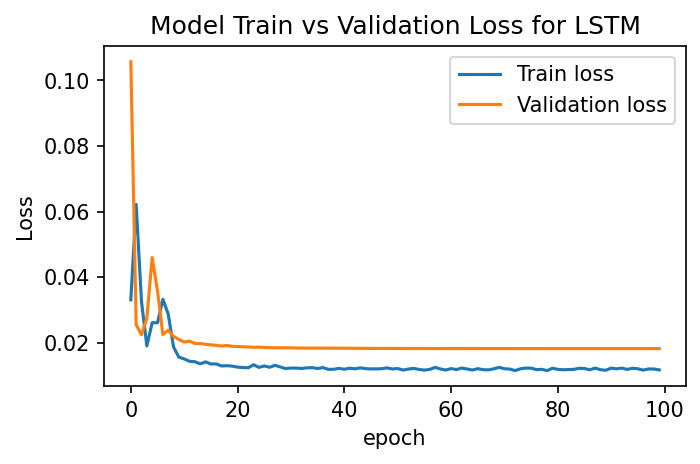

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])
Predicting test data...
Plotting true data and predictions...


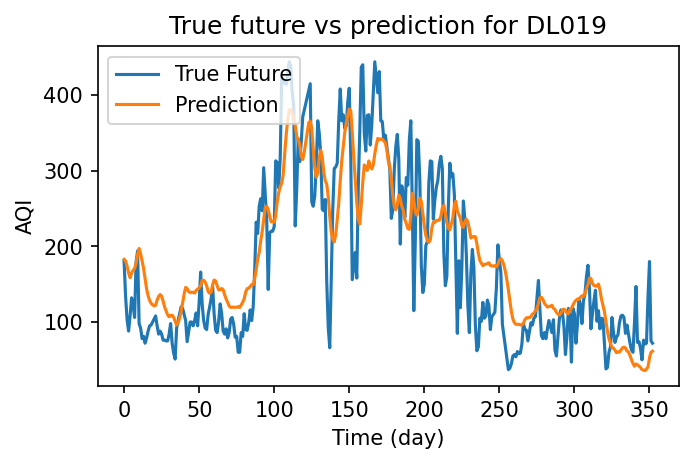

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,Predicted AQI
Date,,,,,,,,,,,,,,
2019-07-15,34.64,174.08,12.35,37.61,30.08,14.07,0.81,8.13,13.15,2.06,5.60,2.93,180.0,182.848663
2019-07-16,32.11,111.71,6.76,44.36,28.85,17.78,0.60,4.82,13.51,0.61,2.96,0.10,134.0,180.795197
2019-07-17,38.59,92.92,6.26,39.53,25.99,20.62,0.91,4.35,16.46,1.03,6.48,0.10,103.0,173.764938
2019-07-18,33.97,80.83,15.40,49.26,36.63,21.24,1.06,4.28,16.92,0.57,5.23,0.12,88.0,165.111038
2019-07-19,63.72,146.20,54.57,48.09,67.12,21.17,1.12,3.95,20.31,1.46,8.45,0.88,108.0,158.562149
2019-07-20,58.94,131.49,11.36,57.36,39.70,22.36,1.00,3.49,14.91,1.55,7.70,0.60,132.0,164.642670
2019-07-21,58.51,111.60,22.58,46.04,42.73,27.93,0.85,3.76,23.57,0.88,7.71,0.24,123.0,168.466644
2019-07-22,69.38,122.27,52.13,43.53,65.52,34.12,1.12,3.71,17.17,1.75,6.83,0.87,106.0,170.719452
2019-07-23,89.95,160.75,46.38,57.51,68.24,31.60,1.44,3.93,28.22,1.87,13.82,1.00,179.0,177.464935


Evaluating predictions...
LSTM:
Mean Absolute Error: 48.5519
Root Mean Square Error: 60.6762
Coefficient of Determination: 0.7076

Training model for DL020...
Model: "sequential_26"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_52 (LSTM)               (None, 30, 100)           44800     
_________________________________________________________________
dropout_52 (Dropout)         (None, 30, 100)           0         
_________________________________________________________________
lstm_53 (LSTM)               (None, 64)                42240     
_________________________________________________________________
dropout_53 (Dropout)         (None, 64)                0         
_________________________________________________________________
dense_26 (Dense)             (None, 1)                 65        
Total params: 87,105
Trainable params: 87,105
Non-trainable params: 0
______________________

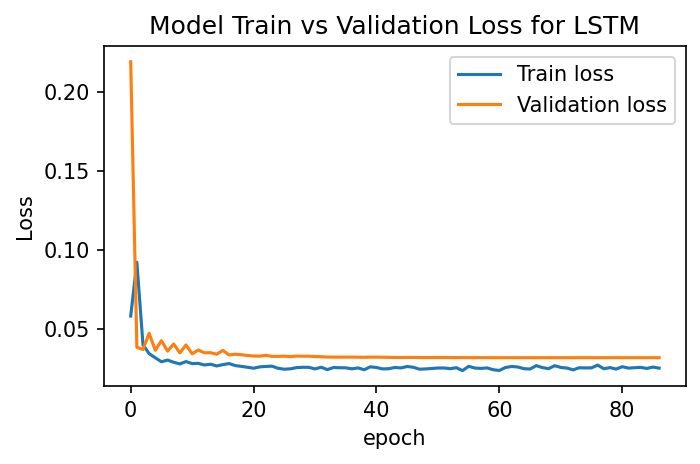

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])
Predicting test data...
Plotting true data and predictions...


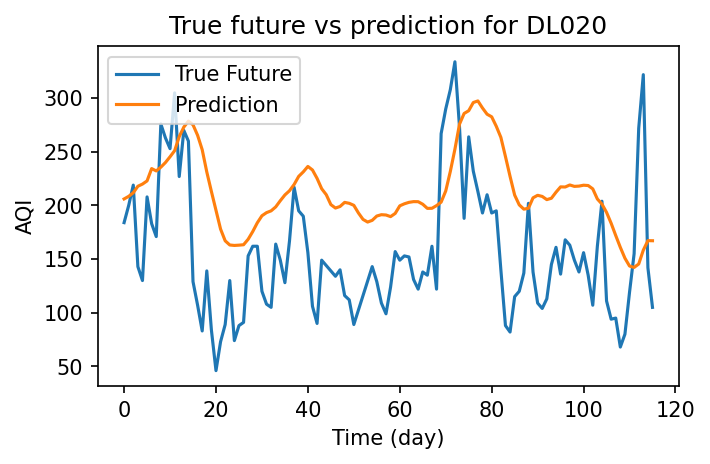

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,AQI,Predicted AQI
Date,,,,,,,,,,,,,
2020-03-08,93.48,153.87,40.90,33.00,50.91,38.94,1.01,14.720,50.370,2.65,43.34,184.0,206.096573
2020-03-09,79.52,159.06,11.44,26.84,23.60,32.11,0.60,15.390,52.910,1.28,20.11,200.0,208.528671
2020-03-10,101.27,179.62,12.43,30.78,26.51,32.24,0.65,13.350,56.485,1.56,19.85,219.0,211.862778
2020-03-11,59.92,124.48,7.90,37.09,26.17,35.83,0.70,11.070,60.060,1.52,13.67,143.0,217.928665
2020-03-12,60.54,191.60,21.49,45.13,41.54,34.57,0.86,11.800,45.290,2.20,26.92,130.0,219.956619
2020-03-13,92.52,308.00,31.70,46.26,50.34,30.02,0.69,18.440,51.380,1.88,31.42,208.0,222.923447
2020-03-14,45.25,112.92,14.36,39.57,32.76,32.53,0.60,12.990,32.260,1.53,26.08,183.0,234.394791
2020-03-15,103.00,181.46,23.16,38.84,39.54,39.18,0.75,19.510,60.150,2.14,32.59,171.0,232.218094
2020-03-16,103.69,210.15,9.24,31.91,24.51,37.59,0.65,29.840,57.110,1.40,20.36,276.0,235.733505


Evaluating predictions...
LSTM:
Mean Absolute Error: 69.0816
Root Mean Square Error: 78.5444
Coefficient of Determination: -0.6940

Training model for DL021...
Model: "sequential_27"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_54 (LSTM)               (None, 30, 100)           44000     
_________________________________________________________________
dropout_54 (Dropout)         (None, 30, 100)           0         
_________________________________________________________________
lstm_55 (LSTM)               (None, 64)                42240     
_________________________________________________________________
dropout_55 (Dropout)         (None, 64)                0         
_________________________________________________________________
dense_27 (Dense)             (None, 1)                 65        
Total params: 86,305
Trainable params: 86,305
Non-trainable params: 0
_____________________

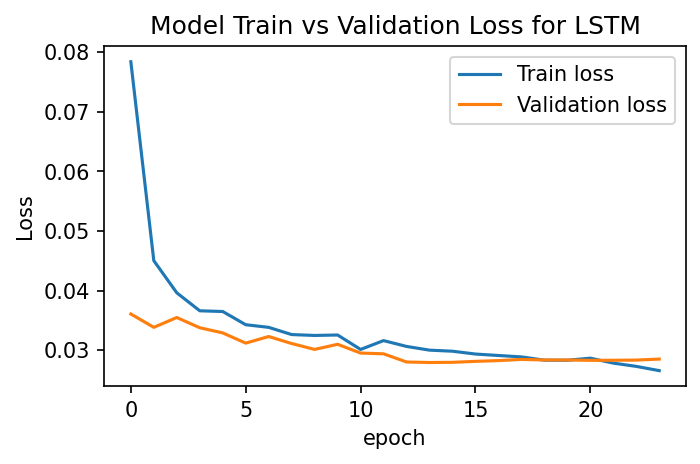

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])
Predicting test data...
Plotting true data and predictions...


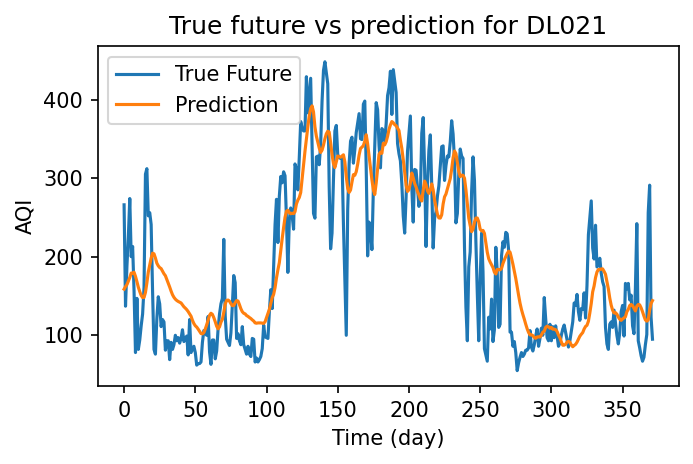

,PM2.5,NO,NO2,NOx,CO,SO2,O3,Benzene,Toluene,AQI,Predicted AQI
Date,,,,,,,,,,,
2019-06-26,79.29,5.80,24.38,11.80,0.70,6.27,34.65,3.01,6.06,266.0,158.711548
2019-06-27,75.65,11.08,35.93,26.92,0.72,6.70,35.45,2.55,5.24,137.0,161.895340
2019-06-28,90.36,9.80,43.06,30.75,0.63,10.27,28.60,1.74,7.62,188.0,164.444839
2019-06-29,102.85,9.01,34.00,25.30,0.60,6.56,29.75,1.39,5.21,226.0,168.870041
2019-06-30,113.93,11.24,34.07,27.12,0.59,7.60,27.58,1.03,2.57,274.0,173.436844
2019-07-01,79.73,7.88,27.00,20.66,0.58,7.33,45.39,0.86,1.88,200.0,179.143265
2019-07-02,102.12,6.48,25.46,18.72,0.62,6.81,65.37,1.12,2.57,213.0,179.198730
2019-07-03,49.33,5.09,24.62,17.16,0.91,6.80,38.55,0.86,1.66,156.0,180.211716
2019-07-04,50.43,9.17,29.35,22.94,0.71,7.04,20.30,0.10,0.24,78.0,174.953369


Evaluating predictions...
LSTM:
Mean Absolute Error: 46.3822
Root Mean Square Error: 58.6025
Coefficient of Determination: 0.7115

Training model for DL022...
Model: "sequential_28"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_56 (LSTM)               (None, 30, 100)           44800     
_________________________________________________________________
dropout_56 (Dropout)         (None, 30, 100)           0         
_________________________________________________________________
lstm_57 (LSTM)               (None, 64)                42240     
_________________________________________________________________
dropout_57 (Dropout)         (None, 64)                0         
_________________________________________________________________
dense_28 (Dense)             (None, 1)                 65        
Total params: 87,105
Trainable params: 87,105
Non-trainable params: 0
______________________

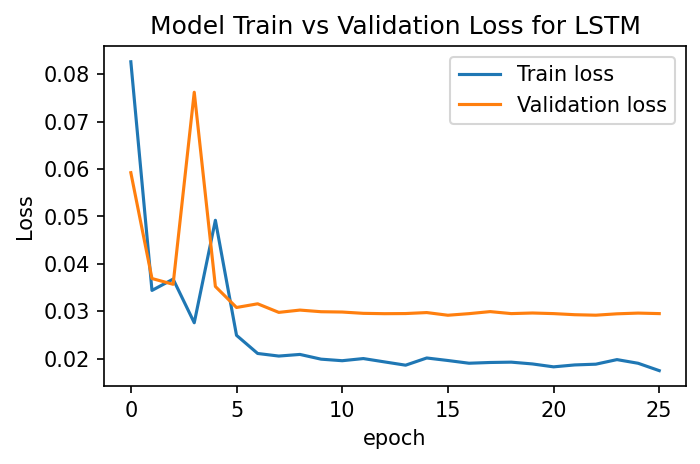

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])
Predicting test data...
Plotting true data and predictions...


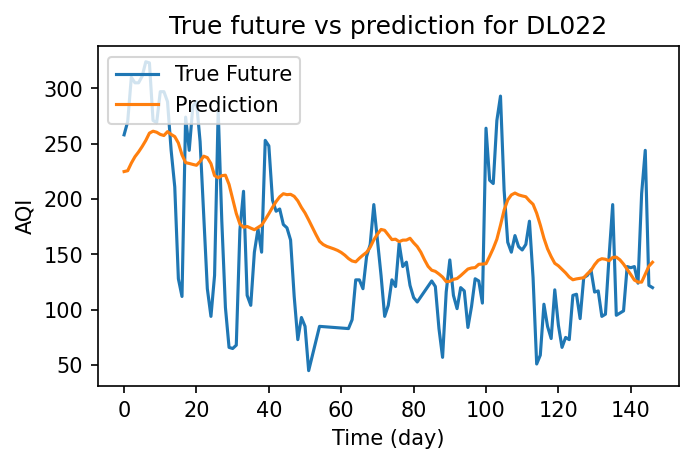

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,AQI,Predicted AQI
Date,,,,,,,,,,,,,
2020-02-06,86.15,121.76,2.880,24.38,15.290,27.28,0.86,6.300000,28.45,1.75,6.85,258.0,224.828888
2020-02-07,134.94,212.14,19.590,33.06,33.510,25.38,0.74,8.950000,28.46,3.39,32.57,270.0,225.593201
2020-02-08,134.62,188.73,6.160,22.20,16.770,24.64,0.65,10.360000,30.48,1.79,4.48,310.0,232.455750
2020-02-09,120.50,167.71,7.200,25.64,19.500,28.58,0.57,10.060000,32.29,1.84,4.11,305.0,238.219543
2020-02-10,138.09,190.85,7.770,25.34,19.820,29.61,0.63,9.590000,32.14,1.87,5.63,305.0,242.544876
2020-02-11,136.15,190.29,12.740,26.98,24.700,31.58,0.94,9.740000,32.88,2.09,8.98,311.0,247.483749
2020-02-12,160.90,232.58,6.910,29.74,21.440,32.21,0.67,7.440000,30.42,2.59,10.29,324.0,252.955444
2020-02-13,120.21,172.38,1.580,21.74,12.850,28.42,0.44,8.080000,28.07,1.91,4.00,323.0,259.538483
2020-02-14,113.50,177.72,1.560,21.65,12.770,24.59,0.73,10.420000,37.58,1.60,3.62,271.0,261.285431


Evaluating predictions...
LSTM:
Mean Absolute Error: 49.7733
Root Mean Square Error: 61.6199
Coefficient of Determination: 0.2399

Training model for DL023...
Model: "sequential_29"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_58 (LSTM)               (None, 30, 100)           44800     
_________________________________________________________________
dropout_58 (Dropout)         (None, 30, 100)           0         
_________________________________________________________________
lstm_59 (LSTM)               (None, 64)                42240     
_________________________________________________________________
dropout_59 (Dropout)         (None, 64)                0         
_________________________________________________________________
dense_29 (Dense)             (None, 1)                 65        
Total params: 87,105
Trainable params: 87,105
Non-trainable params: 0
______________________

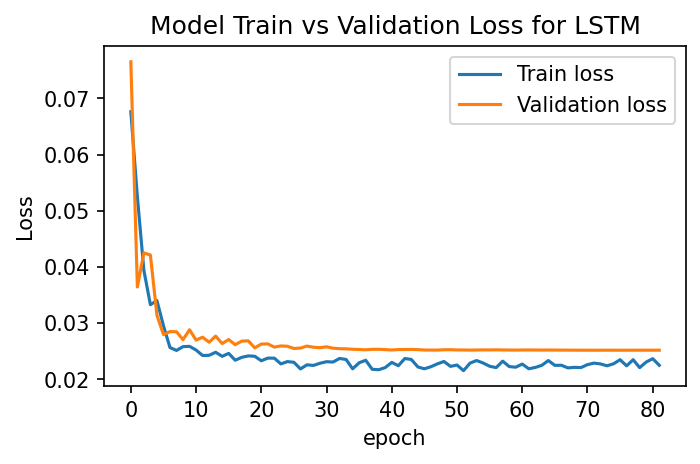

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])
Predicting test data...
Plotting true data and predictions...


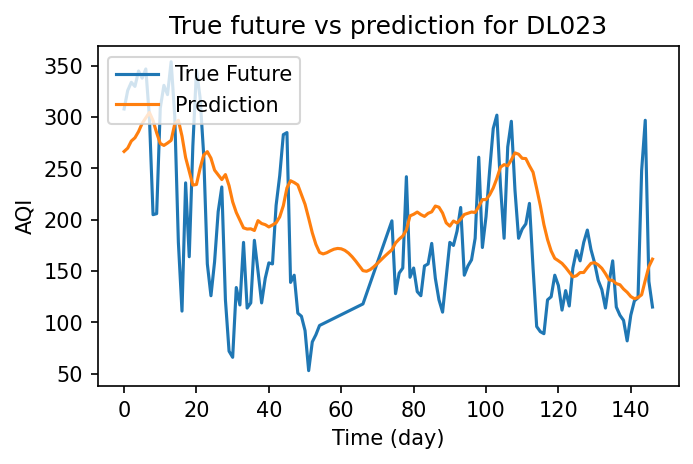

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,AQI,Predicted AQI
Date,,,,,,,,,,,,,
2020-02-06,140.19,258.29,20.180,38.510,36.92,33.35,0.68,18.04,45.89,3.16,83.180,308.0,266.595398
2020-02-07,156.72,272.83,13.315,47.470,83.92,31.64,0.97,16.68,36.60,4.21,89.050,326.0,269.832123
2020-02-08,161.60,256.98,6.450,35.680,24.23,32.59,0.54,18.33,43.23,2.81,29.940,334.0,276.762299
2020-02-09,175.39,276.50,11.900,39.360,30.63,33.52,0.77,20.66,43.09,3.35,21.550,330.0,279.911377
2020-02-10,173.39,294.97,23.530,45.540,43.38,32.01,0.85,18.74,38.92,3.81,22.730,345.0,286.003448
2020-02-11,164.03,280.80,23.690,49.460,45.60,31.71,0.76,17.56,40.32,3.94,54.570,338.0,294.046661
2020-02-12,185.94,300.24,6.530,36.550,24.76,39.50,1.10,23.26,48.47,3.03,9.890,347.0,299.313354
2020-02-13,96.17,167.71,4.770,23.790,16.55,35.65,0.95,19.22,51.83,1.62,3.650,300.0,304.596710
2020-02-14,84.27,178.02,5.010,22.560,16.08,32.92,0.74,22.45,53.89,1.67,6.400,205.0,296.640259


Evaluating predictions...
LSTM:
Mean Absolute Error: 53.8855
Root Mean Square Error: 65.8231
Coefficient of Determination: 0.1841

Training model for DL024...
Model: "sequential_30"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_60 (LSTM)               (None, 30, 100)           44800     
_________________________________________________________________
dropout_60 (Dropout)         (None, 30, 100)           0         
_________________________________________________________________
lstm_61 (LSTM)               (None, 64)                42240     
_________________________________________________________________
dropout_61 (Dropout)         (None, 64)                0         
_________________________________________________________________
dense_30 (Dense)             (None, 1)                 65        
Total params: 87,105
Trainable params: 87,105
Non-trainable params: 0
______________________

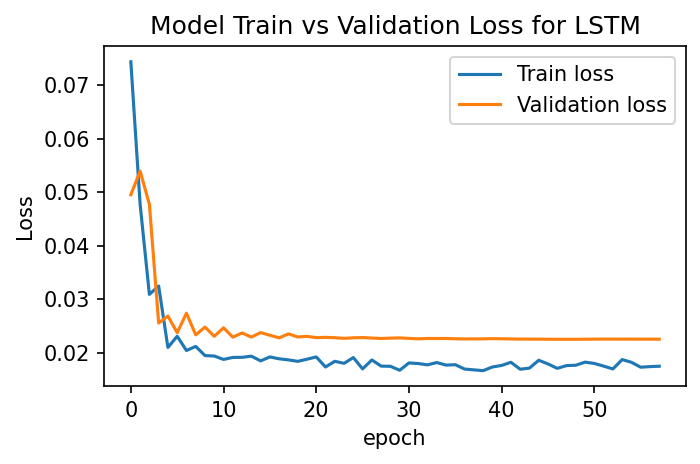

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])
Predicting test data...
Plotting true data and predictions...


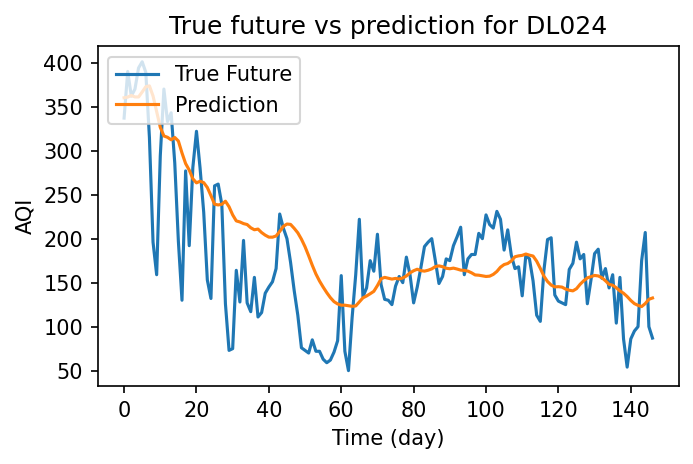

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,AQI,Predicted AQI
Date,,,,,,,,,,,,,
2020-02-06,188.39,262.20,25.71,39.25,41.840,46.86,1.30,15.61,34.01,7.010,15.20,337.0,360.077850
2020-02-07,233.74,344.09,25.98,45.55,87.930,40.75,1.85,19.14,40.23,7.955,24.94,390.0,360.870300
2020-02-08,193.42,271.84,26.25,35.99,40.550,29.08,1.26,15.23,37.13,8.900,17.74,362.0,362.700623
2020-02-09,222.89,317.01,28.13,39.10,43.720,23.27,1.55,14.73,39.63,10.140,18.21,370.0,361.058350
2020-02-10,258.17,368.69,56.88,44.44,70.000,23.95,2.04,14.42,36.65,10.760,24.72,394.0,361.019318
2020-02-11,238.98,358.30,46.98,47.54,93.260,24.47,2.48,14.55,36.31,9.450,37.79,401.0,366.663605
2020-02-12,209.02,321.44,37.08,40.24,51.630,25.42,1.18,19.95,37.59,8.410,23.65,389.0,372.655121
2020-02-13,103.96,185.16,6.35,27.82,19.980,25.93,0.58,17.33,44.15,5.050,11.75,315.0,373.614227
2020-02-14,77.85,165.19,4.56,21.12,14.960,24.23,0.44,14.46,65.38,4.390,9.73,196.0,362.081573


Evaluating predictions...
LSTM:
Mean Absolute Error: 44.0637
Root Mean Square Error: 58.1527
Coefficient of Determination: 0.4061

Training model for DL025...
Model: "sequential_31"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_62 (LSTM)               (None, 30, 100)           44400     
_________________________________________________________________
dropout_62 (Dropout)         (None, 30, 100)           0         
_________________________________________________________________
lstm_63 (LSTM)               (None, 64)                42240     
_________________________________________________________________
dropout_63 (Dropout)         (None, 64)                0         
_________________________________________________________________
dense_31 (Dense)             (None, 1)                 65        
Total params: 86,705
Trainable params: 86,705
Non-trainable params: 0
______________________

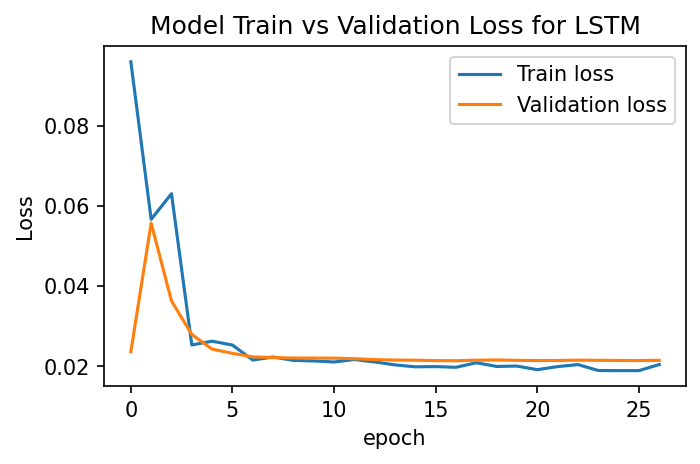

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])
Predicting test data...
Plotting true data and predictions...


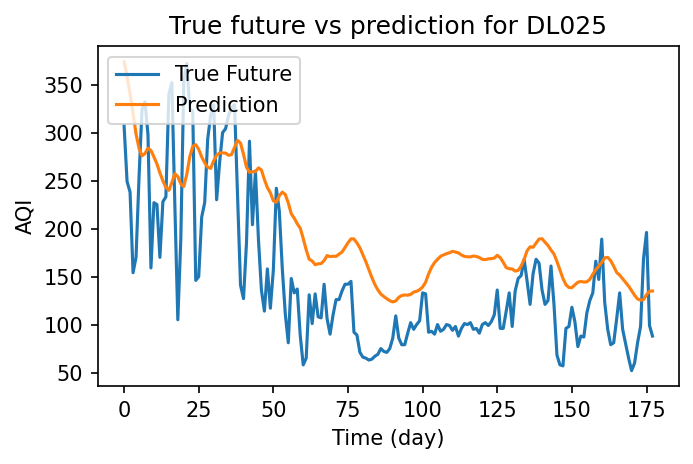

,PM2.5,PM10,NO,NO2,NOx,CO,O3,Benzene,Toluene,Xylene,AQI,Predicted AQI
Date,,,,,,,,,,,,
2020-01-06,123.38,212.30,12.78,32.08,44.86,1.59,5.41,0.0,0.0,0.0,307.0,373.733795
2020-01-07,103.95,168.80,11.96,31.24,43.20,1.34,18.50,0.0,0.0,0.0,249.0,358.516632
2020-01-08,94.18,129.95,11.55,29.82,41.37,1.22,5.48,0.0,0.0,0.0,238.0,340.010529
2020-01-09,63.28,109.54,5.34,26.13,31.47,1.29,6.37,0.0,0.0,0.0,154.0,320.168457
2020-01-10,95.35,161.89,7.40,29.00,36.40,2.70,8.18,0.0,0.0,0.0,170.0,298.660400
2020-01-11,114.32,200.98,19.86,35.63,55.50,2.33,10.37,0.0,0.0,0.0,253.0,283.667023
2020-01-12,163.21,270.85,37.83,43.84,81.67,2.88,8.20,0.0,0.0,0.0,324.0,275.723999
2020-01-13,163.89,267.67,25.60,39.33,64.93,2.32,12.79,0.0,0.0,0.0,332.0,278.201080
2020-01-14,97.00,157.79,6.61,26.31,32.92,1.52,5.02,0.0,0.0,0.0,298.0,283.702698


Evaluating predictions...
LSTM:
Mean Absolute Error: 61.5104
Root Mean Square Error: 70.3203
Coefficient of Determination: 0.1673

Training model for DL026...
Model: "sequential_32"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_64 (LSTM)               (None, 30, 100)           44800     
_________________________________________________________________
dropout_64 (Dropout)         (None, 30, 100)           0         
_________________________________________________________________
lstm_65 (LSTM)               (None, 64)                42240     
_________________________________________________________________
dropout_65 (Dropout)         (None, 64)                0         
_________________________________________________________________
dense_32 (Dense)             (None, 1)                 65        
Total params: 87,105
Trainable params: 87,105
Non-trainable params: 0
______________________

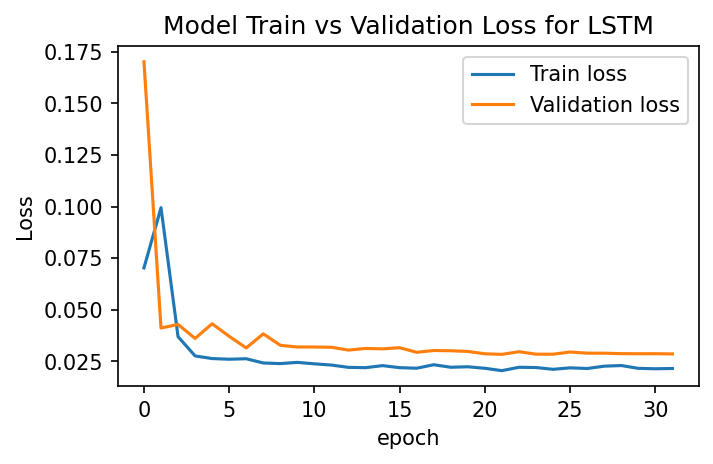

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])
Predicting test data...
Plotting true data and predictions...


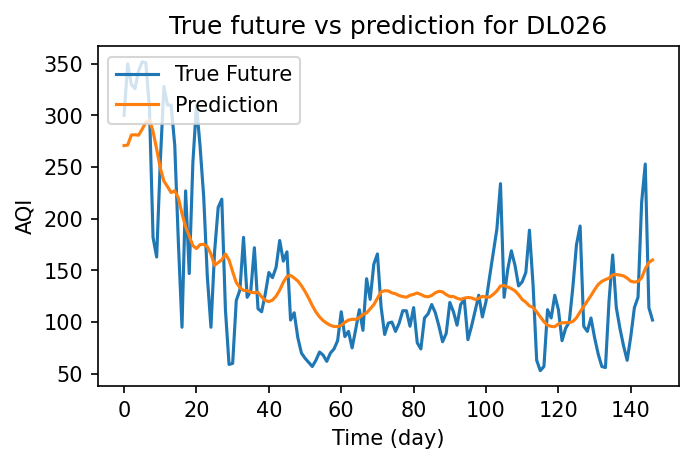

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,AQI,Predicted AQI
Date,,,,,,,,,,,,,
2020-02-06,127.62,208.65,34.53,49.50,54.480,33.38,1.45,13.940000,17.20,3.70,17.200,300.0,270.867981
2020-02-07,197.50,321.19,132.96,62.59,142.720,35.64,2.04,19.840000,23.16,5.54,26.140,350.0,271.387848
2020-02-08,153.67,232.46,28.11,48.03,48.450,33.99,1.41,16.940000,23.31,3.82,14.310,330.0,281.054993
2020-02-09,155.59,240.49,44.28,49.59,62.480,32.98,1.58,16.200000,26.03,4.19,16.020,326.0,281.364227
2020-02-10,191.97,312.82,85.42,61.37,102.340,31.97,2.22,17.880000,23.53,4.67,21.320,343.0,280.905670
2020-02-11,176.77,309.65,66.91,65.79,85.935,35.95,2.46,16.660000,22.90,6.45,32.380,352.0,286.688599
2020-02-12,189.83,307.02,48.40,57.21,69.530,38.75,1.51,18.870000,20.54,4.63,26.400,351.0,293.484344
2020-02-13,102.82,194.67,13.91,42.68,34.040,33.24,0.86,18.150000,24.51,2.26,26.890,308.0,295.574921
2020-02-14,71.50,186.17,8.17,36.13,25.890,30.35,0.78,14.050000,34.80,2.06,27.730,182.0,284.587402


Evaluating predictions...
LSTM:
Mean Absolute Error: 38.6106
Root Mean Square Error: 47.5111
Coefficient of Determination: 0.5753

Training model for DL027...
Model: "sequential_33"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_66 (LSTM)               (None, 30, 100)           44800     
_________________________________________________________________
dropout_66 (Dropout)         (None, 30, 100)           0         
_________________________________________________________________
lstm_67 (LSTM)               (None, 64)                42240     
_________________________________________________________________
dropout_67 (Dropout)         (None, 64)                0         
_________________________________________________________________
dense_33 (Dense)             (None, 1)                 65        
Total params: 87,105
Trainable params: 87,105
Non-trainable params: 0
______________________

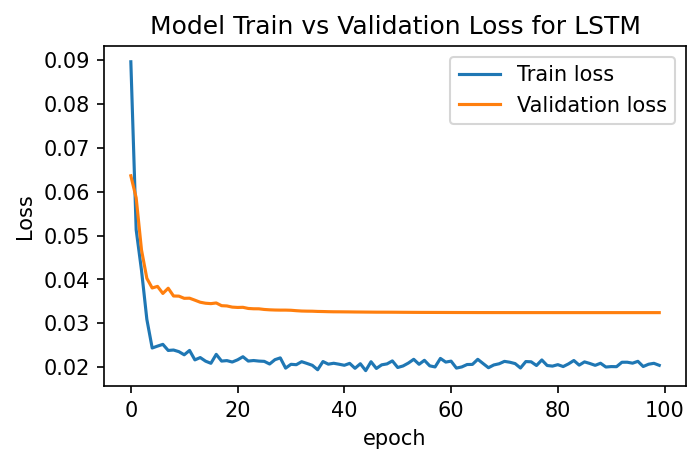

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])
Predicting test data...
Plotting true data and predictions...


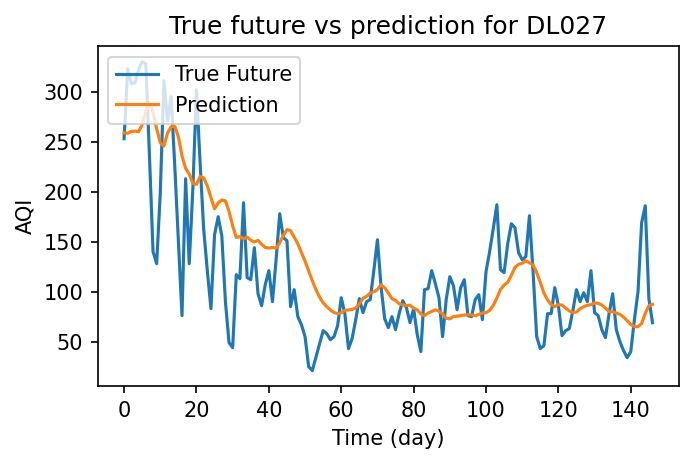

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,AQI,Predicted AQI
Date,,,,,,,,,,,,,
2020-02-06,110.10,186.04,20.070000,23.830,43.900,45.84,0.97,4.23,12.36,0.90,3.03,253.0,259.005615
2020-02-07,151.54,244.97,25.480000,25.610,51.070,46.61,1.17,6.15,17.92,1.07,4.18,323.0,258.468842
2020-02-08,130.43,211.53,25.970000,24.220,50.250,48.27,1.06,4.68,14.65,0.99,3.76,308.0,260.328094
2020-02-09,137.29,224.33,17.890000,25.870,43.750,48.57,1.10,4.95,10.38,0.91,3.20,309.0,260.566650
2020-02-10,153.42,252.05,44.660000,30.590,75.130,49.94,1.54,4.93,12.98,1.15,4.46,322.0,260.021210
2020-02-11,156.85,270.40,63.300000,32.700,98.160,51.73,1.71,5.88,12.83,1.52,7.08,330.0,267.062286
2020-02-12,152.78,259.20,35.710000,31.190,66.830,53.02,1.31,5.66,11.02,1.19,4.55,328.0,280.787292
2020-02-13,77.14,152.48,6.910000,24.610,31.540,47.27,0.72,4.90,16.44,0.74,2.32,237.0,288.438232
2020-02-14,62.06,143.70,3.610000,20.280,23.880,39.42,0.63,5.20,20.59,0.43,1.44,140.0,279.483521


Evaluating predictions...
LSTM:
Mean Absolute Error: 37.0335
Root Mean Square Error: 49.2879
Coefficient of Determination: 0.4957

Training model for DL028...
Model: "sequential_34"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_68 (LSTM)               (None, 30, 100)           44800     
_________________________________________________________________
dropout_68 (Dropout)         (None, 30, 100)           0         
_________________________________________________________________
lstm_69 (LSTM)               (None, 64)                42240     
_________________________________________________________________
dropout_69 (Dropout)         (None, 64)                0         
_________________________________________________________________
dense_34 (Dense)             (None, 1)                 65        
Total params: 87,105
Trainable params: 87,105
Non-trainable params: 0
______________________

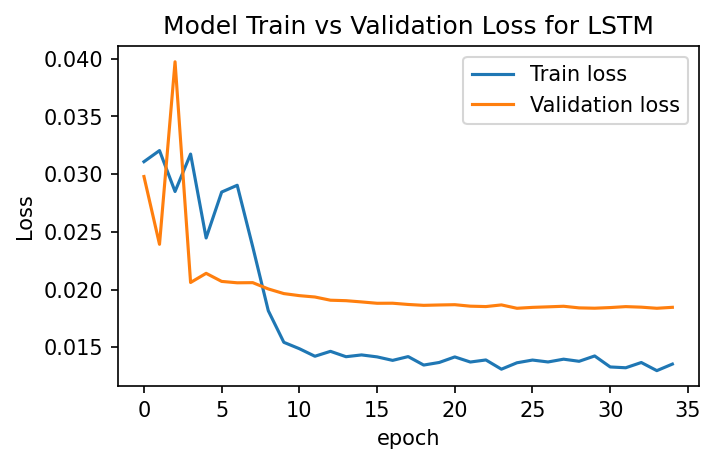

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])
Predicting test data...
Plotting true data and predictions...
20/20 [==============================] - 12s 582ms/step - loss: 0.0262 - accuracy: 0.0016 - val_loss: 0.0358 - val_accuracy: 0.0063
Epoch 7/100
20/20 [==============================] - 11s 574ms/step - loss: 0.0263 - accuracy: 0.0016 - val_loss: 0.0288 - val_accuracy: 0.0063
Epoch 8/100
20/20 [==============================] - 11s 569ms/step - loss: 0.0248 - accuracy: 0.0016 - val_loss: 0.0299 - val_accuracy: 0.0063
Epoch 9/100
20/20 [==============================] - 11s 574ms/step - loss: 0.0252 - accuracy: 0.0016 - val_loss: 0.0299 - val_accuracy: 0.0063
Epoch 10/100
20/20 [==============================] - 11s 566ms/step - loss: 0.0230 - accuracy: 0.0016 - val_loss: 0.0293 - val_accuracy: 0.0063
Epoch 11/100
20/20 [==============================] - 11s 562ms/step - loss: 0.0225 - accuracy: 0.0016 - val_loss: 0.0282 - val_accuracy: 0.0063
Epoch 12/100
20/20

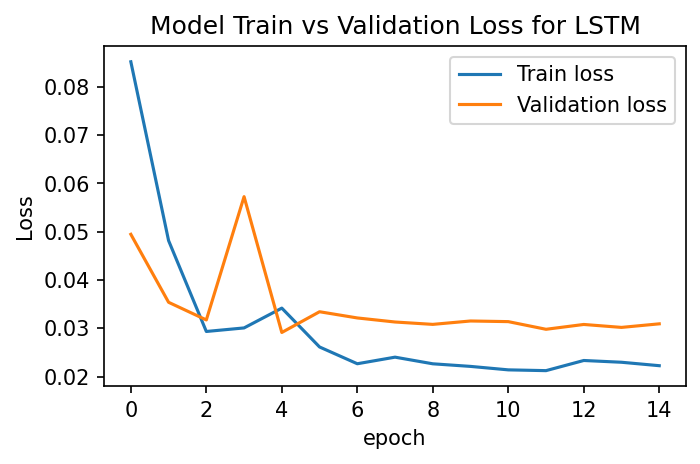

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])
Predicting test data...
Plotting true data and predictions...


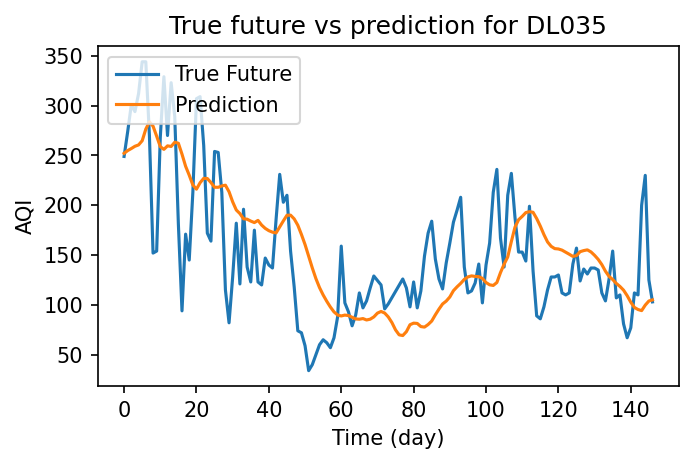

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,AQI,Predicted AQI
Date,,,,,,,,,,,,
2020-02-06,98.75,187.38,21.890,45.69,42.150,54.250000,1.05,9.160,52.04,1.13,249.0,252.127914
2020-02-07,112.46,204.38,34.010,40.08,49.050,52.370000,1.08,7.840,51.51,1.37,274.0,254.884552
2020-02-08,136.62,236.75,25.050,43.47,43.550,59.600000,1.10,11.380,58.58,1.54,301.0,256.931213
2020-02-09,117.33,202.00,30.410,44.61,48.520,56.720000,1.09,10.160,59.22,1.28,294.0,259.195251
2020-02-10,147.65,254.39,41.330,52.05,61.380,60.750000,1.29,16.010,53.01,1.35,312.0,260.542236
2020-02-11,186.54,315.00,70.510,56.40,87.490,60.930000,1.42,12.390,60.42,1.85,344.0,264.751465
2020-02-12,165.88,289.83,41.210,48.33,59.300,66.440000,1.32,15.850,62.24,1.85,344.0,276.398193
2020-02-13,90.33,164.12,5.660,40.66,26.230,56.320000,0.88,14.550,59.29,1.19,270.0,283.737183
2020-02-14,65.38,163.96,3.640,30.47,19.170,52.830000,0.70,12.050,73.81,0.73,152.0,279.386993


Evaluating predictions...
LSTM:
Mean Absolute Error: 44.0880
Root Mean Square Error: 55.3366
Coefficient of Determination: 0.3198

Training model for DL036...
Model: "sequential_42"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_84 (LSTM)               (None, 30, 100)           44800     
_________________________________________________________________
dropout_84 (Dropout)         (None, 30, 100)           0         
_________________________________________________________________
lstm_85 (LSTM)               (None, 64)                42240     
_________________________________________________________________
dropout_85 (Dropout)         (None, 64)                0         
_________________________________________________________________
dense_42 (Dense)             (None, 1)                 65        
Total params: 87,105
Trainable params: 87,105
Non-trainable params: 0
______________________

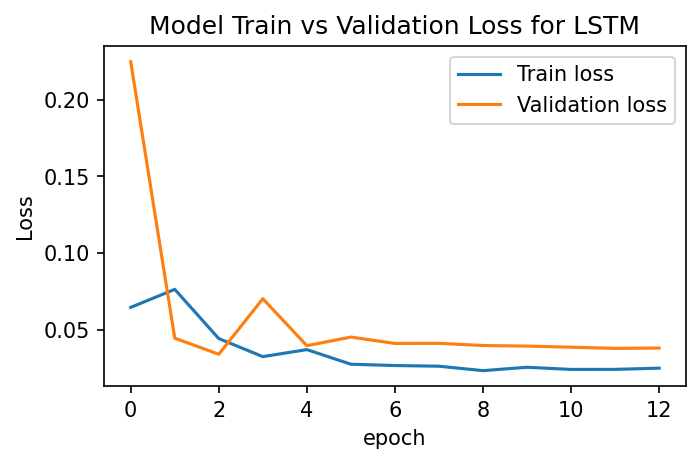

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])
Predicting test data...
Plotting true data and predictions...


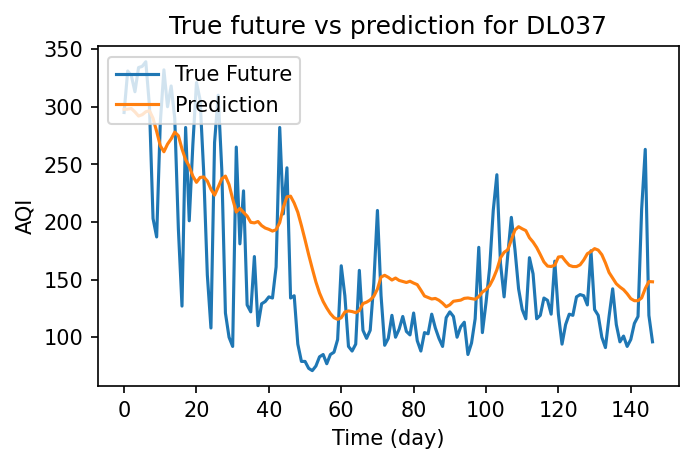

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,AQI,Predicted AQI
Date,,,,,,,,,,,,,
2020-02-06,130.54,211.04,15.88,58.170,43.890,35.02,1.65,15.63,27.11,4.24,17.33,295.0,297.782898
2020-02-07,158.69,262.35,24.41,63.970,53.940,33.72,1.62,22.39,28.62,4.70,19.62,331.0,297.917725
2020-02-08,151.27,236.17,11.16,53.550,37.580,33.95,1.54,19.67,25.29,4.67,18.99,327.0,298.439545
2020-02-09,143.40,235.46,14.35,59.050,43.110,32.74,1.55,17.12,19.37,4.05,19.31,313.0,295.486938
2020-02-10,170.48,284.75,25.06,68.740,56.990,35.33,2.03,19.95,17.06,4.99,22.46,334.0,291.917175
2020-02-11,158.75,264.75,32.62,66.565,63.510,32.73,1.29,18.75,15.66,5.55,30.53,335.0,293.065918
2020-02-12,176.45,310.74,11.81,64.390,43.890,35.31,1.08,18.78,34.53,5.14,24.67,339.0,295.625488
2020-02-13,105.29,208.11,5.72,47.080,29.700,33.69,0.83,17.37,41.48,4.23,18.77,301.0,296.596985
2020-02-14,74.50,237.97,4.52,39.460,24.680,29.01,0.53,16.39,48.20,2.68,14.62,203.0,289.933075


Evaluating predictions...
LSTM:
Mean Absolute Error: 46.1059
Root Mean Square Error: 55.0095
Coefficient of Determination: 0.4314

Training model for DL038...
Model: "sequential_44"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_88 (LSTM)               (None, 30, 100)           44800     
_________________________________________________________________
dropout_88 (Dropout)         (None, 30, 100)           0         
_________________________________________________________________
lstm_89 (LSTM)               (None, 64)                42240     
_________________________________________________________________
dropout_89 (Dropout)         (None, 64)                0         
_________________________________________________________________
dense_44 (Dense)             (None, 1)                 65        
Total params: 87,105
Trainable params: 87,105
Non-trainable params: 0
______________________

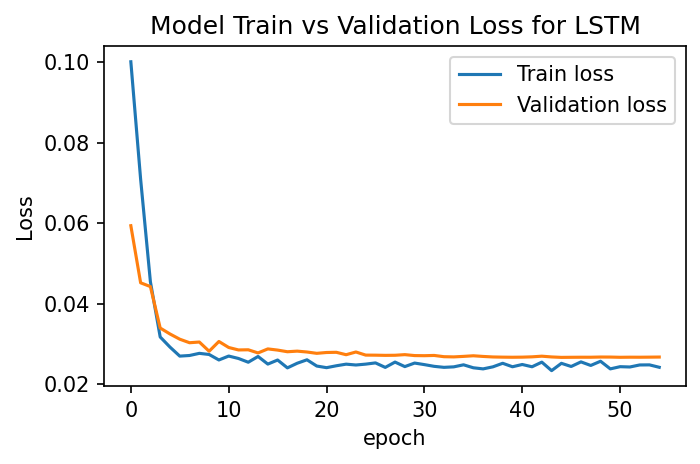

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])
Predicting test data...
Plotting true data and predictions...


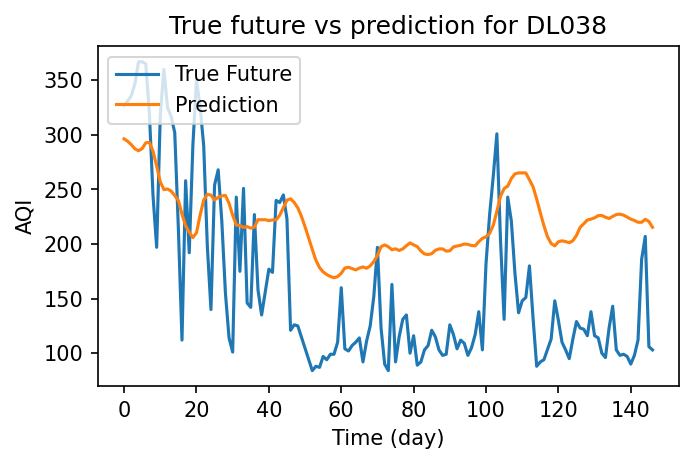

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,AQI,Predicted AQI
Date,,,,,,,,,,,,,
2020-02-06,152.30,255.78,23.04,51.04,45.93,39.21,1.99,8.58,6.64,3.79,58.58,327.0,296.386475
2020-02-07,157.66,277.71,53.20,57.09,73.62,39.06,2.11,8.09,6.90,4.76,41.38,331.0,294.130341
2020-02-08,176.51,262.51,44.70,56.82,66.67,37.97,2.08,7.17,5.74,3.80,28.16,336.0,291.042053
2020-02-09,191.26,292.53,47.25,55.93,68.31,37.08,2.22,7.19,5.70,4.40,34.75,347.0,287.245148
2020-02-10,209.79,344.92,46.40,58.26,68.80,35.50,2.14,8.45,5.86,4.71,46.81,367.0,285.498779
2020-02-11,204.23,372.88,87.03,60.35,103.12,39.25,2.35,8.77,6.57,7.24,58.68,367.0,287.518158
2020-02-12,199.46,326.40,36.52,63.98,63.80,51.43,1.41,7.70,7.55,4.46,38.54,365.0,292.785339
2020-02-13,115.10,228.17,26.35,61.43,54.19,55.06,1.32,7.26,6.34,3.76,49.42,319.0,293.094910
2020-02-14,93.19,227.50,13.97,54.62,40.45,49.66,1.17,6.70,6.27,2.91,41.78,244.0,285.005493


Evaluating predictions...
LSTM:
Mean Absolute Error: 78.3341
Root Mean Square Error: 85.5634
Coefficient of Determination: -0.1956

Training model for GJ001...
Model: "sequential_45"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_90 (LSTM)               (None, 30, 100)           44800     
_________________________________________________________________
dropout_90 (Dropout)         (None, 30, 100)           0         
_________________________________________________________________
lstm_91 (LSTM)               (None, 64)                42240     
_________________________________________________________________
dropout_91 (Dropout)         (None, 64)                0         
_________________________________________________________________
dense_45 (Dense)             (None, 1)                 65        
Total params: 87,105
Trainable params: 87,105
Non-trainable params: 0
_____________________

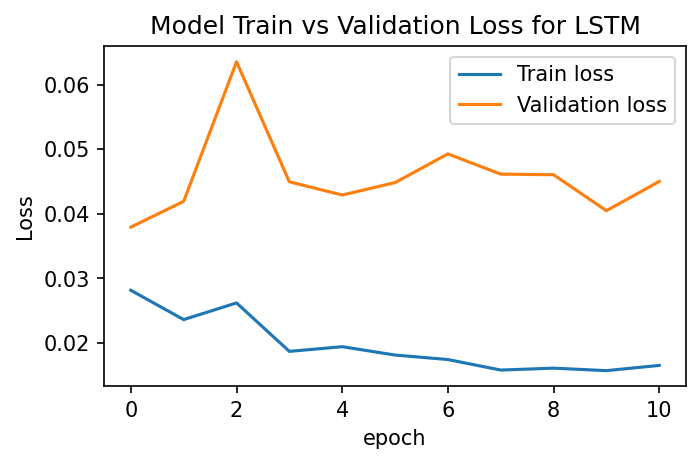

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])
Predicting test data...
Plotting true data and predictions...


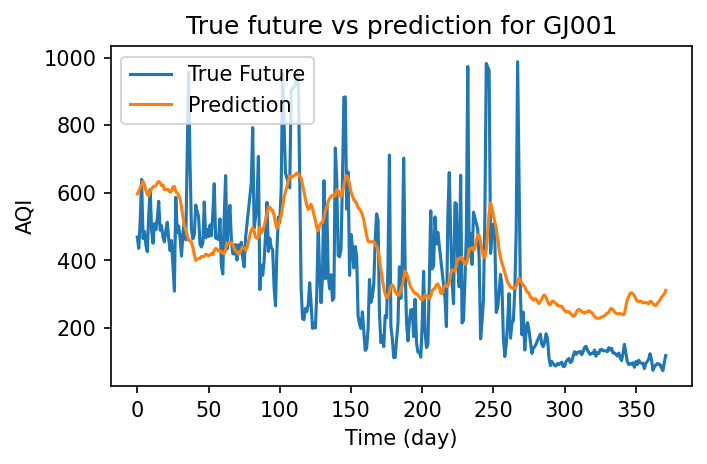

,PM2.5,PM10,NO,NO2,NOx,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,Predicted AQI
Date,,,,,,,,,,,,,
2019-06-26,70.03,136.54,24.95,129.968571,109.496667,24.95,28.94,52.14,6.30,80.04,1.48,469.0,596.994080
2019-06-27,60.03,109.40,25.55,124.441429,111.943333,25.55,35.87,52.95,6.30,80.04,1.48,436.0,606.103821
2019-06-28,49.43,102.77,29.88,118.914286,114.390000,29.88,44.06,31.31,6.30,80.04,1.48,517.0,614.119202
2019-06-29,59.63,112.50,41.59,113.387143,99.380000,41.59,38.49,21.31,6.30,80.04,1.48,640.0,624.577393
2019-06-30,53.13,117.30,29.06,107.860000,84.370000,29.06,30.43,43.43,6.23,79.21,1.46,465.0,634.380676
2019-07-01,43.22,104.74,28.45,113.685000,86.575000,28.45,40.42,69.91,6.23,79.21,1.46,486.0,623.199768
2019-07-02,44.75,114.84,24.72,119.510000,88.780000,24.72,48.21,58.82,6.30,80.04,1.48,446.0,607.834412
2019-07-03,44.27,96.61,24.13,118.730000,95.730000,24.13,47.13,49.16,6.30,80.04,1.48,426.0,595.899536
2019-07-04,47.77,102.68,39.11,144.030000,94.915000,39.11,44.80,21.77,6.30,80.04,1.48,534.0,591.753906


Evaluating predictions...
LSTM:
Mean Absolute Error: 145.1786
Root Mean Square Error: 174.5992
Coefficient of Determination: 0.3425

Training model for HR011...
Model: "sequential_46"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_92 (LSTM)               (None, 30, 100)           43200     
_________________________________________________________________
dropout_92 (Dropout)         (None, 30, 100)           0         
_________________________________________________________________
lstm_93 (LSTM)               (None, 64)                42240     
_________________________________________________________________
dropout_93 (Dropout)         (None, 64)                0         
_________________________________________________________________
dense_46 (Dense)             (None, 1)                 65        
Total params: 85,505
Trainable params: 85,505
Non-trainable params: 0
____________________

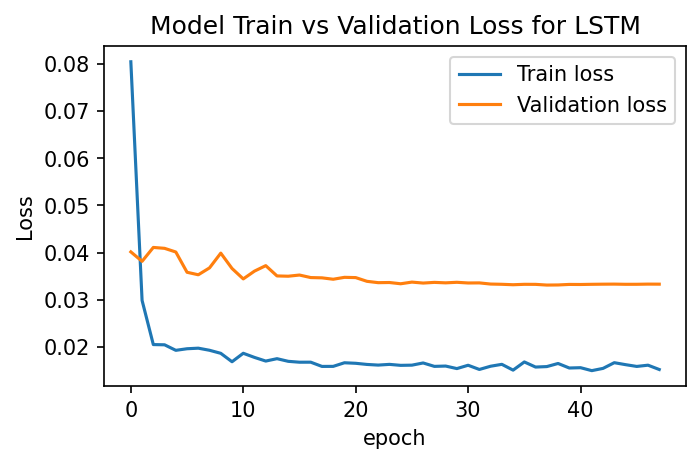

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])
Predicting test data...
Plotting true data and predictions...


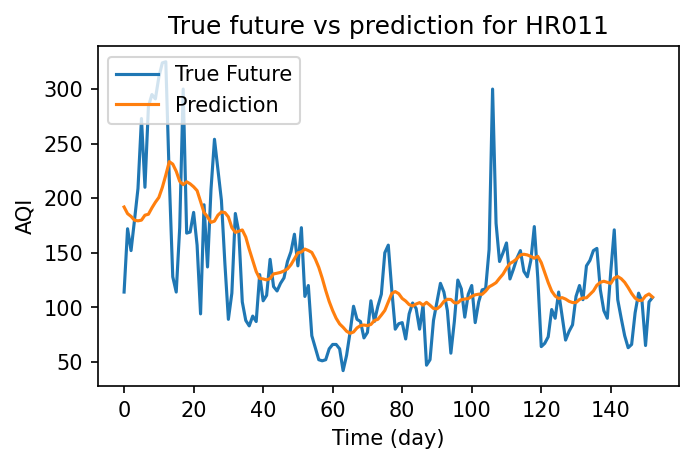

,PM2.5,PM10,NO,NO2,NOx,CO,O3,AQI,Predicted AQI
Date,,,,,,,,,
2020-01-31,67.68,127.12,9.89,14.95,24.84,1.89,6.16,114.0,191.924622
2020-02-01,83.54,162.58,21.64,18.81,40.46,2.39,6.15,172.0,185.848602
2020-02-02,74.47,137.94,9.80,12.50,22.31,1.82,6.12,152.0,183.312912
2020-02-03,89.46,182.76,10.13,14.92,25.04,1.74,6.35,180.0,179.816437
2020-02-04,94.39,181.95,6.65,8.90,15.55,1.20,6.31,209.0,179.269562
2020-02-05,118.00,228.69,8.04,7.68,15.71,1.63,24.76,273.0,179.881790
2020-02-06,88.37,169.37,7.10,8.83,15.93,1.14,32.60,210.0,184.444016
2020-02-07,134.13,230.34,12.24,10.75,22.99,1.55,34.76,284.0,185.286484
2020-02-08,120.82,210.84,7.29,8.79,16.08,1.04,39.39,295.0,191.101929


Evaluating predictions...
LSTM:
Mean Absolute Error: 33.4422
Root Mean Square Error: 45.6130
Coefficient of Determination: 0.4076

Training model for HR014...
Model: "sequential_47"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_94 (LSTM)               (None, 30, 100)           44000     
_________________________________________________________________
dropout_94 (Dropout)         (None, 30, 100)           0         
_________________________________________________________________
lstm_95 (LSTM)               (None, 64)                42240     
_________________________________________________________________
dropout_95 (Dropout)         (None, 64)                0         
_________________________________________________________________
dense_47 (Dense)             (None, 1)                 65        
Total params: 86,305
Trainable params: 86,305
Non-trainable params: 0
______________________

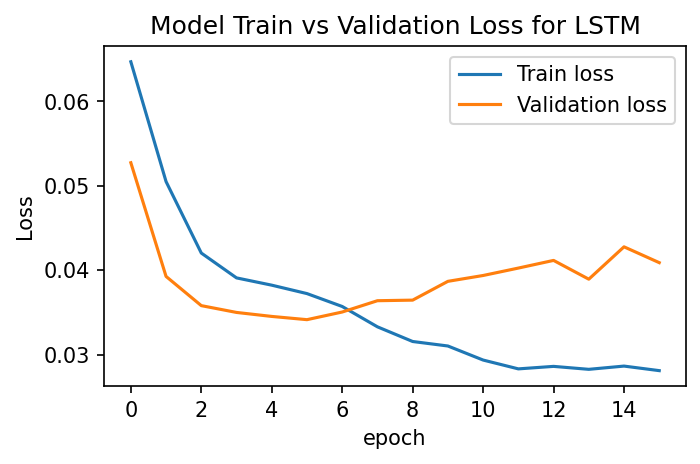

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])
Predicting test data...
Plotting true data and predictions...


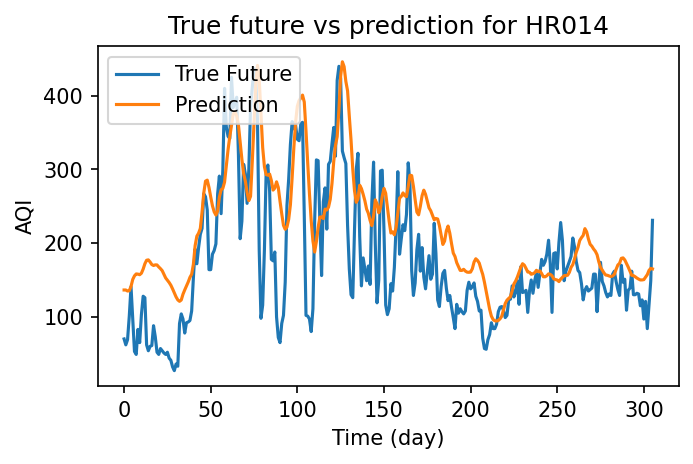

,PM2.5,NO,NO2,NOx,CO,SO2,O3,Benzene,Toluene,AQI,Predicted AQI
Date,,,,,,,,,,,
2019-08-31,41.31,7.47,4.89,11.62,0.33,17.93,39.25,2.00,5.98,70.0,136.440475
2019-09-01,22.50,8.53,4.91,12.45,0.30,14.93,34.15,1.99,6.00,62.0,136.425583
2019-09-02,37.63,7.23,5.11,11.56,0.37,15.27,40.61,2.00,6.01,69.0,134.999146
2019-09-03,66.78,7.22,5.09,11.55,0.29,15.04,40.72,2.00,6.02,101.0,135.479706
2019-09-04,75.09,7.23,5.11,11.56,0.31,16.12,40.54,2.00,5.99,141.0,141.288101
2019-09-05,29.70,7.24,5.11,11.55,0.30,15.59,32.21,2.01,6.02,96.0,150.801910
2019-09-06,31.20,7.69,5.29,11.88,0.33,16.36,27.36,2.00,6.02,53.0,155.636108
2019-09-07,25.05,7.24,5.16,11.59,0.31,13.01,25.01,1.99,6.01,49.0,158.229279
2019-09-08,25.30,7.20,5.11,11.53,0.31,15.01,38.29,2.00,6.00,83.0,157.980942


Evaluating predictions...
LSTM:
Mean Absolute Error: 60.2883
Root Mean Square Error: 77.5136
Coefficient of Determination: 0.2816

Training model for JH001...
Model: "sequential_48"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_96 (LSTM)               (None, 30, 100)           43600     
_________________________________________________________________
dropout_96 (Dropout)         (None, 30, 100)           0         
_________________________________________________________________
lstm_97 (LSTM)               (None, 64)                42240     
_________________________________________________________________
dropout_97 (Dropout)         (None, 64)                0         
_________________________________________________________________
dense_48 (Dense)             (None, 1)                 65        
Total params: 85,905
Trainable params: 85,905
Non-trainable params: 0
______________________

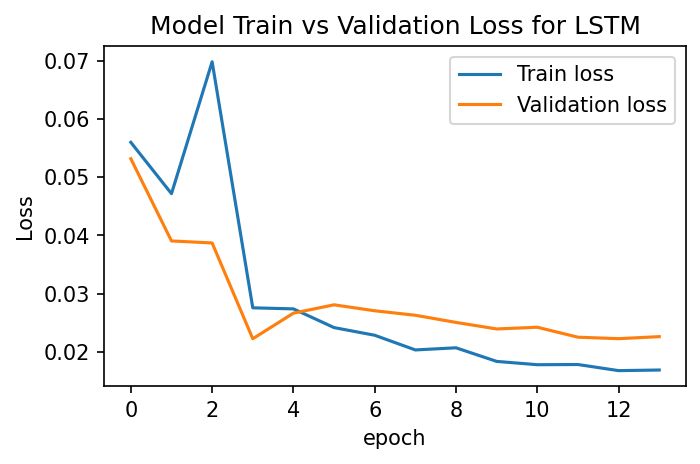

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])
Predicting test data...
Plotting true data and predictions...


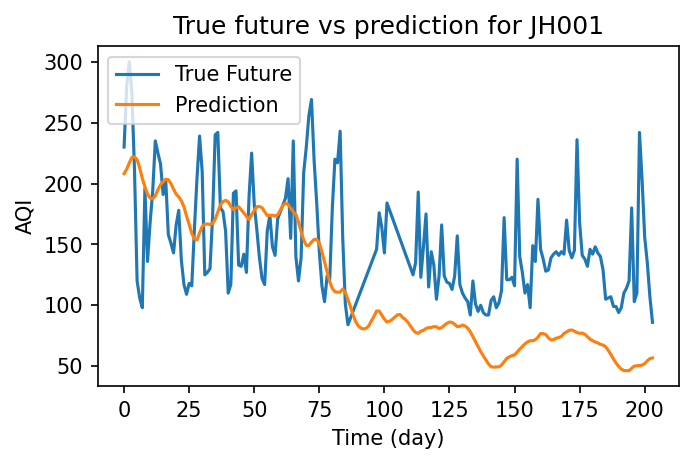

,PM2.5,PM10,NO,NO2,NH3,CO,SO2,O3,AQI,Predicted AQI
Date,,,,,,,,,,
2019-12-11,105.640,233.43,8.59,9.53,6.35,1.298586,31.05,74.70,230.0,208.142822
2019-12-12,114.610,245.40,8.54,9.57,6.35,1.301152,37.55,75.40,280.0,211.737442
2019-12-13,105.670,256.39,8.57,9.66,6.35,1.303717,36.83,58.09,300.0,216.950195
2019-12-14,96.730,182.45,8.50,9.53,6.34,1.306283,25.75,42.72,274.0,221.458878
2019-12-15,79.290,169.59,8.60,8.89,6.39,1.308848,29.42,48.00,211.0,221.886124
2019-12-16,56.640,107.38,8.44,8.84,6.43,1.311414,27.11,46.41,120.0,219.541702
2019-12-17,60.750,95.36,8.25,8.58,6.36,1.313979,20.65,50.44,106.0,212.768234
2019-12-18,62.145,149.78,8.42,8.90,6.39,1.316545,24.45,57.90,98.0,204.258331
2019-12-19,63.540,139.30,8.49,9.01,6.36,1.319110,23.06,53.33,196.0,197.376984


Evaluating predictions...
LSTM:
Mean Absolute Error: 52.1165
Root Mean Square Error: 61.2422
Coefficient of Determination: -0.9843

Training model for KA002...
Model: "sequential_49"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_98 (LSTM)               (None, 30, 100)           44000     
_________________________________________________________________
dropout_98 (Dropout)         (None, 30, 100)           0         
_________________________________________________________________
lstm_99 (LSTM)               (None, 64)                42240     
_________________________________________________________________
dropout_99 (Dropout)         (None, 64)                0         
_________________________________________________________________
dense_49 (Dense)             (None, 1)                 65        
Total params: 86,305
Trainable params: 86,305
Non-trainable params: 0
_____________________

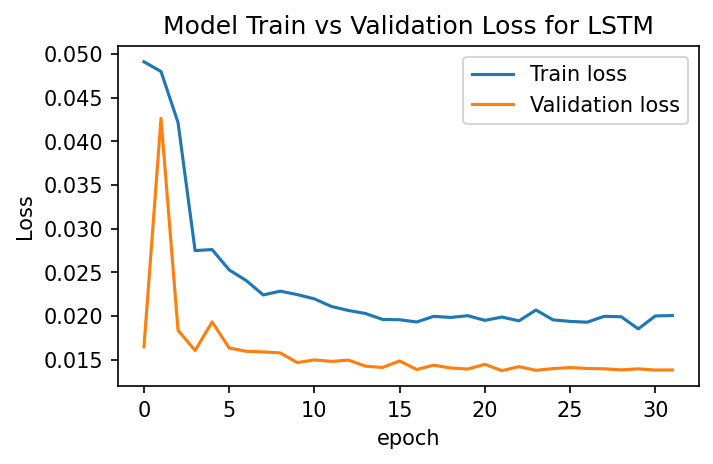

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])
Predicting test data...
Plotting true data and predictions...


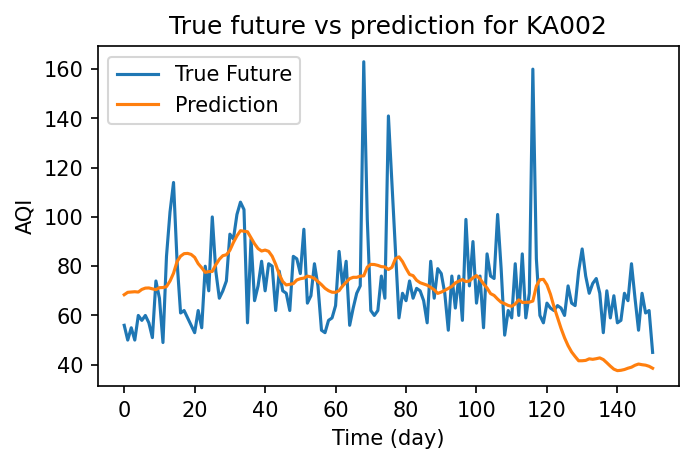

,PM2.5,NO,NO2,NOx,CO,SO2,O3,Benzene,Toluene,AQI,Predicted AQI
Date,,,,,,,,,,,
2020-02-02,25.59,3.66,21.98,25.530000,0.72,3.24,40.55,0.72,0.9,56.0,68.417221
2020-02-03,24.94,3.84,28.62,31.730000,0.68,8.38,32.63,0.72,0.9,50.0,69.393440
2020-02-04,23.76,3.86,25.35,29.150000,0.70,2.79,31.49,0.72,0.9,55.0,69.526749
2020-02-05,25.46,6.10,32.11,37.440000,0.64,7.06,30.89,0.72,0.9,50.0,69.633499
2020-02-06,37.80,4.55,33.65,38.070000,0.71,4.23,36.23,0.56,0.7,60.0,69.497429
2020-02-07,36.27,3.97,31.57,35.530000,0.66,6.54,34.67,0.00,0.0,58.0,70.567711
2020-02-08,29.37,4.02,31.92,35.940000,0.63,2.18,32.14,0.00,0.0,60.0,71.102104
2020-02-09,27.30,3.76,25.51,29.270000,0.72,7.75,35.34,0.00,0.0,57.0,71.168663
2020-02-10,23.05,3.64,20.48,24.110000,0.69,4.20,40.52,0.00,0.0,51.0,70.798058


Evaluating predictions...
LSTM:
Mean Absolute Error: 15.6626
Root Mean Square Error: 20.8073
Coefficient of Determination: -0.3403

Training model for KA003...
Model: "sequential_50"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_100 (LSTM)              (None, 30, 100)           44000     
_________________________________________________________________
dropout_100 (Dropout)        (None, 30, 100)           0         
_________________________________________________________________
lstm_101 (LSTM)              (None, 64)                42240     
_________________________________________________________________
dropout_101 (Dropout)        (None, 64)                0         
_________________________________________________________________
dense_50 (Dense)             (None, 1)                 65        
Total params: 86,305
Trainable params: 86,305
Non-trainable params: 0
_____________________

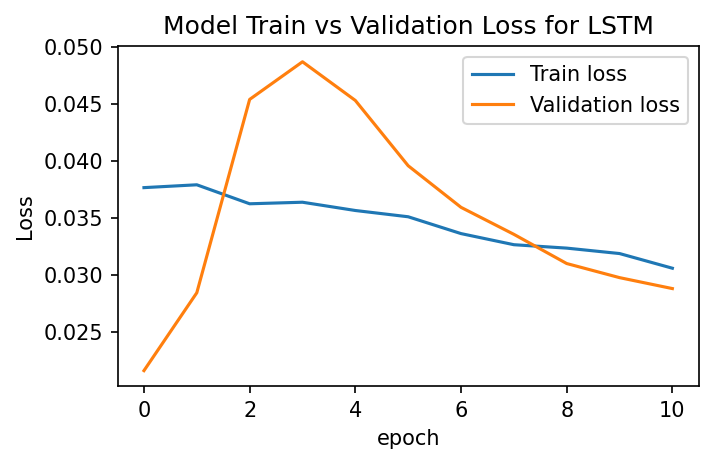

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])
Predicting test data...
Plotting true data and predictions...


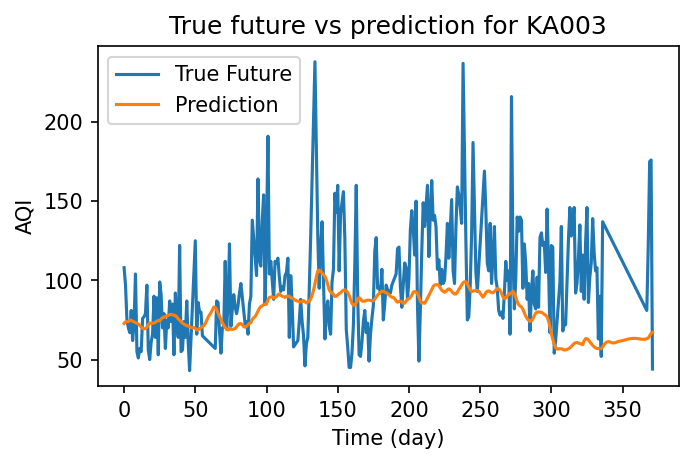

,PM2.5,NO,NO2,NOx,CO,SO2,O3,Benzene,Toluene,AQI,Predicted AQI
Date,,,,,,,,,,,
2019-06-26,68.22,6.50,18.27,23.26,1.11,4.02,6.290000,2.55,5.67,108.0,72.748978
2019-06-27,23.80,7.85,15.30,23.12,0.93,5.36,6.570000,1.78,4.31,97.0,73.782761
2019-06-28,28.71,5.43,22.05,27.47,0.83,5.40,5.890000,1.40,2.73,75.0,73.935692
2019-06-29,34.61,4.56,44.89,49.21,0.88,5.13,9.370000,1.27,2.12,70.0,73.905693
2019-06-30,24.06,3.04,13.87,16.85,0.80,5.45,12.010000,0.86,1.80,67.0,74.899231
2019-07-01,33.00,3.38,15.96,18.80,1.08,3.45,7.780000,0.94,1.67,81.0,74.765945
2019-07-02,23.72,8.89,27.82,36.70,0.88,4.98,5.390000,1.07,2.07,62.0,74.193909
2019-07-03,24.78,6.90,21.13,28.01,0.79,5.12,6.580000,1.02,2.06,73.0,73.767708
2019-07-04,27.68,4.43,26.49,22.57,1.51,3.79,8.560000,0.78,1.85,104.0,73.297729


Evaluating predictions...
LSTM:
Mean Absolute Error: 29.6443
Root Mean Square Error: 38.7200
Coefficient of Determination: -0.4009

Training model for KA004...
Model: "sequential_51"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_102 (LSTM)              (None, 30, 100)           44800     
_________________________________________________________________
dropout_102 (Dropout)        (None, 30, 100)           0         
_________________________________________________________________
lstm_103 (LSTM)              (None, 64)                42240     
_________________________________________________________________
dropout_103 (Dropout)        (None, 64)                0         
_________________________________________________________________
dense_51 (Dense)             (None, 1)                 65        
Total params: 87,105
Trainable params: 87,105
Non-trainable params: 0
_____________________

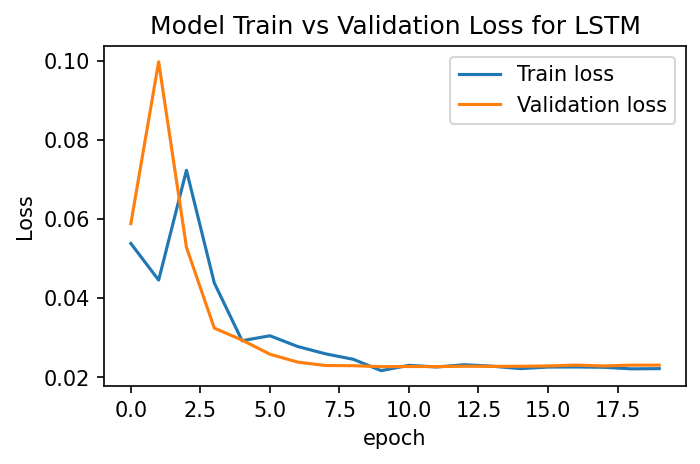

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])
Predicting test data...
Plotting true data and predictions...


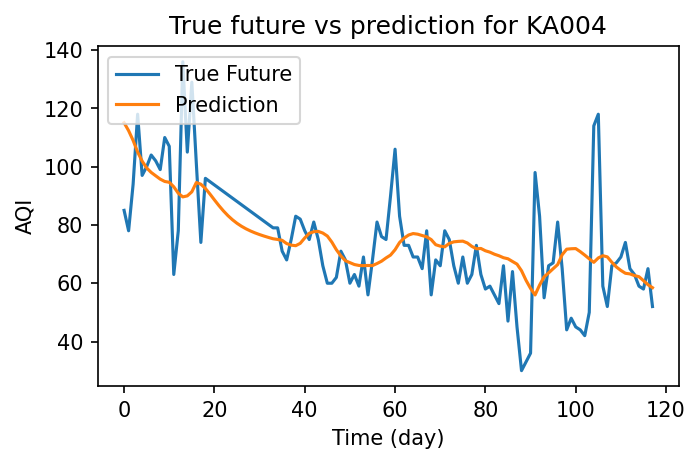

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,AQI,Predicted AQI
Date,,,,,,,,,,,,,
2020-03-06,34.620,65.620000,3.020,25.130000,15.82,12.750000,0.530000,11.735000,56.750,1.140,13.510000,85.000000,115.071571
2020-03-07,39.060,68.920000,2.720,25.780000,15.92,12.680000,0.550000,11.230000,47.170,1.200,0.460000,78.000000,112.357506
2020-03-08,34.180,61.600000,1.970,20.430000,12.48,10.880000,0.640000,8.580000,50.160,0.960,1.730000,94.000000,108.997894
2020-03-09,35.990,67.780000,3.250,25.500000,16.21,9.730000,0.640000,10.210000,58.400,1.230,0.560000,118.000000,105.017738
2020-03-10,37.790,70.520000,1.980,21.390000,13.00,9.840000,0.540000,10.250000,64.760,1.070,6.930000,97.000000,101.912437
2020-03-11,30.740,67.660000,2.450,21.860000,13.62,7.360000,0.600000,12.760000,70.400,1.190,5.390000,100.000000,99.561081
2020-03-12,30.780,75.030000,4.470,28.580000,18.84,8.000000,0.520000,9.240000,62.420,1.680,2.860000,104.000000,98.026070
2020-03-13,29.020,67.880000,4.920,25.730000,17.68,7.660000,0.540000,9.040000,62.400,1.370,4.490000,102.000000,96.867264
2020-03-14,27.360,70.320000,7.020,25.900000,19.48,7.510000,0.720000,8.840000,56.110,1.410,20.210000,99.000000,95.725464


Evaluating predictions...
LSTM:
Mean Absolute Error: 11.5089
Root Mean Square Error: 15.7718
Coefficient of Determination: 0.3455

Training model for KA005...
Model: "sequential_52"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_104 (LSTM)              (None, 30, 100)           42800     
_________________________________________________________________
dropout_104 (Dropout)        (None, 30, 100)           0         
_________________________________________________________________
lstm_105 (LSTM)              (None, 64)                42240     
_________________________________________________________________
dropout_105 (Dropout)        (None, 64)                0         
_________________________________________________________________
dense_52 (Dense)             (None, 1)                 65        
Total params: 85,105
Trainable params: 85,105
Non-trainable params: 0
______________________

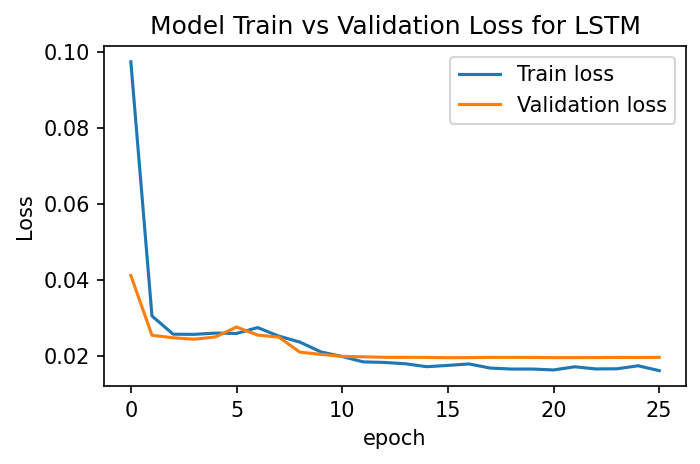

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])
Predicting test data...
Plotting true data and predictions...


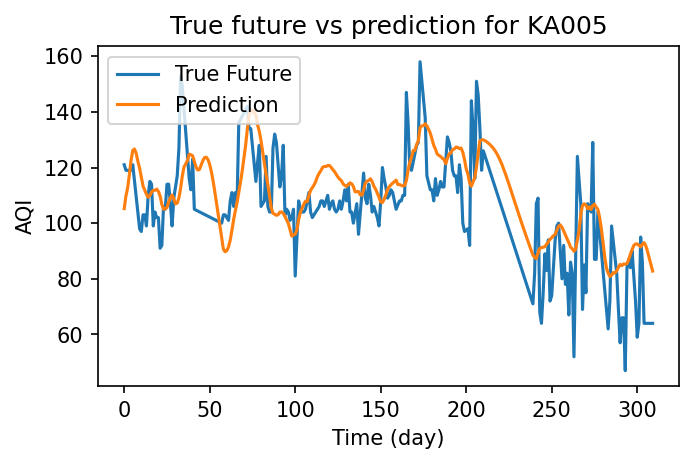

,PM10,NO,NO2,NOx,CO,SO2,AQI,Predicted AQI
Date,,,,,,,,
2019-08-27,122.450,17.33,41.790,59.090,1.65,8.35,121.00,105.223175
2019-08-28,110.090,14.61,32.250,46.870,1.36,8.01,119.00,109.766541
2019-08-29,163.570,16.22,46.400,62.620,1.69,8.80,119.00,112.633926
2019-08-30,159.340,19.19,50.480,69.670,1.82,8.48,119.00,117.343048
2019-08-31,132.680,19.87,44.640,64.510,1.59,8.80,119.00,122.599037
2019-09-01,96.790,19.12,39.460,58.590,1.44,8.89,121.00,126.150742
2019-09-02,93.695,15.55,35.320,50.875,1.47,8.86,115.25,126.638428
2019-09-03,90.600,11.98,31.180,43.160,1.50,8.83,109.50,125.095337
2019-09-04,94.290,18.86,41.530,60.390,1.68,9.18,103.75,122.199532


Evaluating predictions...
LSTM:
Mean Absolute Error: 11.9904
Root Mean Square Error: 14.5790
Coefficient of Determination: 0.4205

Training model for KA006...
Model: "sequential_53"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_106 (LSTM)              (None, 30, 100)           43600     
_________________________________________________________________
dropout_106 (Dropout)        (None, 30, 100)           0         
_________________________________________________________________
lstm_107 (LSTM)              (None, 64)                42240     
_________________________________________________________________
dropout_107 (Dropout)        (None, 64)                0         
_________________________________________________________________
dense_53 (Dense)             (None, 1)                 65        
Total params: 85,905
Trainable params: 85,905
Non-trainable params: 0
______________________

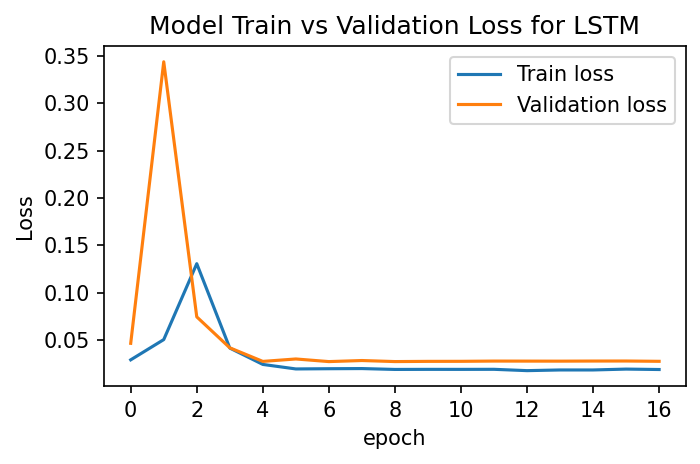

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])
Predicting test data...
Plotting true data and predictions...


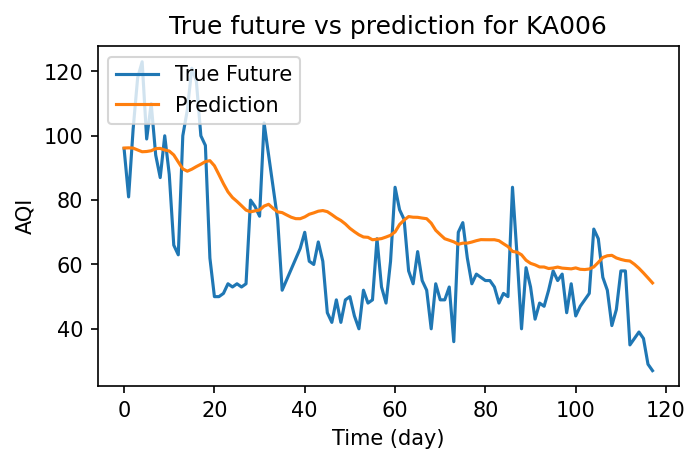

,PM2.5,PM10,NO2,NH3,CO,SO2,O3,Benzene,AQI,Predicted AQI
Date,,,,,,,,,,
2020-03-06,28.61,70.69,5.19,3.25,0.59,6.64,64.56,0.21,96.0,96.189415
2020-03-07,36.88,85.62,9.44,3.63,0.79,8.45,39.09,0.29,81.0,96.249146
2020-03-08,34.29,87.83,8.21,3.49,0.50,9.65,48.32,0.25,102.0,96.173355
2020-03-09,34.71,85.92,8.30,3.36,0.58,8.73,54.15,0.27,118.0,95.590897
2020-03-10,38.83,95.96,8.73,3.09,0.72,9.86,59.42,0.26,123.0,95.035461
2020-03-11,36.50,86.17,9.23,2.87,0.72,9.73,57.77,0.29,99.0,95.112335
2020-03-12,28.17,79.67,9.47,2.78,1.14,9.09,60.02,0.29,110.0,95.352982
2020-03-13,29.42,85.17,10.54,3.07,0.71,11.71,43.66,0.28,94.0,96.006737
2020-03-14,22.60,73.43,9.64,3.07,0.79,9.79,41.78,0.28,87.0,96.076958


Evaluating predictions...
LSTM:
Mean Absolute Error: 15.6111
Root Mean Square Error: 18.3560
Coefficient of Determination: 0.2233

Training model for KA007...
Model: "sequential_54"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_108 (LSTM)              (None, 30, 100)           44800     
_________________________________________________________________
dropout_108 (Dropout)        (None, 30, 100)           0         
_________________________________________________________________
lstm_109 (LSTM)              (None, 64)                42240     
_________________________________________________________________
dropout_109 (Dropout)        (None, 64)                0         
_________________________________________________________________
dense_54 (Dense)             (None, 1)                 65        
Total params: 87,105
Trainable params: 87,105
Non-trainable params: 0
______________________

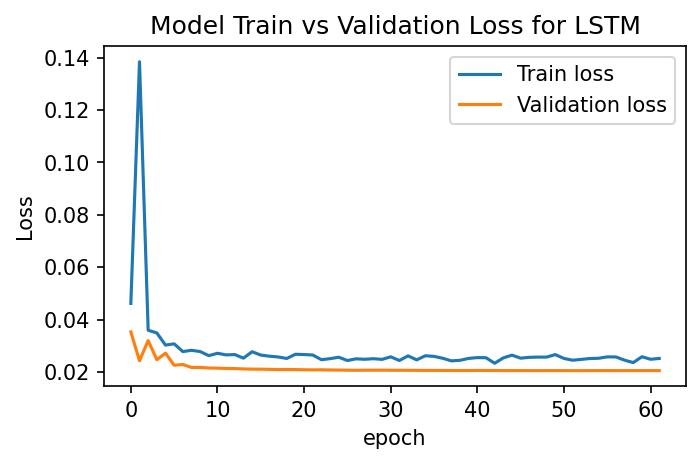

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])
Predicting test data...
Plotting true data and predictions...


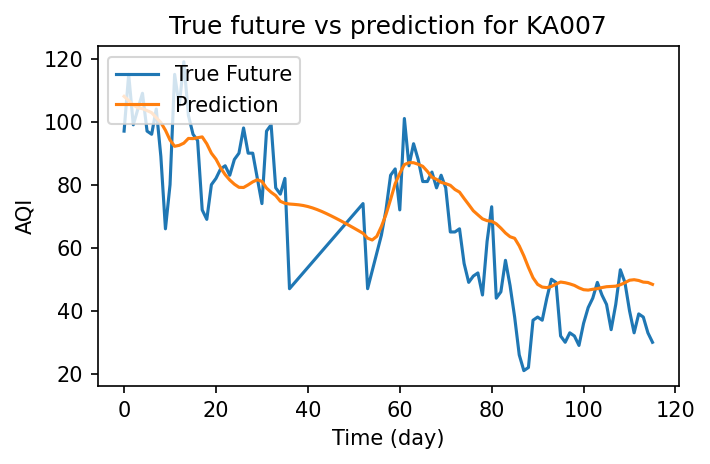

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,AQI,Predicted AQI
Date,,,,,,,,,,,,,
2020-03-08,38.08,78.41,0.73,14.94,8.55,24.47,1.19,10.65,64.51,0.17,1.28,97.0,108.031906
2020-03-09,38.49,77.57,0.75,16.13,9.18,24.19,1.04,10.01,72.39,0.19,1.36,115.0,106.673157
2020-03-10,41.20,80.07,0.76,15.03,8.61,23.95,1.36,11.47,74.83,0.18,1.45,99.0,105.275055
2020-03-11,35.74,78.30,0.68,17.40,9.80,23.03,1.51,12.16,76.93,0.23,1.63,104.0,104.402275
2020-03-12,26.51,71.54,0.75,17.37,9.86,21.85,1.34,11.35,80.27,0.21,1.47,109.0,104.117699
2020-03-13,31.27,72.30,0.72,19.62,11.02,22.21,1.37,11.52,69.57,0.20,1.49,97.0,103.519844
2020-03-14,24.61,67.09,0.73,17.44,9.86,21.75,1.10,10.26,65.75,0.17,1.37,96.0,102.852013
2020-03-15,30.51,71.14,0.73,12.89,7.45,22.37,1.16,10.54,77.33,0.13,0.74,104.0,101.275459
2020-03-16,20.43,59.35,0.68,16.85,9.52,21.51,1.04,10.01,57.85,0.15,0.96,89.0,99.720520


Evaluating predictions...
LSTM:
Mean Absolute Error: 11.0791
Root Mean Square Error: 13.9514
Coefficient of Determination: 0.6580

Training model for KA008...
Model: "sequential_55"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_110 (LSTM)              (None, 30, 100)           44800     
_________________________________________________________________
dropout_110 (Dropout)        (None, 30, 100)           0         
_________________________________________________________________
lstm_111 (LSTM)              (None, 64)                42240     
_________________________________________________________________
dropout_111 (Dropout)        (None, 64)                0         
_________________________________________________________________
dense_55 (Dense)             (None, 1)                 65        
Total params: 87,105
Trainable params: 87,105
Non-trainable params: 0
______________________

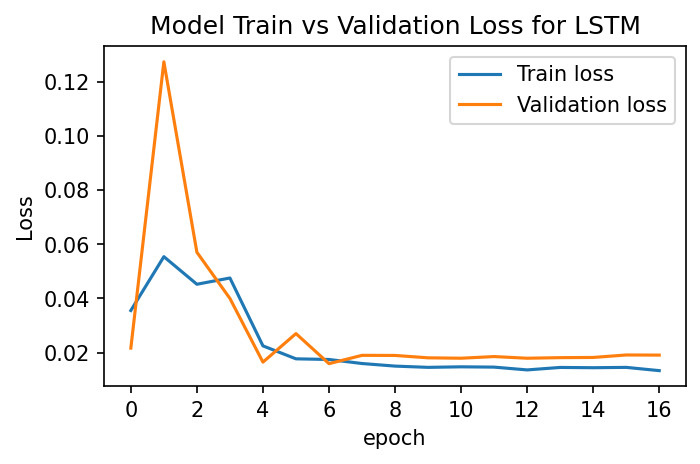

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])
Predicting test data...
Plotting true data and predictions...


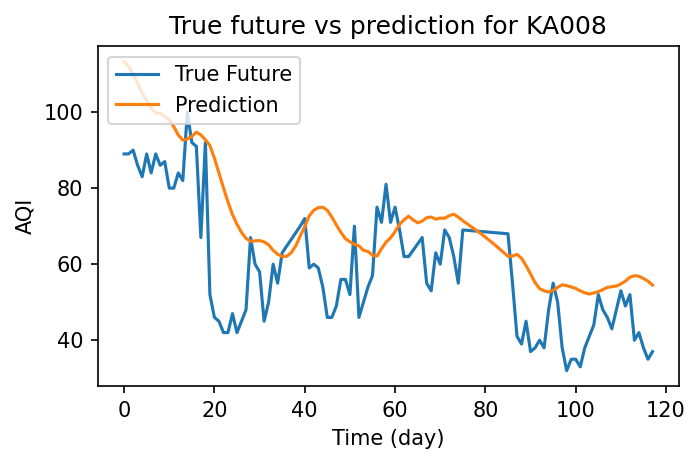

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,AQI,Predicted AQI
Date,,,,,,,,,,,,,
2020-03-06,33.08,71.25,1.300000,23.20,14.90,12.680,0.92,2.387978,59.47,0.19,1.06,89.0,113.236885
2020-03-07,46.35,82.91,6.400000,35.81,23.95,14.645,1.20,2.374719,32.43,0.26,1.97,89.0,112.018402
2020-03-08,41.76,89.33,5.125000,32.39,20.95,16.610,1.00,2.361461,34.47,0.23,1.62,90.0,110.045250
2020-03-09,41.89,75.36,3.850000,31.05,19.68,15.370,1.00,2.348202,42.90,0.27,1.87,86.0,107.544960
2020-03-10,43.49,79.47,2.575000,33.97,21.71,13.490,0.99,2.334944,42.72,0.26,1.99,83.0,105.076897
2020-03-11,42.67,75.99,1.300000,37.66,24.56,11.060,1.00,2.321685,43.47,0.29,1.98,89.0,102.876907
2020-03-12,35.90,74.64,11.700000,37.65,24.54,10.180,0.97,2.308427,45.38,0.29,1.89,84.0,100.994499
2020-03-13,41.57,72.51,22.100000,41.39,27.98,10.050,1.06,2.295169,37.74,0.28,2.14,89.0,99.811440
2020-03-14,34.24,76.77,6.200000,40.16,27.22,10.290,1.04,2.281910,32.01,0.28,2.36,86.0,99.656166


Evaluating predictions...
LSTM:
Mean Absolute Error: 12.5661
Root Mean Square Error: 15.6074
Coefficient of Determination: 0.0777

Training model for KA009...
Model: "sequential_56"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_112 (LSTM)              (None, 30, 100)           43600     
_________________________________________________________________
dropout_112 (Dropout)        (None, 30, 100)           0         
_________________________________________________________________
lstm_113 (LSTM)              (None, 64)                42240     
_________________________________________________________________
dropout_113 (Dropout)        (None, 64)                0         
_________________________________________________________________
dense_56 (Dense)             (None, 1)                 65        
Total params: 85,905
Trainable params: 85,905
Non-trainable params: 0
______________________

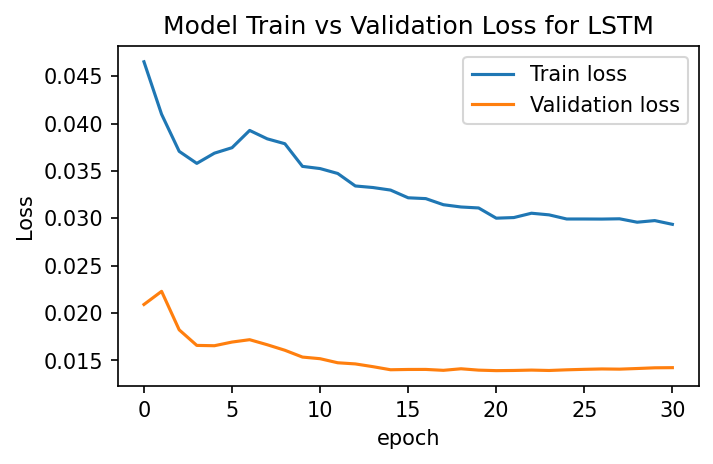

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])
Predicting test data...
Plotting true data and predictions...


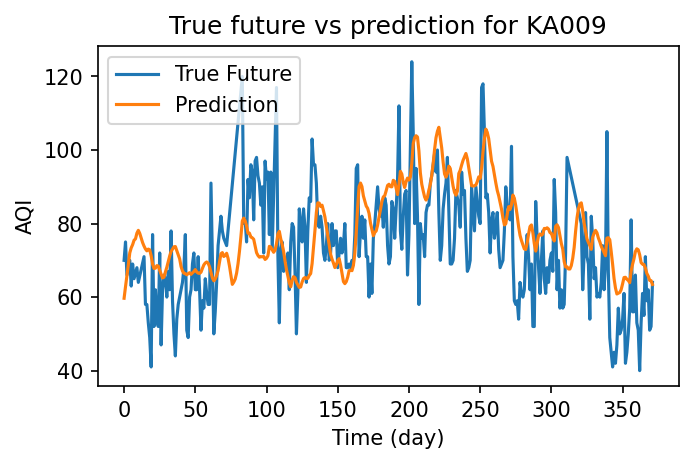

,PM2.5,NO,NO2,NOx,NH3,CO,SO2,Toluene,AQI,Predicted AQI
Date,,,,,,,,,,
2019-06-26,34.780000,3.010000,28.360000,31.08,31.960000,0.97,4.140000,0.97,70.00,59.684013
2019-06-27,34.740000,3.190000,28.820000,31.99,27.070000,0.99,4.080000,0.99,75.00,62.841679
2019-06-28,39.390000,2.720000,27.600000,30.30,22.770000,1.17,4.110000,1.17,66.00,65.733704
2019-06-29,41.100000,2.930000,28.390000,31.32,21.240000,0.81,3.490000,0.81,68.00,68.839737
2019-06-30,28.560000,2.770000,27.330000,30.09,20.910000,0.97,3.080000,0.97,70.00,72.030228
2019-07-01,30.520000,2.850000,27.700000,30.55,21.240000,0.92,3.290000,0.92,63.00,73.384109
2019-07-02,32.230000,3.420000,30.960000,34.37,23.310000,0.94,3.290000,0.94,69.00,74.267426
2019-07-03,28.390000,2.680000,27.700000,30.38,21.550000,0.91,3.150000,0.91,65.00,75.468987
2019-07-04,36.480000,3.240000,30.510000,33.75,24.090000,1.16,5.000000,1.16,66.50,75.833443


Evaluating predictions...
LSTM:
Mean Absolute Error: 12.1163
Root Mean Square Error: 15.0954
Coefficient of Determination: 0.0152

Training model for KA010...
Model: "sequential_57"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_114 (LSTM)              (None, 30, 100)           42800     
_________________________________________________________________
dropout_114 (Dropout)        (None, 30, 100)           0         
_________________________________________________________________
lstm_115 (LSTM)              (None, 64)                42240     
_________________________________________________________________
dropout_115 (Dropout)        (None, 64)                0         
_________________________________________________________________
dense_57 (Dense)             (None, 1)                 65        
Total params: 85,105
Trainable params: 85,105
Non-trainable params: 0
______________________

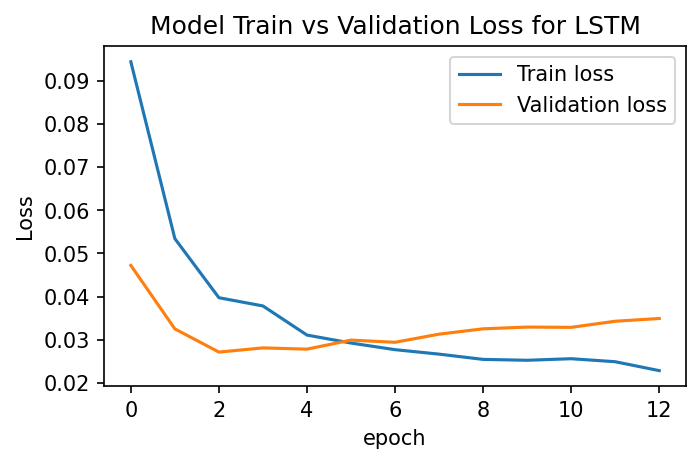

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])
Predicting test data...
Plotting true data and predictions...


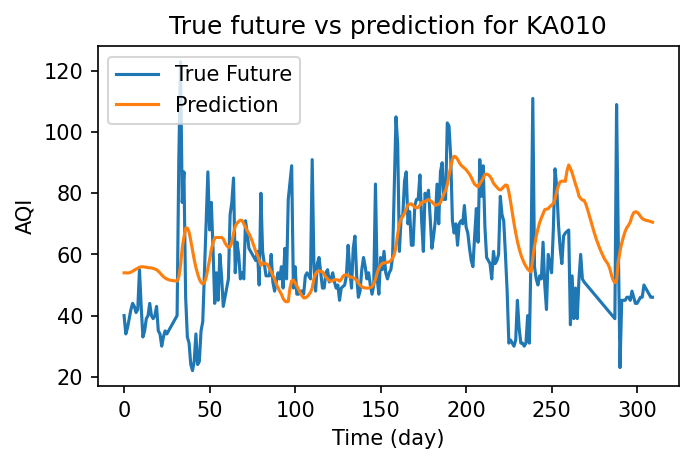

,PM10,NO,NO2,NOx,CO,SO2,AQI,Predicted AQI
Date,,,,,,,,
2019-08-27,25.81,5.94,7.60,13.49,0.36,1.81,40.0,53.980015
2019-08-28,29.45,5.25,7.28,12.51,0.38,2.47,34.0,54.013138
2019-08-29,39.54,4.05,6.03,10.08,0.37,3.43,36.0,53.925034
2019-08-30,38.55,4.64,6.50,11.12,0.35,3.50,39.0,53.990211
2019-08-31,44.20,3.78,5.68,9.44,0.36,2.44,42.0,54.201836
2019-09-01,44.02,3.88,5.84,9.70,0.37,2.77,44.0,54.510521
2019-09-02,42.16,3.56,5.87,9.02,0.35,3.50,43.0,54.883663
2019-09-03,41.62,3.79,5.79,9.57,0.36,5.00,41.0,55.170372
2019-09-04,42.22,3.97,5.98,9.92,0.36,4.83,42.0,55.479897


Evaluating predictions...
LSTM:
Mean Absolute Error: 15.4731
Root Mean Square Error: 19.4956
Coefficient of Determination: -0.3413

Training model for KA011...
Model: "sequential_58"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_116 (LSTM)              (None, 30, 100)           44800     
_________________________________________________________________
dropout_116 (Dropout)        (None, 30, 100)           0         
_________________________________________________________________
lstm_117 (LSTM)              (None, 64)                42240     
_________________________________________________________________
dropout_117 (Dropout)        (None, 64)                0         
_________________________________________________________________
dense_58 (Dense)             (None, 1)                 65        
Total params: 87,105
Trainable params: 87,105
Non-trainable params: 0
_____________________

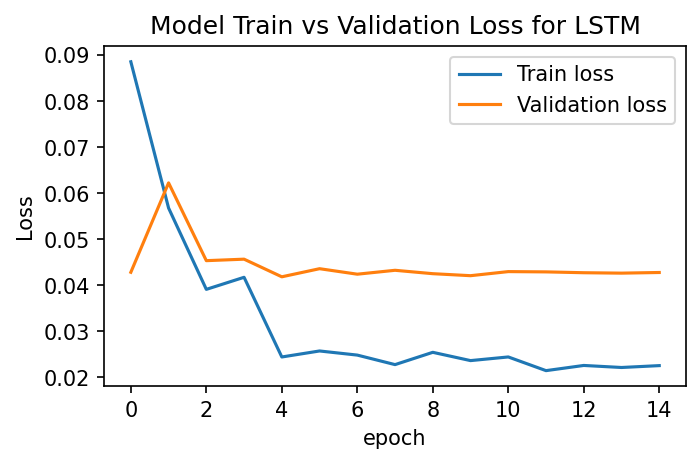

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])
Predicting test data...
Plotting true data and predictions...


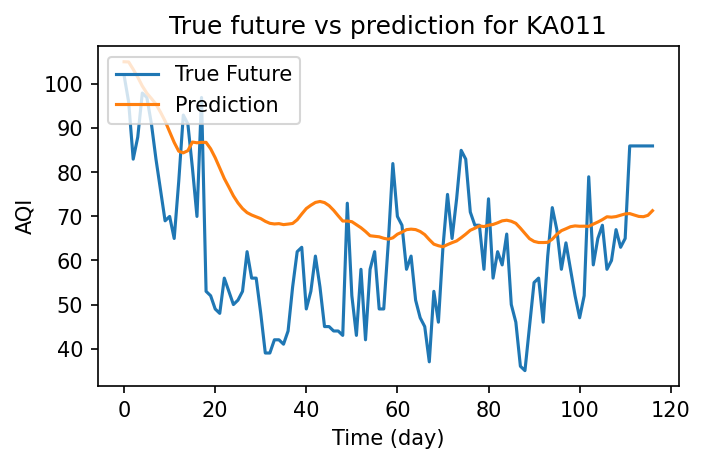

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,AQI,Predicted AQI
Date,,,,,,,,,,,,,
2020-03-07,35.57,104.28,8.86,24.60,20.29,13.17,1.23,2.62,33.93,0.64,1.32,102.0,105.101814
2020-03-08,28.20,82.89,2.28,14.35,9.50,13.18,1.12,2.57,31.19,0.60,1.13,96.0,105.059639
2020-03-09,29.11,89.87,8.31,21.02,17.95,12.19,1.16,2.55,33.13,0.62,1.12,83.0,103.387398
2020-03-10,30.93,90.40,3.33,18.81,12.72,11.16,1.10,2.69,37.49,0.60,1.16,88.0,101.613472
2020-03-11,29.24,96.62,6.64,24.54,18.45,9.71,1.20,2.77,33.30,0.62,1.18,98.0,99.588776
2020-03-12,29.53,91.62,12.40,27.34,24.62,8.95,1.23,2.64,27.39,0.62,1.18,97.0,97.970711
2020-03-13,29.13,87.71,12.59,20.85,21.32,9.59,1.09,2.69,24.50,0.62,1.12,91.0,96.757103
2020-03-14,25.50,77.19,4.00,18.48,13.09,9.07,1.00,2.56,24.93,0.61,1.09,83.0,95.468552
2020-03-15,24.85,75.45,2.00,17.09,10.72,10.07,1.01,2.63,27.90,0.60,0.96,76.0,93.661591


Evaluating predictions...
LSTM:
Mean Absolute Error: 14.4944
Root Mean Square Error: 17.0761
Coefficient of Determination: -0.1534

Training model for KL008...
Model: "sequential_59"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_118 (LSTM)              (None, 30, 100)           44000     
_________________________________________________________________
dropout_118 (Dropout)        (None, 30, 100)           0         
_________________________________________________________________
lstm_119 (LSTM)              (None, 64)                42240     
_________________________________________________________________
dropout_119 (Dropout)        (None, 64)                0         
_________________________________________________________________
dense_59 (Dense)             (None, 1)                 65        
Total params: 86,305
Trainable params: 86,305
Non-trainable params: 0
_____________________

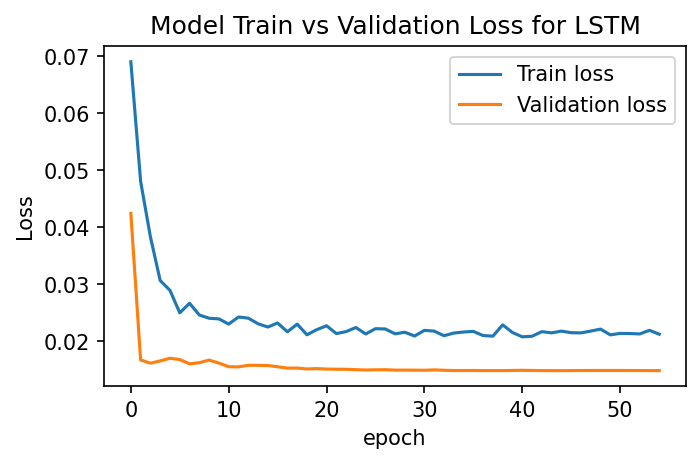

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])
Predicting test data...
Plotting true data and predictions...


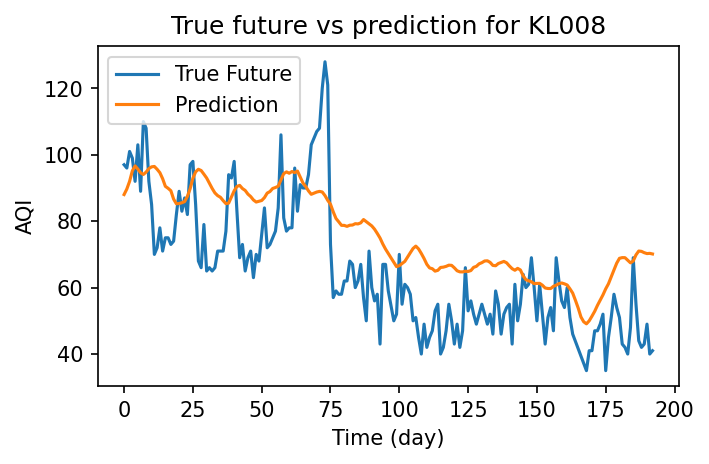

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,AQI,Predicted AQI
Date,,,,,,,,,,,
2019-12-22,38.11,63.31,9.090000,15.066250,14.526250,10.665455,1.530,9.74,46.20,97.0,88.024788
2019-12-23,44.80,68.62,9.910000,15.597500,14.987500,10.716364,1.660,9.65,42.96,96.0,89.695290
2019-12-24,51.96,80.62,9.315000,16.128750,15.448750,10.767273,1.940,9.43,38.60,101.0,91.996719
2019-12-25,36.39,58.38,8.720000,16.660000,15.910000,10.818182,1.560,9.57,46.83,99.0,95.158653
2019-12-26,12.52,38.64,8.870000,16.210000,15.810000,10.869091,1.590,9.48,47.93,92.0,96.648056
2019-12-27,21.29,49.14,9.001667,16.900000,15.821000,10.920000,1.890,9.29,29.09,103.0,95.680138
2019-12-28,32.54,62.85,9.133333,17.590000,15.832000,10.425000,1.630,8.58,37.06,89.0,94.581940
2019-12-29,45.06,72.67,9.265000,18.280000,15.843000,9.930000,1.785,9.30,44.11,110.0,94.061020
2019-12-30,44.74,73.72,9.396667,18.970000,15.854000,9.580000,1.940,8.64,43.56,108.0,94.784515


Evaluating predictions...
LSTM:
Mean Absolute Error: 14.4720
Root Mean Square Error: 16.5832
Coefficient of Determination: 0.2674

Training model for MH005...
Model: "sequential_60"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_120 (LSTM)              (None, 30, 100)           44800     
_________________________________________________________________
dropout_120 (Dropout)        (None, 30, 100)           0         
_________________________________________________________________
lstm_121 (LSTM)              (None, 64)                42240     
_________________________________________________________________
dropout_121 (Dropout)        (None, 64)                0         
_________________________________________________________________
dense_60 (Dense)             (None, 1)                 65        
Total params: 87,105
Trainable params: 87,105
Non-trainable params: 0
______________________

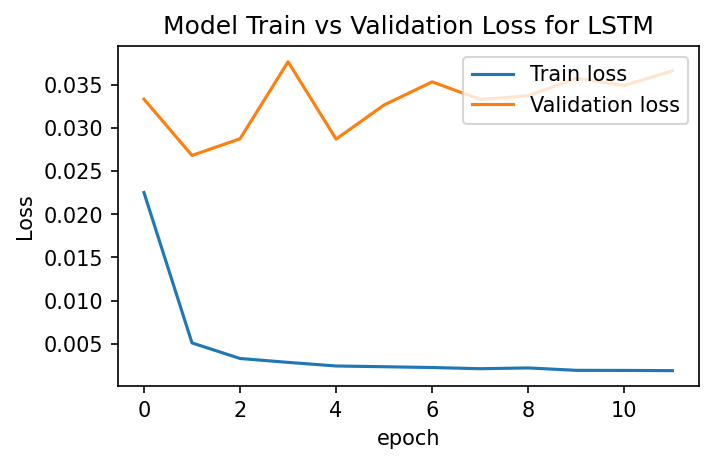

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])
Predicting test data...
Plotting true data and predictions...


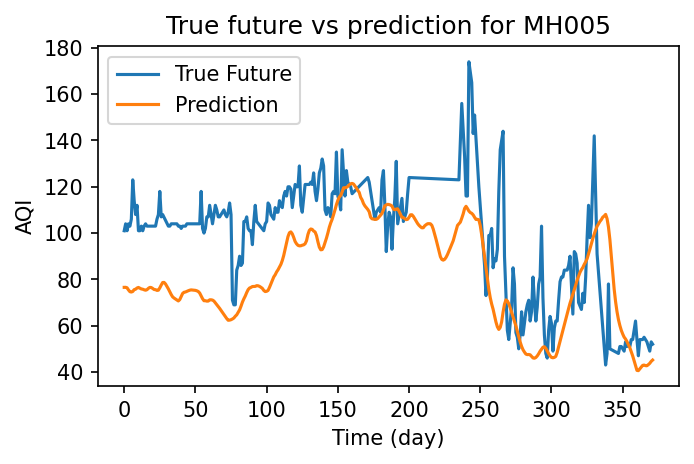

,PM2.5,PM10,NO,NO2,NOx,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,Predicted AQI
Date,,,,,,,,,,,,,
2019-06-26,12.10,56.55,35.450,15.31,50.72,2.02,25.11000,10.46,0.49,0.0,0.0,101.0,76.554512
2019-06-27,11.71,41.46,48.270,15.52,63.79,2.17,19.36000,10.54,1.06,0.0,0.0,104.0,76.569778
2019-06-28,9.75,36.68,23.280,16.20,39.49,1.98,0.29000,10.25,0.22,0.0,0.0,101.0,76.380722
2019-06-29,10.34,51.88,40.680,19.73,60.41,2.07,0.42000,10.39,0.27,0.0,0.0,104.0,75.433372
2019-06-30,15.15,66.79,44.670,20.29,64.97,2.12,0.56000,9.90,0.39,0.0,0.0,103.0,74.679871
2019-07-01,9.86,35.35,62.510,20.41,82.91,2.24,9.71000,10.74,0.50,0.0,0.0,106.0,74.535149
2019-07-02,12.48,32.22,71.480,26.49,97.97,2.56,24.85000,12.48,0.80,0.0,0.0,123.0,74.771057
2019-07-03,11.36,43.30,57.760,19.55,77.30,2.42,24.71000,11.63,2.06,0.0,0.0,114.0,75.577881
2019-07-04,14.40,78.90,43.245,16.16,96.67,2.47,24.96000,11.35,0.67,0.0,0.0,108.0,75.755768


Evaluating predictions...
LSTM:
Mean Absolute Error: 21.7796
Root Mean Square Error: 25.8572
Coefficient of Determination: -0.0153

Training model for MH006...
Model: "sequential_61"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_122 (LSTM)              (None, 30, 100)           44400     
_________________________________________________________________
dropout_122 (Dropout)        (None, 30, 100)           0         
_________________________________________________________________
lstm_123 (LSTM)              (None, 64)                42240     
_________________________________________________________________
dropout_123 (Dropout)        (None, 64)                0         
_________________________________________________________________
dense_61 (Dense)             (None, 1)                 65        
Total params: 86,705
Trainable params: 86,705
Non-trainable params: 0
_____________________

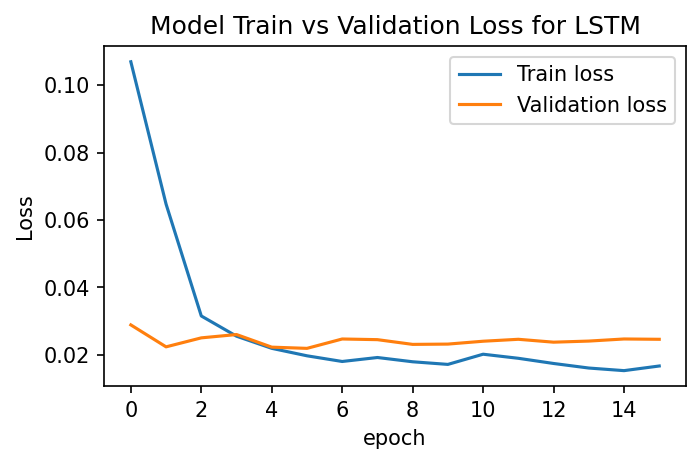

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])
Predicting test data...
Plotting true data and predictions...


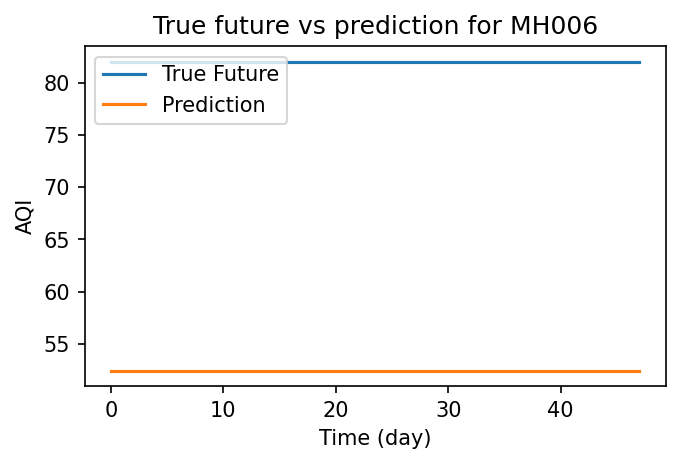

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,AQI,Predicted AQI
Date,,,,,,,,,,,,
2020-05-15,20.88,75.62,3.08,0.87,3.84,2.94,0.3,3.53,2.92,0.06,82.0,52.451862
2020-05-16,20.88,75.62,3.08,0.87,3.84,2.94,0.3,3.53,2.92,0.06,82.0,52.451862
2020-05-17,20.88,75.62,3.08,0.87,3.84,2.94,0.3,3.53,2.92,0.06,82.0,52.451862
2020-05-18,20.88,75.62,3.08,0.87,3.84,2.94,0.3,3.53,2.92,0.06,82.0,52.451862
2020-05-19,20.88,75.62,3.08,0.87,3.84,2.94,0.3,3.53,2.92,0.06,82.0,52.451862
2020-05-20,20.88,75.62,3.08,0.87,3.84,2.94,0.3,3.53,2.92,0.06,82.0,52.451862
2020-05-21,20.88,75.62,3.08,0.87,3.84,2.94,0.3,3.53,2.92,0.06,82.0,52.451862
2020-05-22,20.88,75.62,3.08,0.87,3.84,2.94,0.3,3.53,2.92,0.06,82.0,52.451862
2020-05-23,20.88,75.62,3.08,0.87,3.84,2.94,0.3,3.53,2.92,0.06,82.0,52.451862


Evaluating predictions...
LSTM:
Mean Absolute Error: 29.5481
Root Mean Square Error: 29.5481
Coefficient of Determination: 0.0000

Training model for MH007...
Model: "sequential_62"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_124 (LSTM)              (None, 30, 100)           44400     
_________________________________________________________________
dropout_124 (Dropout)        (None, 30, 100)           0         
_________________________________________________________________
lstm_125 (LSTM)              (None, 64)                42240     
_________________________________________________________________
dropout_125 (Dropout)        (None, 64)                0         
_________________________________________________________________
dense_62 (Dense)             (None, 1)                 65        
Total params: 86,705
Trainable params: 86,705
Non-trainable params: 0
______________________

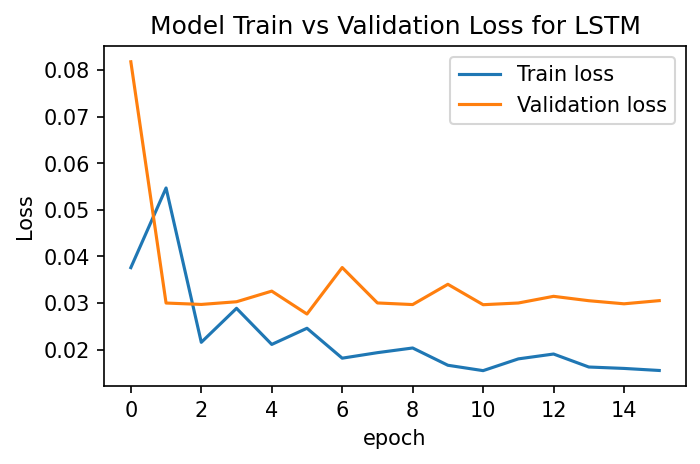

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])
Predicting test data...
Plotting true data and predictions...


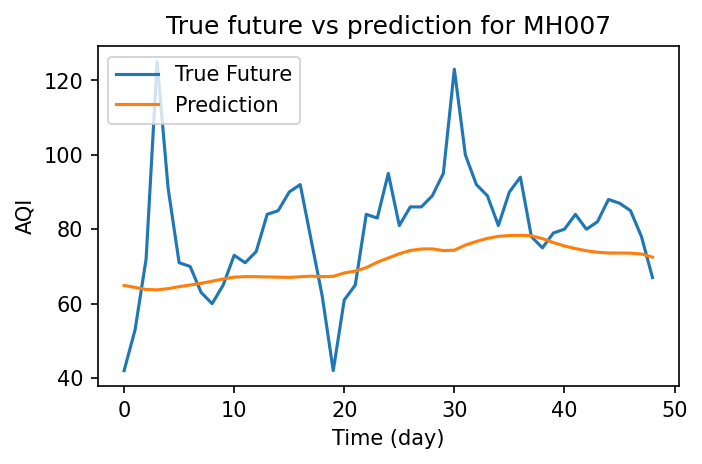

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,AQI,Predicted AQI
Date,,,,,,,,,,,,
2020-05-14,9.35,24.61,19.64,23.21,42.86,3.85,0.13,0.08,6.64,0.14,42.0,64.894600
2020-05-15,5.13,43.47,17.13,25.05,42.17,3.54,0.15,0.08,6.61,0.10,53.0,64.366867
2020-05-16,21.09,116.18,22.40,23.70,46.10,5.56,0.14,1.04,6.38,0.10,72.0,63.807903
2020-05-17,12.52,116.35,32.37,20.88,53.26,7.25,0.13,1.56,6.37,0.10,125.0,63.708336
2020-05-18,13.71,80.82,21.57,25.40,46.97,6.48,0.10,1.13,6.49,0.06,91.0,64.036484
2020-05-19,6.86,54.56,33.89,19.32,53.21,7.36,0.10,1.63,6.33,0.10,71.0,64.563095
2020-05-20,18.03,36.57,34.88,18.58,53.46,6.04,0.13,1.55,6.87,0.16,70.0,65.006546
2020-05-21,28.49,37.00,28.20,21.21,49.40,5.45,0.13,0.95,6.60,0.21,63.0,65.474548
2020-05-22,26.65,43.86,25.28,22.56,47.84,5.65,0.14,0.79,6.51,0.21,60.0,66.035309


Evaluating predictions...
LSTM:
Mean Absolute Error: 12.8368
Root Mean Square Error: 17.0804
Coefficient of Determination: -0.1860

Training model for MH008...
Model: "sequential_63"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_126 (LSTM)              (None, 30, 100)           44400     
_________________________________________________________________
dropout_126 (Dropout)        (None, 30, 100)           0         
_________________________________________________________________
lstm_127 (LSTM)              (None, 64)                42240     
_________________________________________________________________
dropout_127 (Dropout)        (None, 64)                0         
_________________________________________________________________
dense_63 (Dense)             (None, 1)                 65        
Total params: 86,705
Trainable params: 86,705
Non-trainable params: 0
_____________________

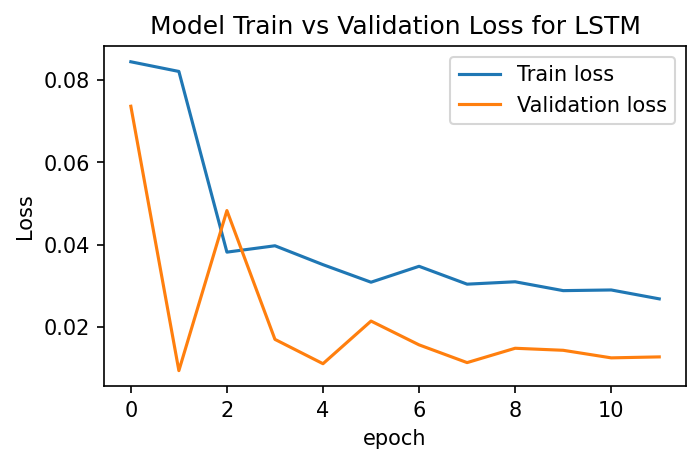

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])
Predicting test data...
Plotting true data and predictions...


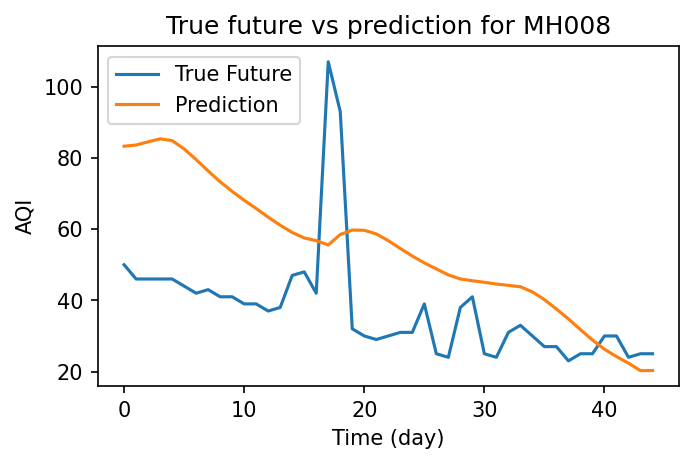

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,AQI,Predicted AQI
Date,,,,,,,,,,,,
2020-05-18,13.2750,41.130,11.25,6.58,7.40,2.13,0.64,22.05,45.31,2.083889,50.0,83.282570
2020-05-19,14.4125,32.305,24.42,7.37,19.90,2.46,0.60,15.47,43.50,2.016667,46.0,83.623055
2020-05-20,15.5500,23.480,19.79,15.12,22.24,6.92,0.59,14.51,41.77,1.949444,46.0,84.514069
2020-05-21,11.8900,15.800,13.68,12.83,22.73,6.35,0.52,8.38,41.43,1.882222,46.0,85.355476
2020-05-22,11.2300,15.360,4.67,6.27,10.94,3.85,0.50,7.45,42.69,1.815000,46.0,84.861015
2020-05-23,14.2600,24.510,4.68,6.31,11.00,3.81,0.48,6.37,40.46,1.747778,44.0,82.523544
2020-05-24,11.7700,29.730,4.66,6.26,10.92,3.83,0.44,5.75,38.91,1.680556,42.0,79.540596
2020-05-25,12.3000,33.940,4.61,6.31,10.92,3.83,0.44,5.71,38.49,1.613333,43.0,76.340919
2020-05-26,13.5800,35.830,4.66,6.34,11.00,3.82,0.44,5.62,38.12,1.546111,41.0,73.305740


Evaluating predictions...
LSTM:
Mean Absolute Error: 21.3391
Root Mean Square Error: 24.7236
Coefficient of Determination: -1.4649

Training model for MH009...
Model: "sequential_64"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_128 (LSTM)              (None, 30, 100)           44400     
_________________________________________________________________
dropout_128 (Dropout)        (None, 30, 100)           0         
_________________________________________________________________
lstm_129 (LSTM)              (None, 64)                42240     
_________________________________________________________________
dropout_129 (Dropout)        (None, 64)                0         
_________________________________________________________________
dense_64 (Dense)             (None, 1)                 65        
Total params: 86,705
Trainable params: 86,705
Non-trainable params: 0
_____________________

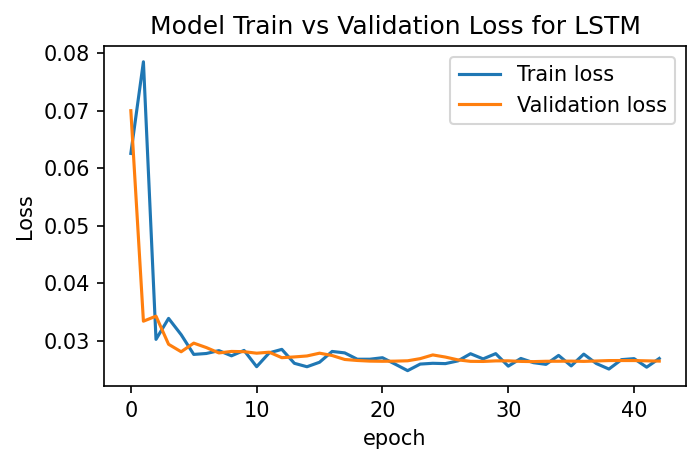

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])
Predicting test data...
Plotting true data and predictions...


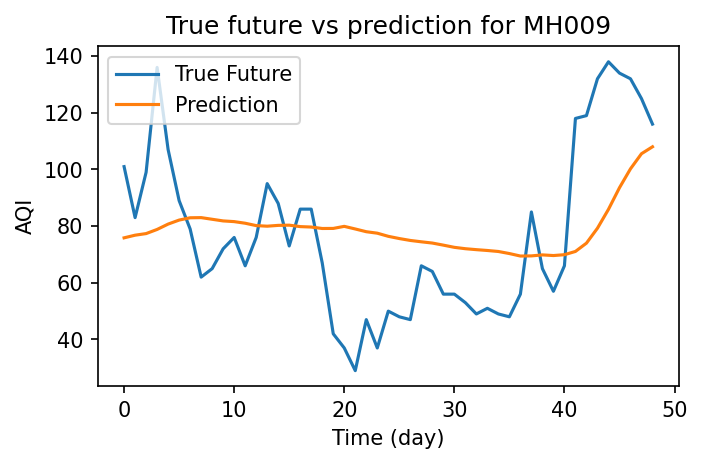

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,AQI,Predicted AQI
Date,,,,,,,,,,,,
2020-05-14,14.35,109.49,5.19,6.71,11.88,2.65,0.26,11.66,16.41,2.93,101.0,75.867027
2020-05-15,12.75,84.02,7.09,6.84,13.88,4.40,0.25,19.50,16.58,1.88,83.0,76.800705
2020-05-16,24.60,135.31,7.80,6.39,14.12,4.79,0.23,20.88,16.03,4.36,99.0,77.365349
2020-05-17,25.70,134.71,5.97,5.87,11.82,4.31,0.22,22.56,21.37,1.39,136.0,78.830345
2020-05-18,18.42,97.70,7.99,7.59,15.58,6.44,0.22,22.86,21.57,0.77,107.0,80.718880
2020-05-19,12.46,88.94,10.83,9.43,20.14,5.72,0.20,21.74,17.86,1.42,89.0,82.135666
2020-05-20,9.34,63.64,8.50,10.09,18.57,7.59,0.21,24.76,21.70,1.06,79.0,82.945915
2020-05-21,8.17,63.36,6.93,8.39,15.32,3.08,0.21,24.12,20.15,1.08,62.0,83.003036
2020-05-22,9.38,66.73,12.34,10.25,22.49,3.16,0.22,25.97,18.85,1.38,65.0,82.416847


Evaluating predictions...
LSTM:
Mean Absolute Error: 21.7182
Root Mean Square Error: 26.2876
Coefficient of Determination: 0.2172

Training model for MH010...
Model: "sequential_65"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_130 (LSTM)              (None, 30, 100)           44400     
_________________________________________________________________
dropout_130 (Dropout)        (None, 30, 100)           0         
_________________________________________________________________
lstm_131 (LSTM)              (None, 64)                42240     
_________________________________________________________________
dropout_131 (Dropout)        (None, 64)                0         
_________________________________________________________________
dense_65 (Dense)             (None, 1)                 65        
Total params: 86,705
Trainable params: 86,705
Non-trainable params: 0
______________________

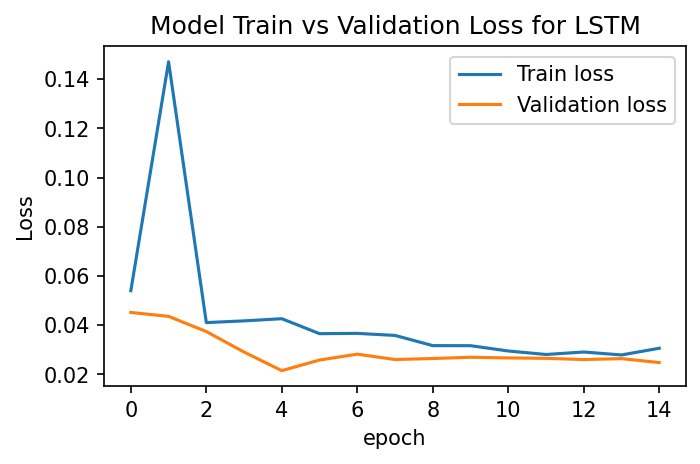

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])
Predicting test data...
Plotting true data and predictions...


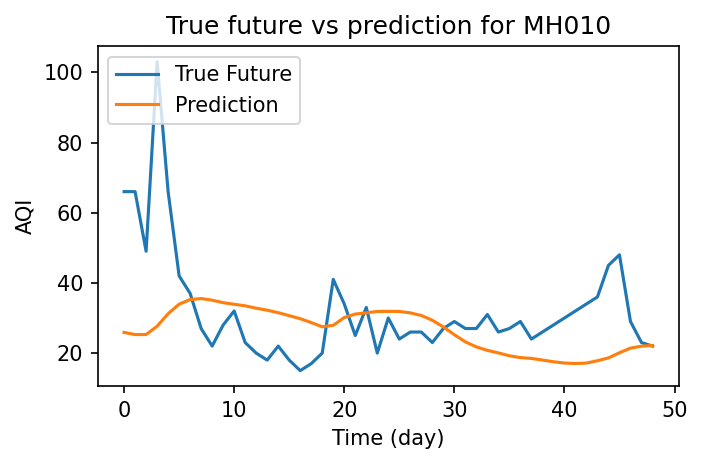

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,AQI,Predicted AQI
Date,,,,,,,,,,,,
2020-05-14,13.83,34.50,12.23,0.75,11.88,0.56,0.21,1.870,20.90,0.55,66.0,25.889481
2020-05-15,15.55,39.53,11.19,1.96,11.99,0.54,0.22,1.475,27.77,0.98,66.0,25.279331
2020-05-16,27.54,113.02,11.13,1.45,11.35,1.13,0.20,1.080,25.36,0.56,49.0,25.288021
2020-05-17,31.90,94.22,10.59,0.98,10.74,0.64,0.21,2.780,29.27,0.71,103.0,27.648672
2020-05-18,20.28,45.66,10.87,0.72,11.10,1.14,0.21,0.960,29.59,1.09,66.0,31.213697
2020-05-19,13.11,40.22,7.82,1.27,8.19,0.73,0.21,6.930,23.15,0.41,42.0,33.935619
2020-05-20,10.79,31.26,0.85,2.40,3.25,2.16,0.25,11.160,16.52,0.61,37.0,35.261509
2020-05-21,8.90,18.96,0.76,2.17,2.93,1.38,0.27,10.270,16.19,1.11,27.0,35.533478
2020-05-22,9.07,24.44,0.60,2.04,2.64,0.85,0.24,8.120,15.65,0.65,22.0,35.074776


In [120]:
for stn, df in stn_dict.items():
    X_train = df['X_train'] 
    X_test  = df['X_test']
    y_train = df['y_train'] 
    y_test  = df['y_test']
    scaler_x = df['scaler_x']
    scaler_y = df['scaler_y']
    pollutant_holder = df['pollutant_holder']
    AQI_holder = df['AQI_holder']
    
    print(f"Training model for {stn}...")
    model = create_model(64, LSTM)
    model.summary()
    history = fit_model(model)
    
    print("Plottin training and validation loss")
    plot_loss (history, 'LSTM')
    
    y_test = scaler_y.inverse_transform(y_test)
    y_train = scaler_y.inverse_transform(y_train)
    
    print('Predicting test data...')
    predictions = prediction(model, scaler_y)
    
    print('Plotting true data and predictions...')
    plot_future(predictions, 'LSTM', y_test, stn)
    
    table = tabulate(predictions, pollutant_holder, AQI_holder)
    display(table.head(len(table)))
    
    print('Evaluating predictions...')
    evaluate_prediction(predictions, y_test, 'LSTM')